# Сборный проект 2

# Предсказание коэффициента восстановления золота из золотосодержащей руды

# Описание проекта

Необходимо подготовить прототип модели машинного обучения компании. Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды, используя данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Задачи проекта:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

# Описание данных

**Технологический процесс**

-    Rougher feed — исходное сырье
-    Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
        1. Xanthate **— ксантогенат (промотер, или активатор флотации);
        2. Sulphate — сульфат (на данном производстве сульфид натрия);
        3. Depressant — депрессант (силикат натрия).
-    Rougher process (англ. «грубый процесс») — флотация
-    Rougher tails — отвальные хвосты
-    Float banks — флотационная установка
-    Cleaner process — очистка
-    Rougher Au — черновой концентрат золота
-    Final Au — финальный концентрат золота

Параметры этапов

-    air amount — объём воздуха
-    fluid levels — уровень жидкости
-    feed size — размер гранул сырья
-    feed rate — скорость подачи

**Наименование признаков**

Наименование признаков должно быть такое:
[этап].[тип_параметра].[название_параметра]

Пример: rougher.input.feed_ag

Возможные значения для блока [этап]:

-    rougher — флотация
-    primary_cleaner — первичная очистка
-    secondary_cleaner — вторичная очистка
-    final — финальные характеристики

Возможные значения для блока [тип_параметра]:

-    input — параметры сырья
-    output — параметры продукта
-    state — параметры, характеризующие текущее состояние этапа
-    calculation — расчётные характеристики

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span><ul class="toc-item"><li><span><a href="#Открыть-файлы-и-изучить-их" data-toc-modified-id="Открыть-файлы-и-изучить-их-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Открыть файлы и изучить их</a></span></li><li><span><a href="#Проверка,-что-эффективность-обогащения-рассчитана-правильно." data-toc-modified-id="Проверка,-что-эффективность-обогащения-рассчитана-правильно.-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Проверка, что эффективность обогащения рассчитана правильно.</a></span></li><li><span><a href="#Анализ-признаков,-недоступных-в-тестовой-выборке" data-toc-modified-id="Анализ-признаков,-недоступных-в-тестовой-выборке-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Анализ признаков, недоступных в тестовой выборке</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Предобработка данных</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Анализ-изменения-концентрации-металлов-(Au,-Ag,-Pb)-на-различных-этапах-очистки." data-toc-modified-id="Анализ-изменения-концентрации-металлов-(Au,-Ag,-Pb)-на-различных-этапах-очистки.-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Анализ изменения концентрации металлов (Au, Ag, Pb) на различных этапах очистки.</a></span></li><li><span><a href="#Сравнение-распределения-размеров-гранул-сырья-на-обучающей-и-тестовой-выборках" data-toc-modified-id="Сравнение-распределения-размеров-гранул-сырья-на-обучающей-и-тестовой-выборках-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках</a></span></li><li><span><a href="#Исследование-суммарной-концентрации-всех-веществ-на-разных-стадиях:-в-сырье,-в-черновом-и-финальном-концентратах." data-toc-modified-id="Исследование-суммарной-концентрации-всех-веществ-на-разных-стадиях:-в-сырье,-в-черновом-и-финальном-концентратах.-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Исследование суммарной концентрации всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах.</a></span></li></ul></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span><ul class="toc-item"><li><span><a href="#Функция-для-вычисления-итоговой-sMAPE" data-toc-modified-id="Функция-для-вычисления-итоговой-sMAPE-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Функция для вычисления итоговой sMAPE</a></span></li><li><span><a href="#Обучение-моделей,-оценка-их-качества-кросс-валидацией.-Проверка-лучшей-на-тестовой-выборке" data-toc-modified-id="Обучение-моделей,-оценка-их-качества-кросс-валидацией.-Проверка-лучшей-на-тестовой-выборке-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Обучение моделей, оценка их качества кросс-валидацией. Проверка лучшей на тестовой выборке</a></span></li></ul></li><li><span><a href="#Общий-вывод" data-toc-modified-id="Общий-вывод-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Общий вывод</a></span></li><li><span><a href="#Чек-лист-готовности-проекта" data-toc-modified-id="Чек-лист-готовности-проекта-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Чек-лист готовности проекта</a></span></li></ul></div>

## Подготовка данных

### Открыть файлы и изучить их

In [84]:
#подключаем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats as st
import seaborn as sns

from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.dummy import DummyRegressor

import time
import warnings
warnings.filterwarnings('ignore')

In [85]:
#функция для чтения файла
def file_reader(file):
    
    df = pd.read_csv(file, parse_dates = True, index_col = 'date')
    print('=======================================')
    print('Первые пять строк:')
    print('=======================================')
    display(df.head(5))
    print('=======================================')
    print('Общая информация по датасету:')
    print('=======================================')
    print(df.info())
    print('=======================================')
    print('Статистическая информация по датасету:')
    print('=======================================')
    display(df.describe())
    print('=======================================')
    print('Количество дубликатов:')
    print('=======================================')
    print(df.duplicated().sum())
    
    return df

In [86]:
df_train = file_reader("/datasets/gold_recovery_train_new.csv")

Первые пять строк:


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


Общая информация по датасету:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14149 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
final.output.concentrate_ag                           14148 non-null float64
final.output.concentrate_pb                           14148 non-null float64
final.output.concentrate_sol                          13938 non-null float64
final.output.concentrate_au                           14149 non-null float64
final.output.recovery                                 14149 non-null float64
final.output.tail_ag                                  14149 non-null float64
final.output.tail_pb                                  14049 non-null float64
final.output.tail_sol                                 14144 non-null float64
final.output.tail_au                                  14149 non-null float64
primary_cleaner.input.sulfate                         14129 non-null float64
primary_cleaner.input.depressant                      14

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,14148.000000,14148.000000,13938.000000,14149.000000,14149.000000,14149.000000,14049.000000,14144.000000,14149.000000,14129.000000,...,14143.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14147.000000,14148.000000
mean,5.142034,10.132960,9.202849,44.003792,66.518832,9.607035,2.597298,10.512122,2.918421,133.320659,...,19.985454,-478.696836,15.487065,-460.229416,16.775136,-483.956022,13.064590,-483.966564,19.577539,-506.798480
std,1.369586,1.654930,2.790516,4.905261,10.295402,2.319069,0.971843,3.003617,0.903712,39.431659,...,5.657723,50.736021,5.255655,58.843586,5.831906,37.892788,5.765617,39.207913,5.764417,37.079249
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003112,...,0.000000,-799.709069,0.000000,-799.889113,-0.372054,-797.142475,0.646208,-800.006180,0.195324,-809.398668
25%,4.211620,9.297355,7.484645,43.276111,62.545817,7.997429,1.905973,8.811324,2.368607,107.006651,...,14.990775,-500.628656,11.894558,-500.149000,11.083980,-500.363177,8.994405,-500.105994,14.989304,-500.745104
50%,4.994652,10.297144,8.845462,44.872436,67.432775,9.480270,2.592022,10.514621,2.851025,133.018328,...,20.001789,-499.681450,14.975536,-499.388738,17.932223,-499.702452,11.997547,-499.914556,19.984175,-500.061431
75%,5.859540,11.170603,10.487508,46.166425,72.346428,11.003707,3.241723,11.933009,3.434764,159.825396,...,24.990826,-477.472413,20.059375,-400.039008,21.346550,-487.712108,17.982903,-453.186936,24.991623,-499.536466
max,16.001945,17.031899,18.124851,52.756638,100.000000,19.552149,5.639565,22.317730,8.197408,250.127834,...,30.115735,-245.239184,24.007913,-145.071088,43.709931,-275.073125,27.926001,-157.396071,32.188906,-104.427459


Количество дубликатов:
0


В обучающем датасете 14149 наблюдений и 86 признаков, дату перевели в индекс (в формате DateTime), наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 

In [87]:
df_test = file_reader("/datasets/gold_recovery_test_new.csv")

Первые пять строк:


,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,-500.810606,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


Общая информация по датасету:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5290 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 52 columns):
primary_cleaner.input.sulfate                 5286 non-null float64
primary_cleaner.input.depressant              5285 non-null float64
primary_cleaner.input.feed_size               5290 non-null float64
primary_cleaner.input.xanthate                5286 non-null float64
primary_cleaner.state.floatbank8_a_air        5290 non-null float64
primary_cleaner.state.floatbank8_a_level      5290 non-null float64
primary_cleaner.state.floatbank8_b_air        5290 non-null float64
primary_cleaner.state.floatbank8_b_level      5290 non-null float64
primary_cleaner.state.floatbank8_c_air        5290 non-null float64
primary_cleaner.state.floatbank8_c_level      5290 non-null float64
primary_cleaner.state.floatbank8_d_air        5290 non-null float64
primary_cleaner.state.floatbank8_d_level      5290 non-null float64
rougher.inp

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,5286.000000,5285.000000,5290.000000,5286.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,...,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000
mean,174.839652,8.683596,7.266339,1.383803,1.539494e+03,-497.665883,1.545174e+03,-500.273098,1.527272e+03,-498.330680,...,1.632007e+01,-505.144570,1.373544e+01,-463.349858,12.804186,-501.329122,9.881145,-495.663398,17.304935,-501.793193
std,43.027080,3.072050,0.610219,0.643474,1.167979e+02,19.952431,1.222246e+02,32.968307,1.225380e+02,21.964876,...,3.493583e+00,31.427337,3.430484e+00,86.189107,3.026591,17.951495,2.868205,34.535007,4.536544,39.044215
min,2.566156,0.003839,5.650000,0.004984,5.445860e-32,-795.316337,6.647490e-32,-799.997015,4.033736e-32,-799.960571,...,1.079872e-16,-799.798523,2.489718e-17,-800.836914,0.069227,-797.323986,0.528083,-800.220337,-0.079426,-809.741464
25%,147.121401,6.489555,6.890000,0.907623,1.498936e+03,-500.357298,1.498971e+03,-500.703002,1.473230e+03,-501.018117,...,1.403618e+01,-500.868258,1.202862e+01,-500.323028,10.914838,-500.726841,8.036719,-500.194668,13.997317,-500.690984
50%,177.828489,8.052207,7.250000,1.197610,1.585129e+03,-499.969164,1.595622e+03,-500.028514,1.549595e+03,-500.017711,...,1.700847e+01,-500.115727,1.496486e+01,-499.576513,12.954182,-499.990332,10.004301,-499.990535,16.014935,-500.007126
75%,208.125438,10.027764,7.600000,1.797819,1.602077e+03,-499.568951,1.602324e+03,-499.293257,1.601144e+03,-498.994130,...,1.803862e+01,-499.404224,1.596213e+01,-400.933805,15.097528,-499.283191,11.997467,-499.719913,21.020013,-499.373018
max,265.983123,40.000000,15.500000,4.102454,2.103104e+03,-57.195404,1.813084e+03,-142.527229,1.715054e+03,-150.937035,...,3.005180e+01,-401.565212,3.126971e+01,-6.506986,25.258848,-244.483566,14.086866,-137.740004,26.705889,-123.307487


Количество дубликатов:
0


В тестовом датасете 5290 наблюдений и 52 признака, дату перевели в индекс (в формате DateTime), наблюдаем незначительные пропуски по некоторым параметрам, дубликатов нет

In [88]:
df_full = file_reader("/datasets/gold_recovery_full_new.csv")

Первые пять строк:


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


Общая информация по датасету:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19439 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
final.output.concentrate_ag                           19438 non-null float64
final.output.concentrate_pb                           19438 non-null float64
final.output.concentrate_sol                          19228 non-null float64
final.output.concentrate_au                           19439 non-null float64
final.output.recovery                                 19439 non-null float64
final.output.tail_ag                                  19438 non-null float64
final.output.tail_pb                                  19338 non-null float64
final.output.tail_sol                                 19433 non-null float64
final.output.tail_au                                  19439 non-null float64
primary_cleaner.input.sulfate                         19415 non-null float64
primary_cleaner.input.depressant                      19

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,19438.000000,19438.000000,19228.000000,19439.000000,19439.000000,19438.000000,19338.000000,19433.000000,19439.000000,19415.000000,...,19433.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19437.000000,19438.000000
mean,5.168470,9.978895,9.501224,44.076513,67.050208,9.688589,2.705795,10.583728,3.042467,144.624774,...,18.987674,-485.894516,15.010366,-461.078636,15.694452,-488.684065,12.198224,-487.149827,18.959024,-505.436305
std,1.372348,1.669240,2.787537,5.129784,10.125840,2.328642,0.949077,2.868782,0.922808,44.464071,...,5.411058,47.758570,4.890228,67.405524,5.510974,34.533396,5.333024,38.347312,5.550498,37.689057
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003112,...,0.000000,-799.798523,0.000000,-800.836914,-0.372054,-797.323986,0.528083,-800.220337,-0.079426,-809.741464
25%,4.251240,9.137262,7.722820,43.402215,63.299712,8.062878,2.040119,8.938947,2.461138,114.107029,...,14.975734,-500.704892,11.940294,-500.187742,10.988606,-500.458467,8.971105,-500.129462,14.983037,-500.728067
50%,5.066094,10.102433,9.218961,45.011244,68.172738,9.743623,2.748730,10.622456,2.984909,143.232103,...,18.017481,-499.837793,14.971014,-499.459786,15.000036,-499.802605,11.019433,-499.935317,19.960541,-500.048400
75%,5.895527,11.035769,10.947813,46.275313,72.686642,11.134294,3.333216,12.104271,3.571351,175.075656,...,23.012470,-498.249730,19.034162,-400.118106,18.026190,-498.384187,14.019088,-499.436708,24.003170,-499.495378
max,16.001945,17.031899,19.615720,52.756638,100.000000,19.552149,5.804178,22.317730,8.245022,265.983123,...,30.115735,-245.239184,31.269706,-6.506986,43.709931,-244.483566,27.926001,-137.740004,32.188906,-104.427459


Количество дубликатов:
0


В исходном датасете 19439 наблюдений и 86 признаков, дату перевели в индекс (в формате DateTime), наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 

Тип данных всех параметров float64. Датасет full (19439 наблюдений) содержит информацию из train и test выборок (14149 + 5290 = 19439 наблюдений). В тестовой выборке не достает 34 признака.

In [89]:
#функция построения графиков
def hist_builder(data_column, label, bins):
    sns.set()
    f, axes = plt.subplots(1, 2, figsize=(20,10))
    axes[0].set_title("Плотность распределения для параметра: " + label, fontsize=20)
    axes[0].set_ylabel("Плотность параметра: " + label, fontsize=18)
    axes[0].set_xlabel("Параметр: " + label, fontsize=18)
    sns.distplot(data_column, axlabel="Параметр: " + label, bins=bins, ax=axes[0])
    
    axes[1].set_title("Boxplot для параметра: " + label, fontsize=18)
    axes[1].set_xlabel("Параметр: " + label, fontsize=18)
    sns.boxplot(data=data_column, orient='h', ax=axes[1])
    plt.show()
#функция анализа аномалий
def anomaly_detection(data_column, label):
    anomaly_threshold_up = data_column.quantile(0.75) + (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    anomaly_threshold_down = data_column.quantile(0.25) - (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    anomaly_percent = round(len(data_column[(data_column > anomaly_threshold_up) | (data_column < anomaly_threshold_down)]) / len(data_column) * 100, 2)
    print("Доля выбросов параметра " + label + " равно: " + str(anomaly_percent) + "%")
    
#итоговая функция
def check_param(bins, dataset):
    print('=======================================')
    print("Анализ параметров датасета")
    print('=======================================')
    for column in dataset.columns:
        print('=======================================')
        print("Анализ параметра '" + column + "':")
        print('=======================================')
        hist_builder(dataset[column], column, bins)
        anomaly_detection(dataset[column], column)


Анализ параметров датасета
Анализ параметра 'final.output.concentrate_ag':


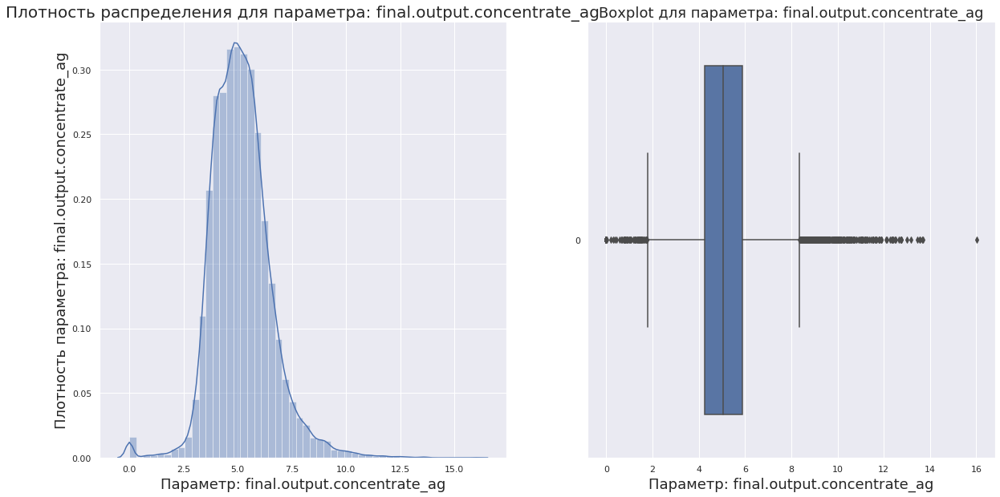

Доля выбросов параметра final.output.concentrate_ag равно: 3.11%
Анализ параметра 'final.output.concentrate_pb':


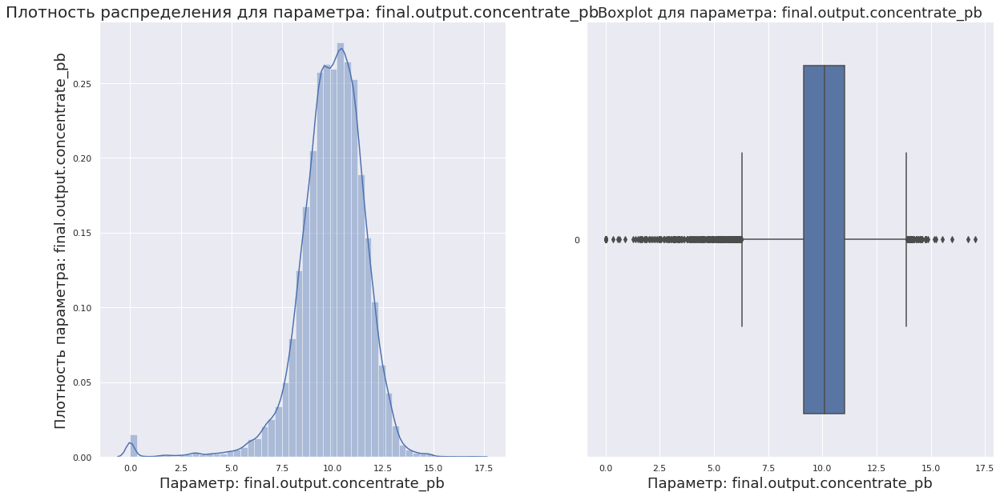

Доля выбросов параметра final.output.concentrate_pb равно: 2.45%
Анализ параметра 'final.output.concentrate_sol':


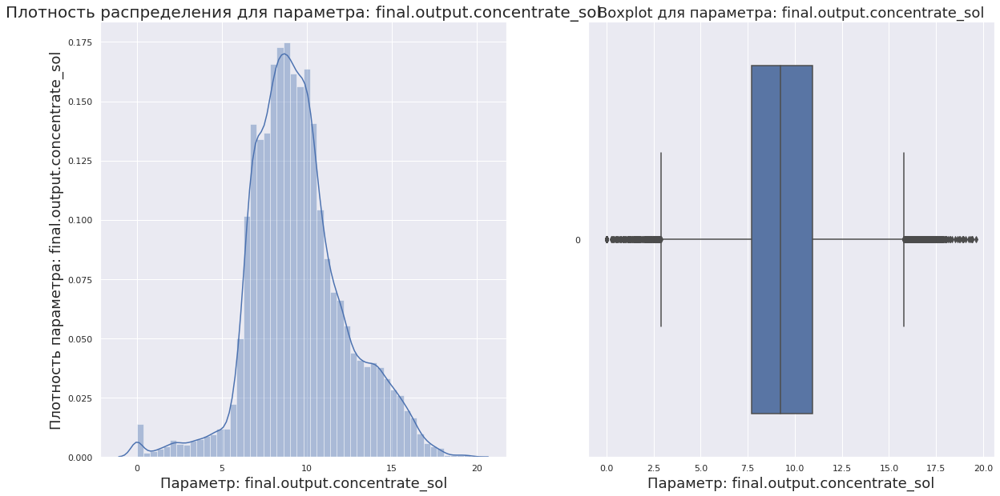

Доля выбросов параметра final.output.concentrate_sol равно: 3.79%
Анализ параметра 'final.output.concentrate_au':


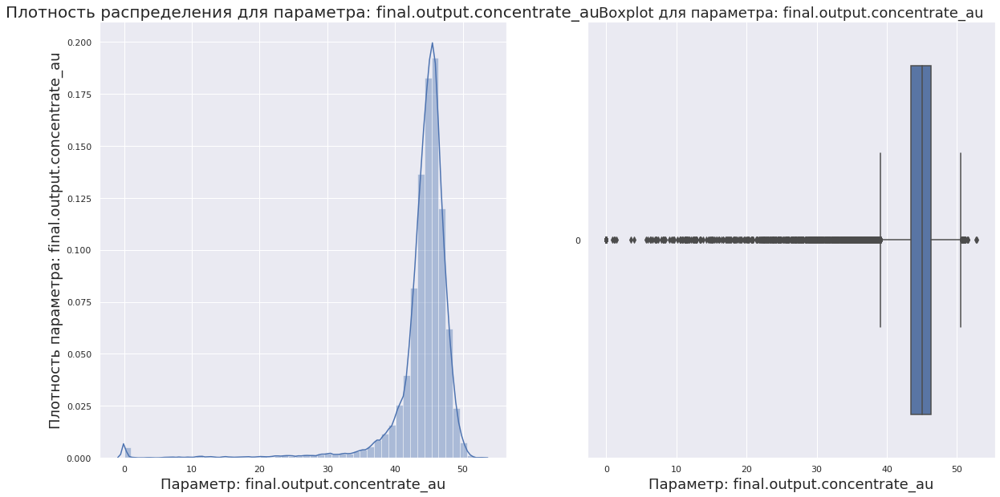

Доля выбросов параметра final.output.concentrate_au равно: 6.36%
Анализ параметра 'final.output.recovery':


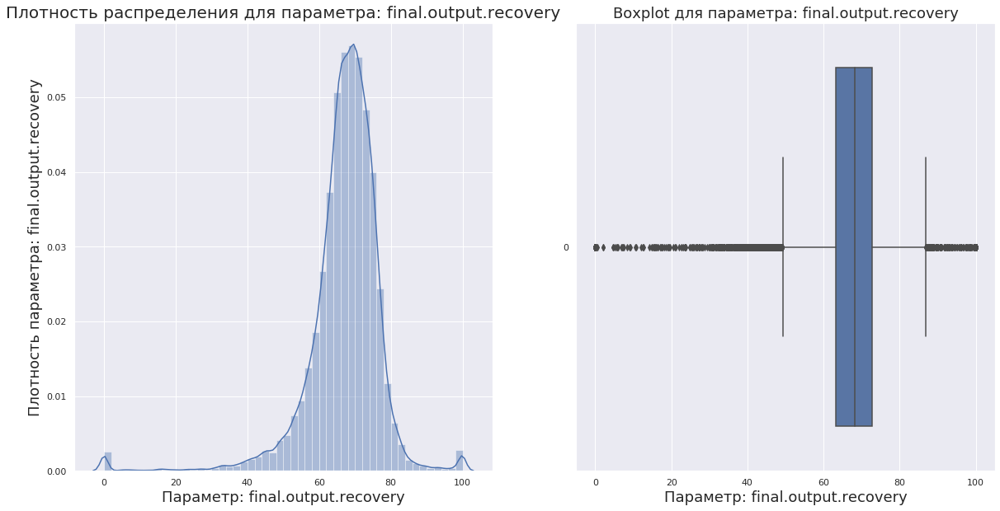

Доля выбросов параметра final.output.recovery равно: 5.02%
Анализ параметра 'final.output.tail_ag':


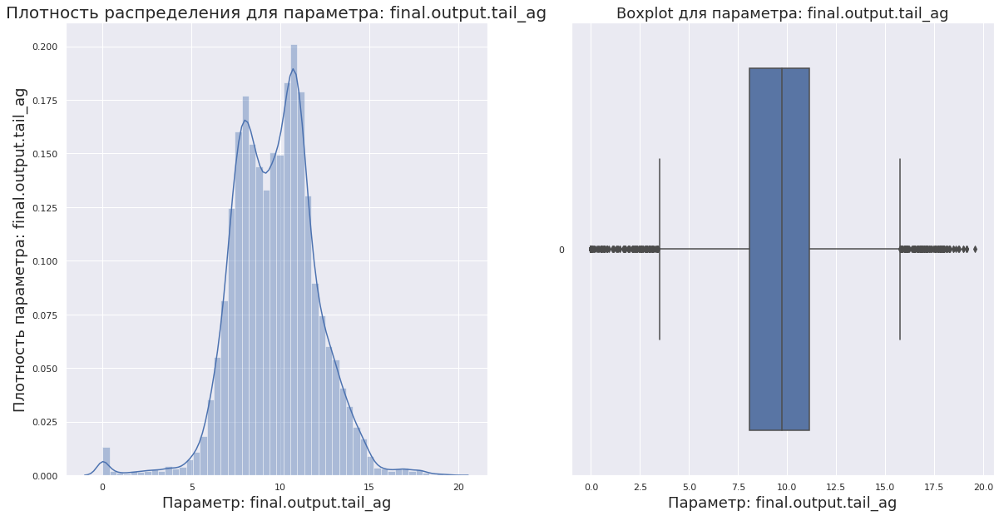

Доля выбросов параметра final.output.tail_ag равно: 1.77%
Анализ параметра 'final.output.tail_pb':


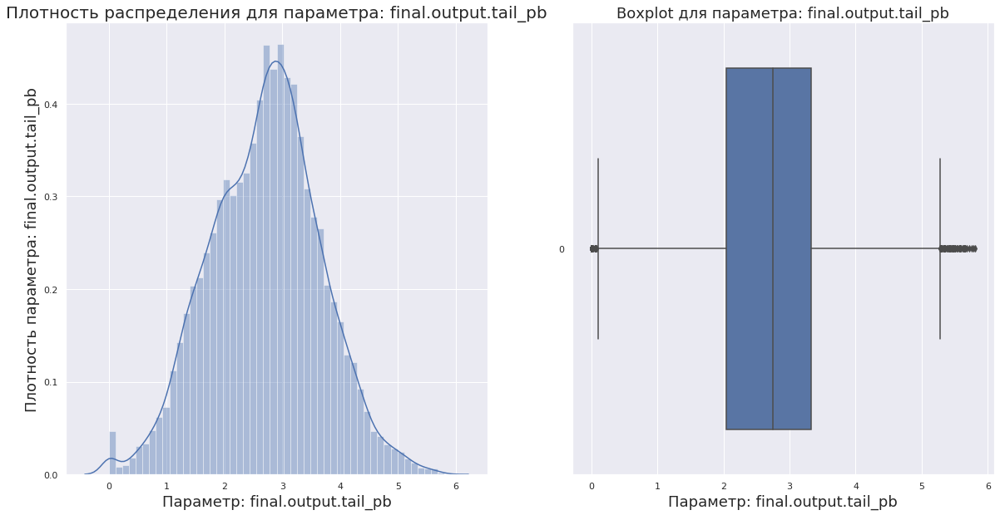

Доля выбросов параметра final.output.tail_pb равно: 0.86%
Анализ параметра 'final.output.tail_sol':


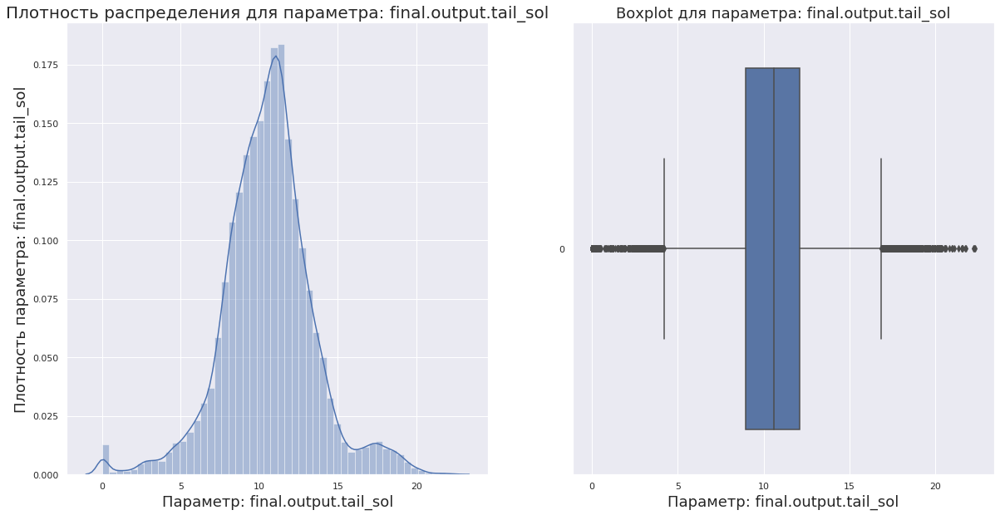

Доля выбросов параметра final.output.tail_sol равно: 5.22%
Анализ параметра 'final.output.tail_au':


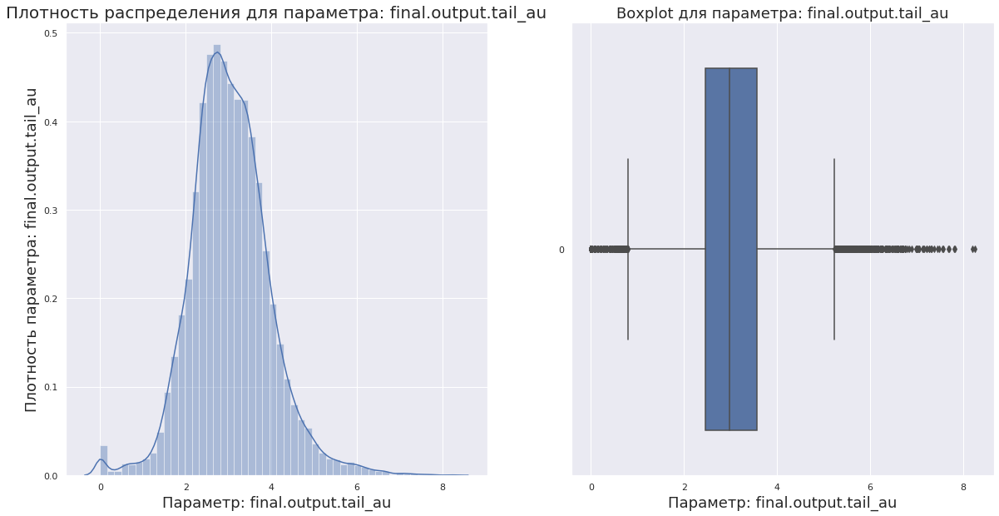

Доля выбросов параметра final.output.tail_au равно: 3.04%
Анализ параметра 'primary_cleaner.input.sulfate':


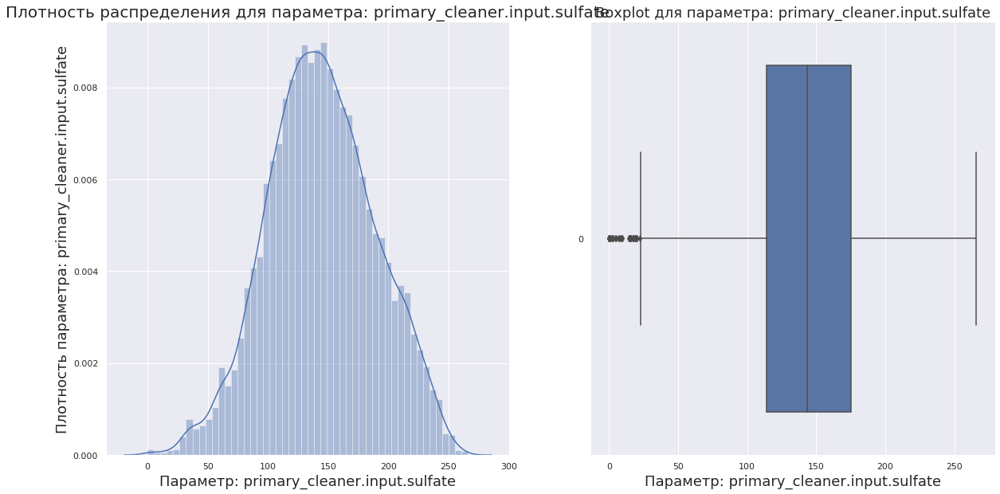

Доля выбросов параметра primary_cleaner.input.sulfate равно: 0.19%
Анализ параметра 'primary_cleaner.input.depressant':


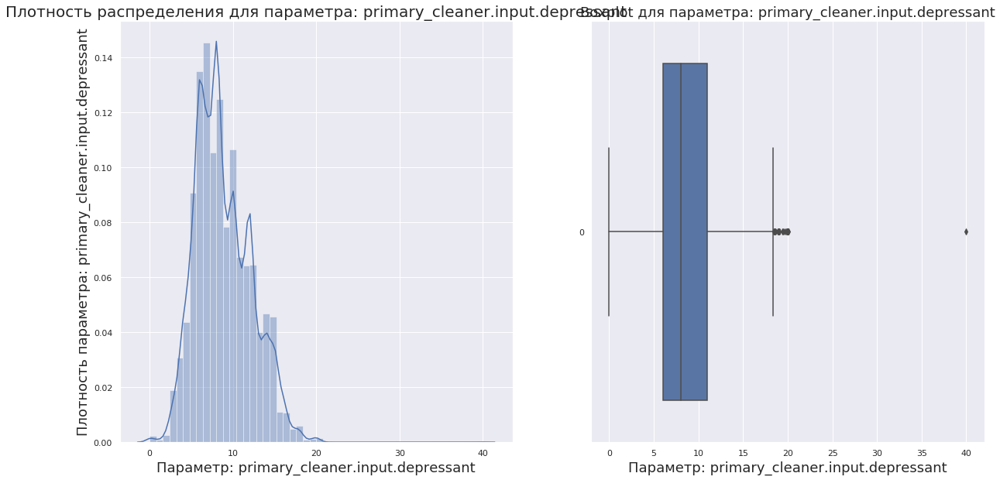

Доля выбросов параметра primary_cleaner.input.depressant равно: 0.27%
Анализ параметра 'primary_cleaner.input.feed_size':


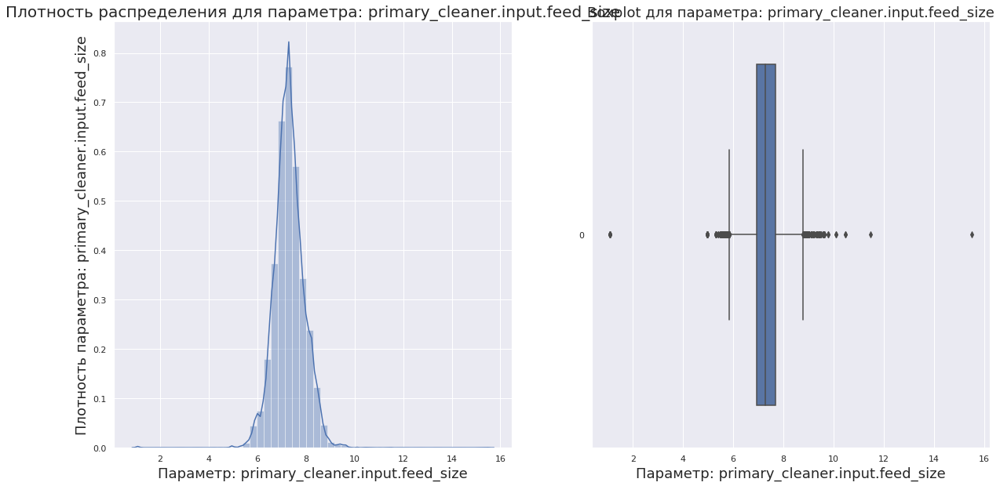

Доля выбросов параметра primary_cleaner.input.feed_size равно: 1.74%
Анализ параметра 'primary_cleaner.input.xanthate':


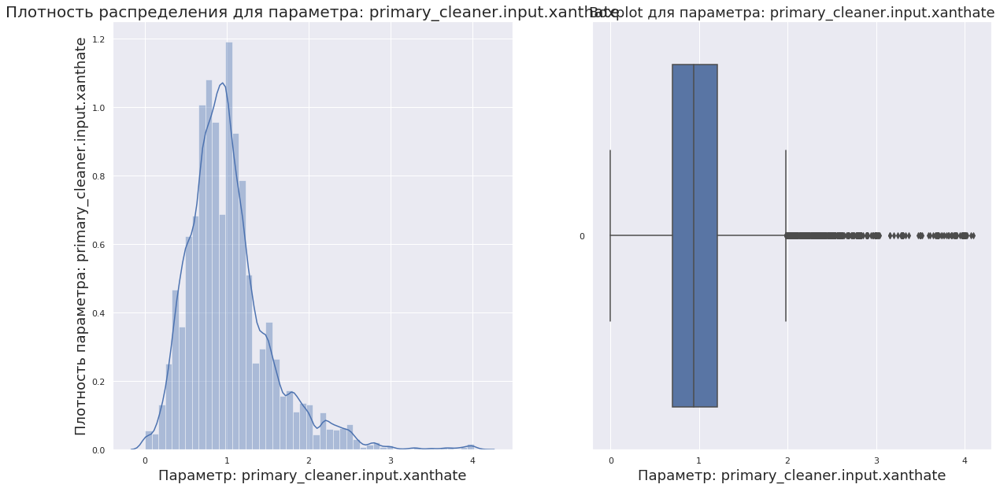

Доля выбросов параметра primary_cleaner.input.xanthate равно: 5.48%
Анализ параметра 'primary_cleaner.output.concentrate_ag':


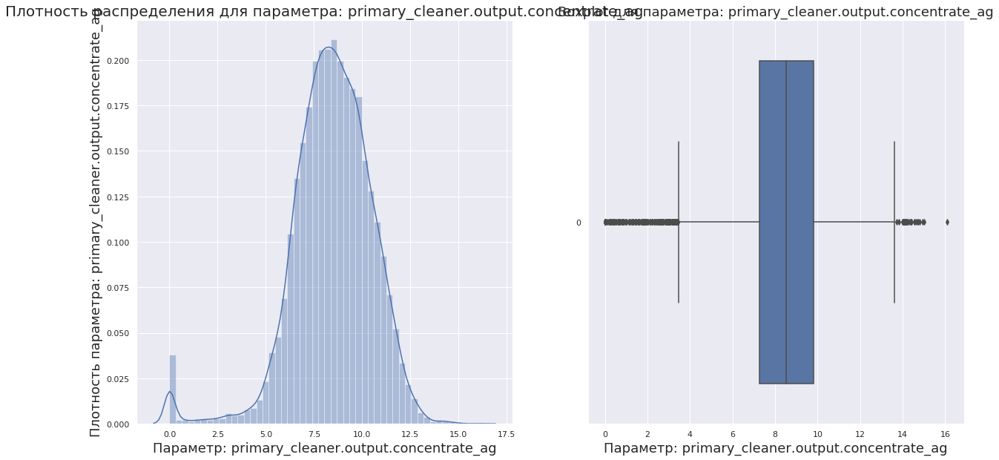

Доля выбросов параметра primary_cleaner.output.concentrate_ag равно: 2.23%
Анализ параметра 'primary_cleaner.output.concentrate_pb':


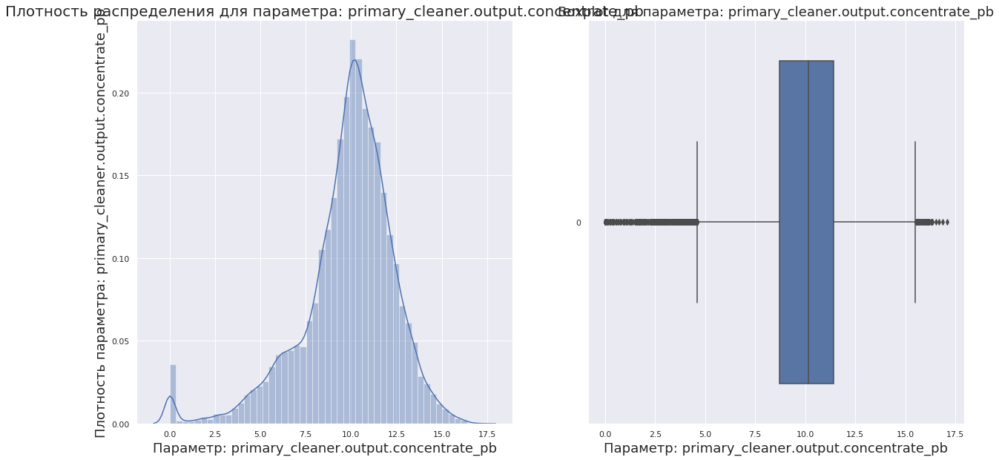

Доля выбросов параметра primary_cleaner.output.concentrate_pb равно: 4.25%
Анализ параметра 'primary_cleaner.output.concentrate_sol':


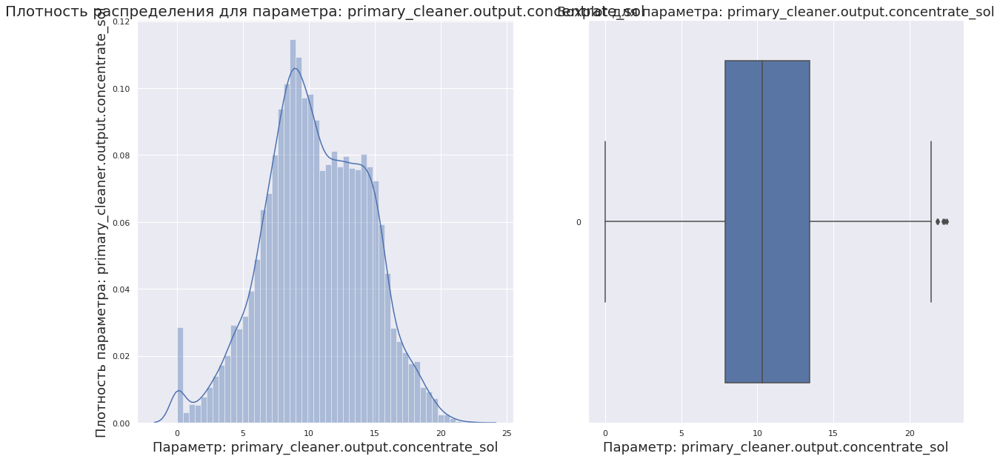

Доля выбросов параметра primary_cleaner.output.concentrate_sol равно: 0.03%
Анализ параметра 'primary_cleaner.output.concentrate_au':


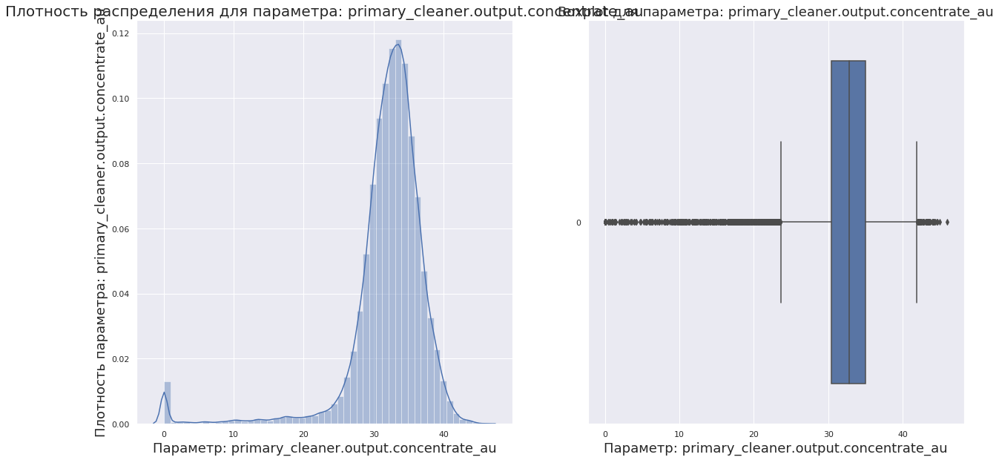

Доля выбросов параметра primary_cleaner.output.concentrate_au равно: 4.46%
Анализ параметра 'primary_cleaner.output.tail_ag':


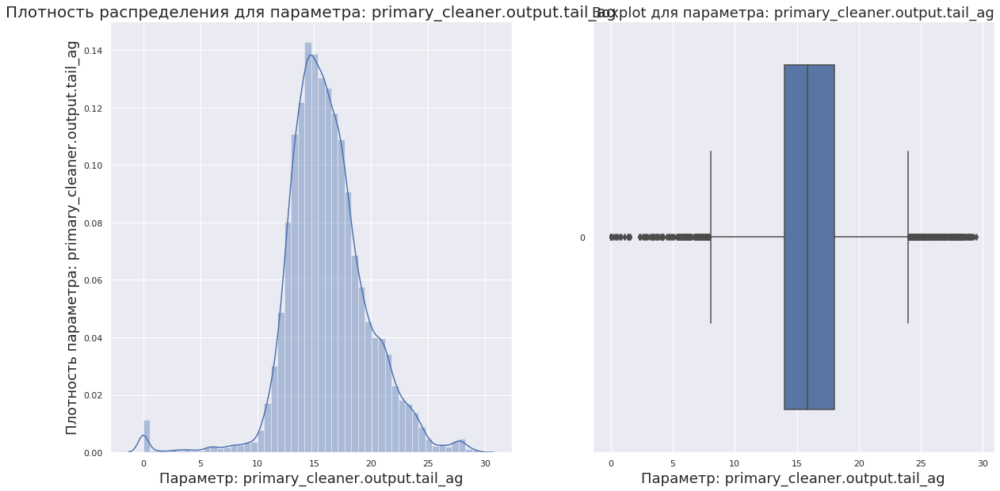

Доля выбросов параметра primary_cleaner.output.tail_ag равно: 3.46%
Анализ параметра 'primary_cleaner.output.tail_pb':


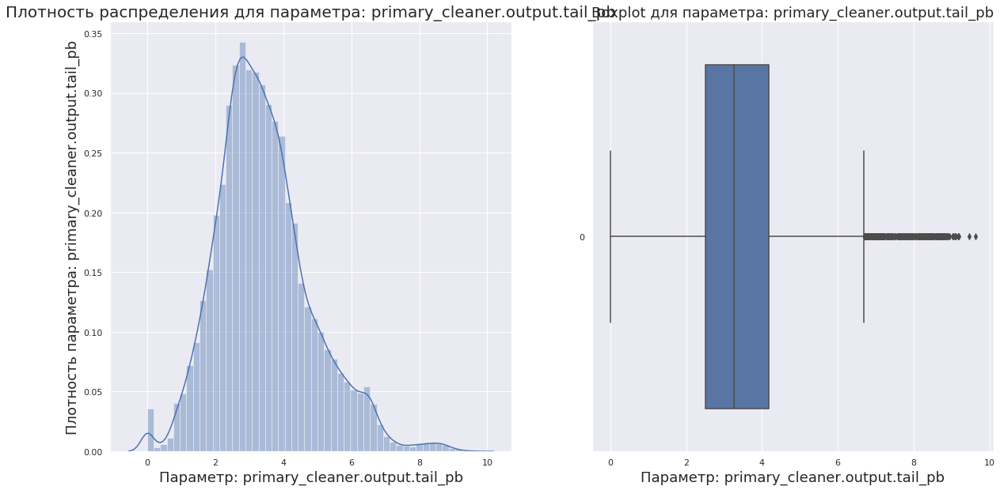

Доля выбросов параметра primary_cleaner.output.tail_pb равно: 2.01%
Анализ параметра 'primary_cleaner.output.tail_sol':


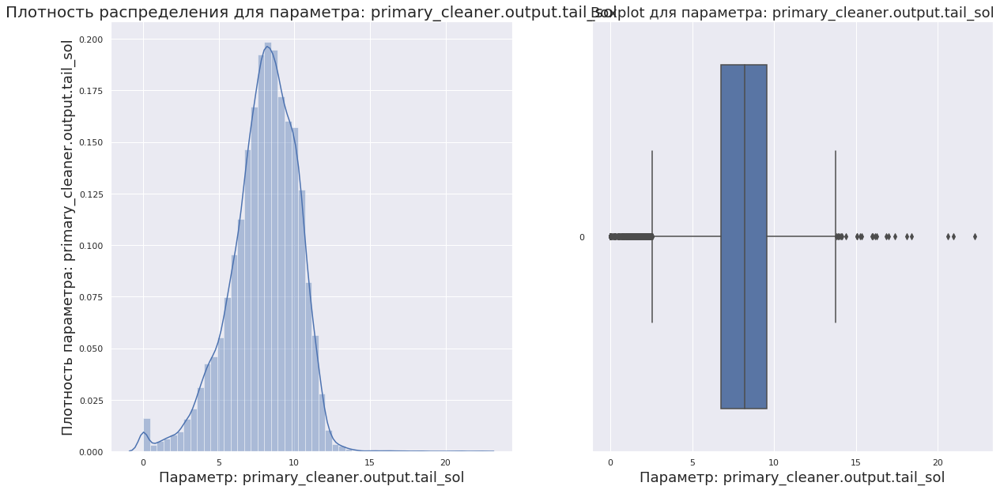

Доля выбросов параметра primary_cleaner.output.tail_sol равно: 2.05%
Анализ параметра 'primary_cleaner.output.tail_au':


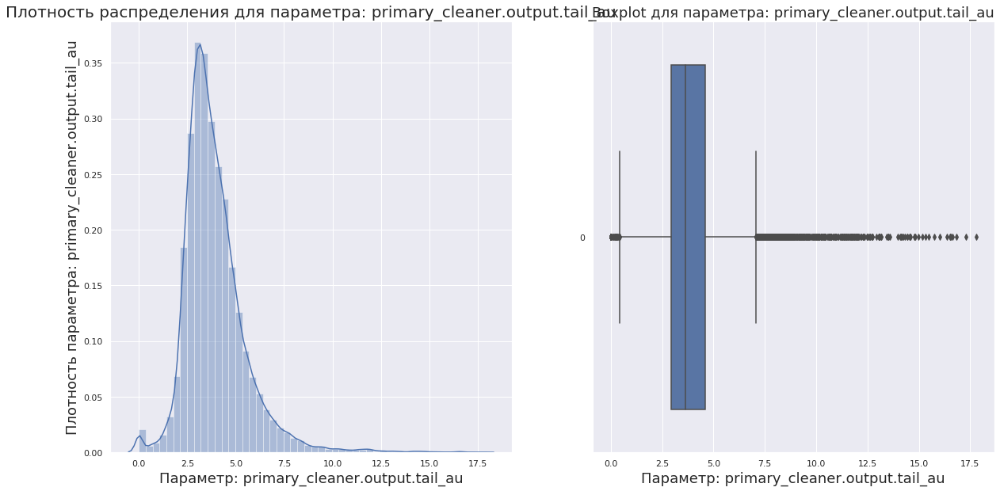

Доля выбросов параметра primary_cleaner.output.tail_au равно: 4.62%
Анализ параметра 'primary_cleaner.state.floatbank8_a_air':


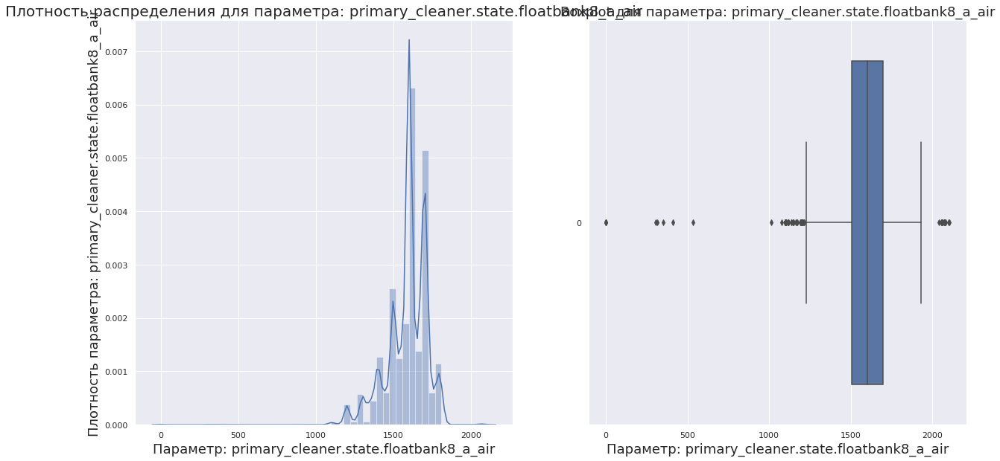

Доля выбросов параметра primary_cleaner.state.floatbank8_a_air равно: 1.94%
Анализ параметра 'primary_cleaner.state.floatbank8_a_level':


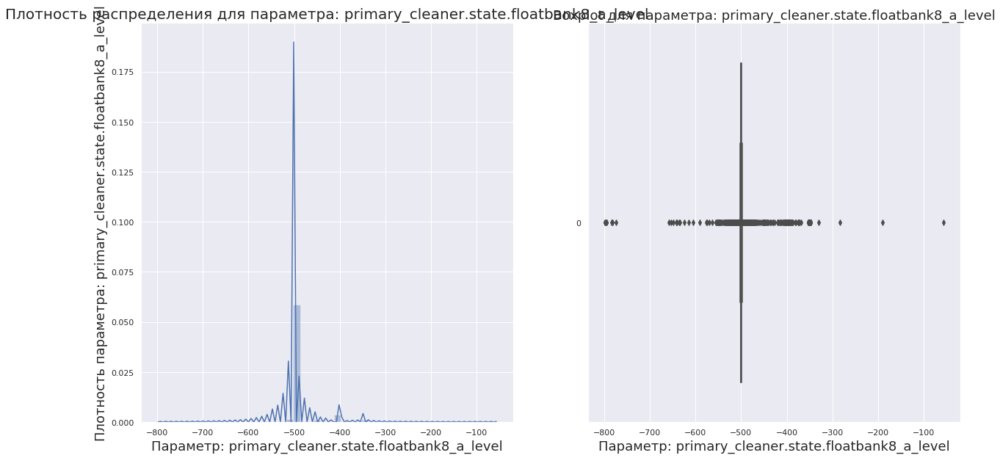

Доля выбросов параметра primary_cleaner.state.floatbank8_a_level равно: 16.1%
Анализ параметра 'primary_cleaner.state.floatbank8_b_air':


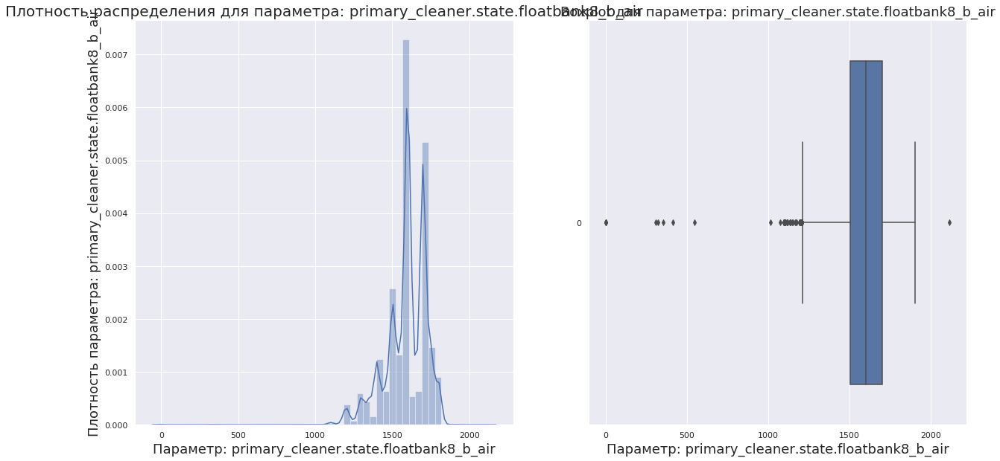

Доля выбросов параметра primary_cleaner.state.floatbank8_b_air равно: 1.86%
Анализ параметра 'primary_cleaner.state.floatbank8_b_level':


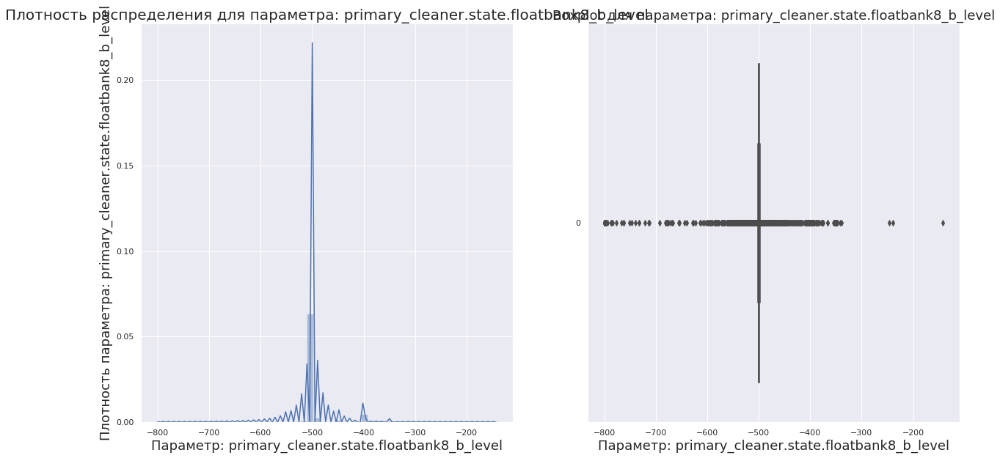

Доля выбросов параметра primary_cleaner.state.floatbank8_b_level равно: 20.76%
Анализ параметра 'primary_cleaner.state.floatbank8_c_air':


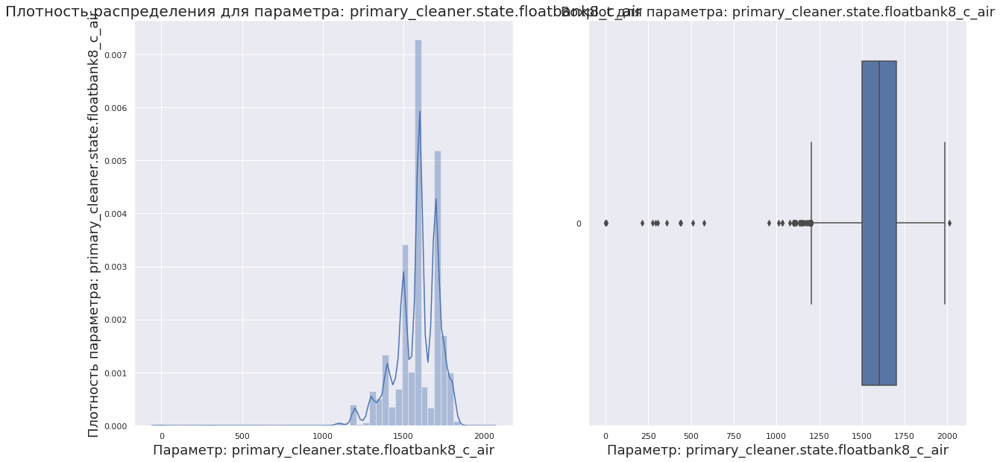

Доля выбросов параметра primary_cleaner.state.floatbank8_c_air равно: 1.85%
Анализ параметра 'primary_cleaner.state.floatbank8_c_level':


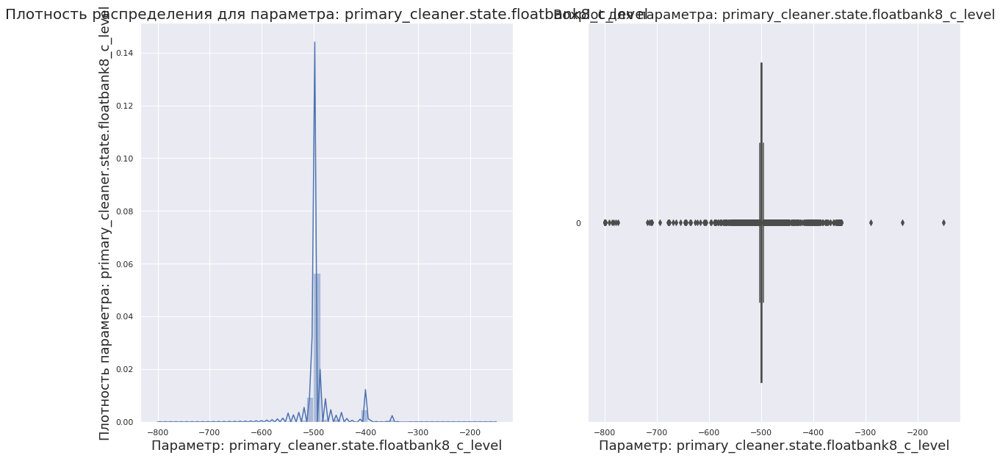

Доля выбросов параметра primary_cleaner.state.floatbank8_c_level равно: 22.66%
Анализ параметра 'primary_cleaner.state.floatbank8_d_air':


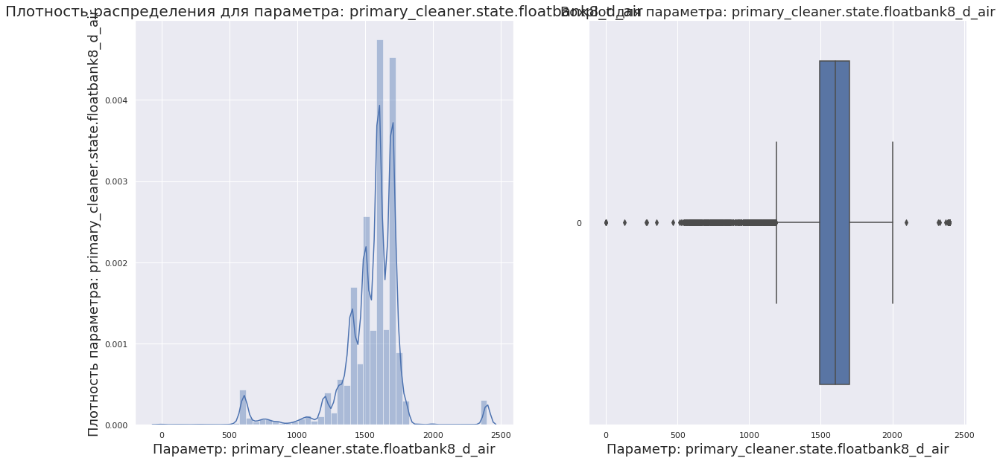

Доля выбросов параметра primary_cleaner.state.floatbank8_d_air равно: 6.67%
Анализ параметра 'primary_cleaner.state.floatbank8_d_level':


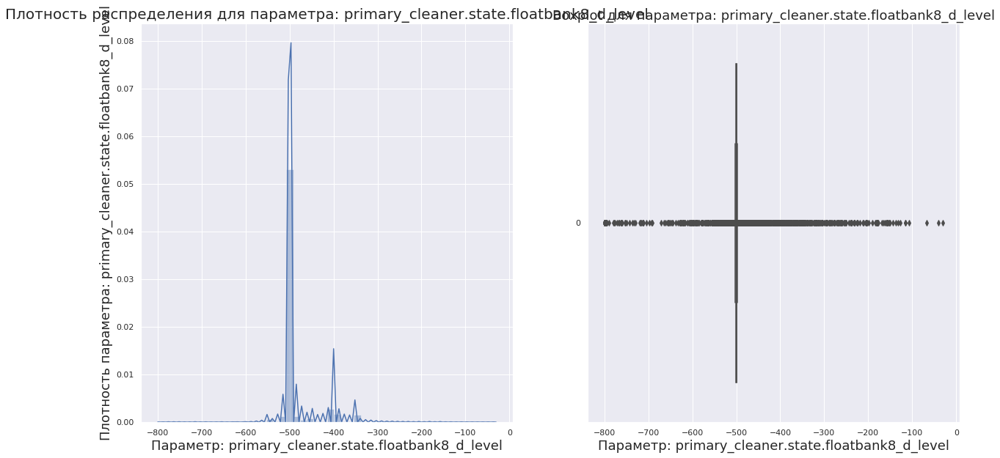

Доля выбросов параметра primary_cleaner.state.floatbank8_d_level равно: 23.92%
Анализ параметра 'rougher.calculation.sulfate_to_au_concentrate':


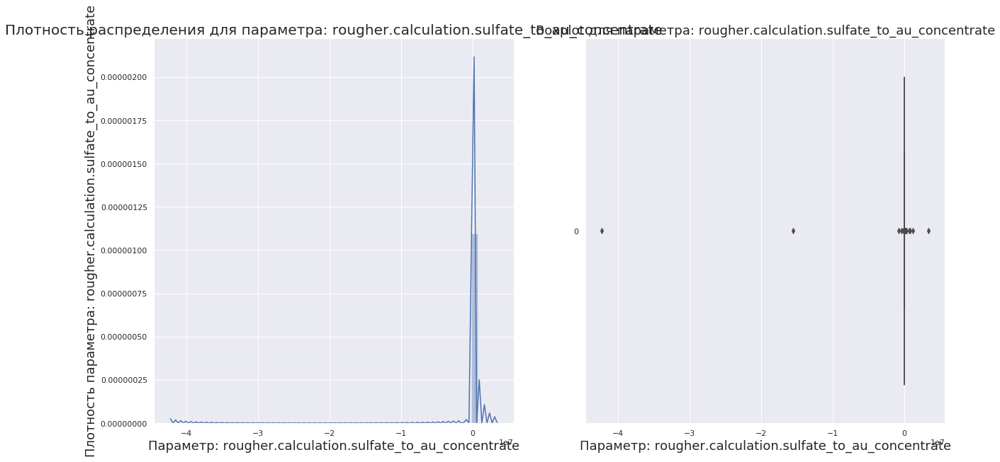

Доля выбросов параметра rougher.calculation.sulfate_to_au_concentrate равно: 3.8%
Анализ параметра 'rougher.calculation.floatbank10_sulfate_to_au_feed':


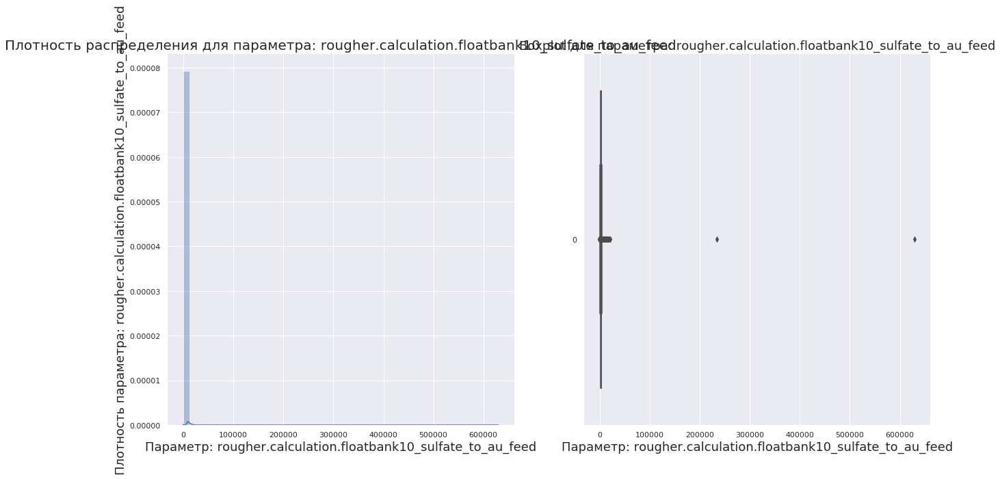

Доля выбросов параметра rougher.calculation.floatbank10_sulfate_to_au_feed равно: 6.76%
Анализ параметра 'rougher.calculation.floatbank11_sulfate_to_au_feed':


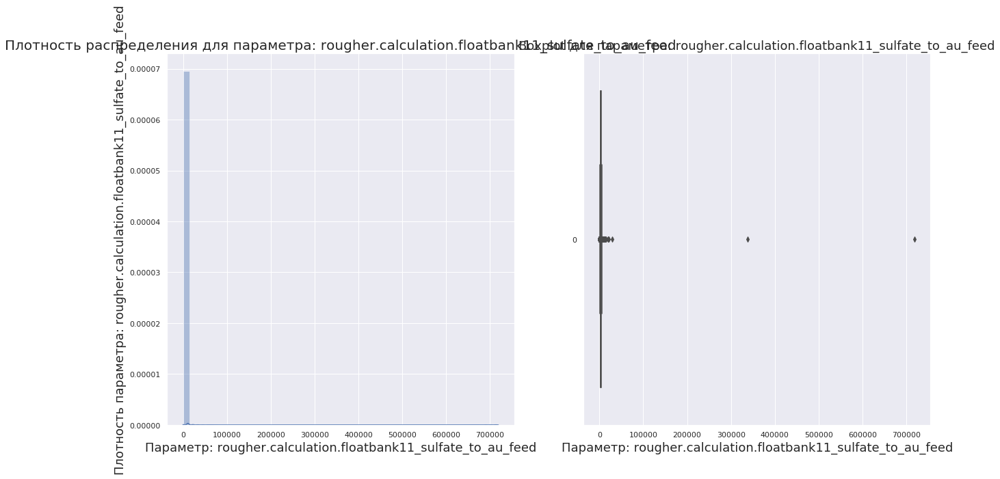

Доля выбросов параметра rougher.calculation.floatbank11_sulfate_to_au_feed равно: 7.28%
Анализ параметра 'rougher.calculation.au_pb_ratio':


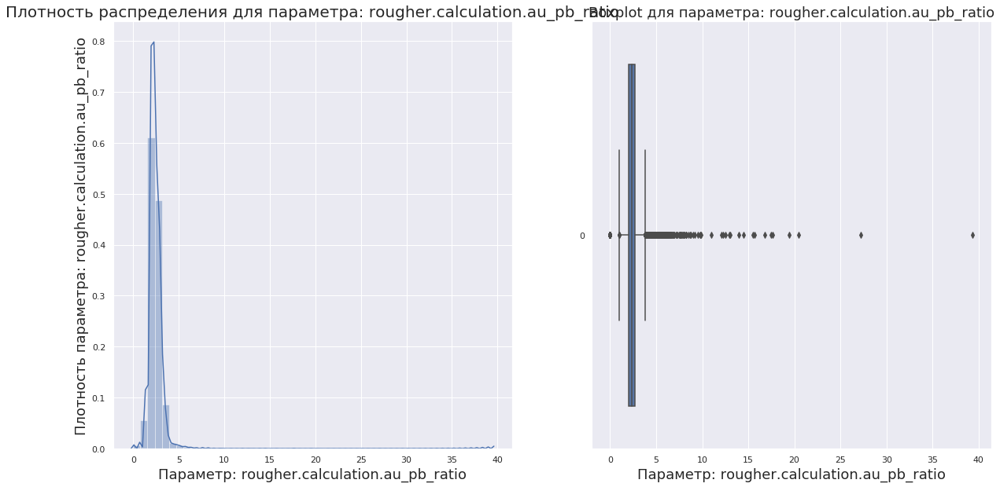

Доля выбросов параметра rougher.calculation.au_pb_ratio равно: 2.76%
Анализ параметра 'rougher.input.feed_ag':


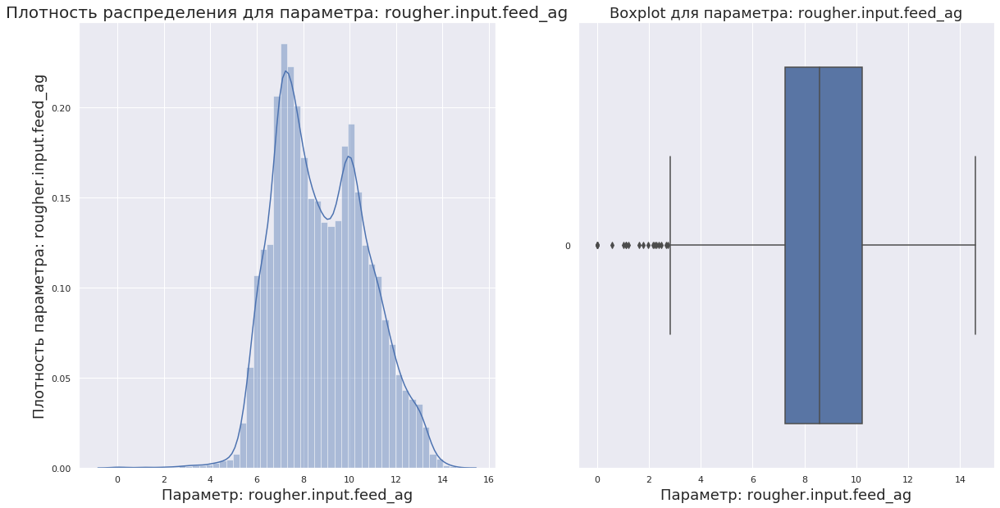

Доля выбросов параметра rougher.input.feed_ag равно: 0.1%
Анализ параметра 'rougher.input.feed_pb':


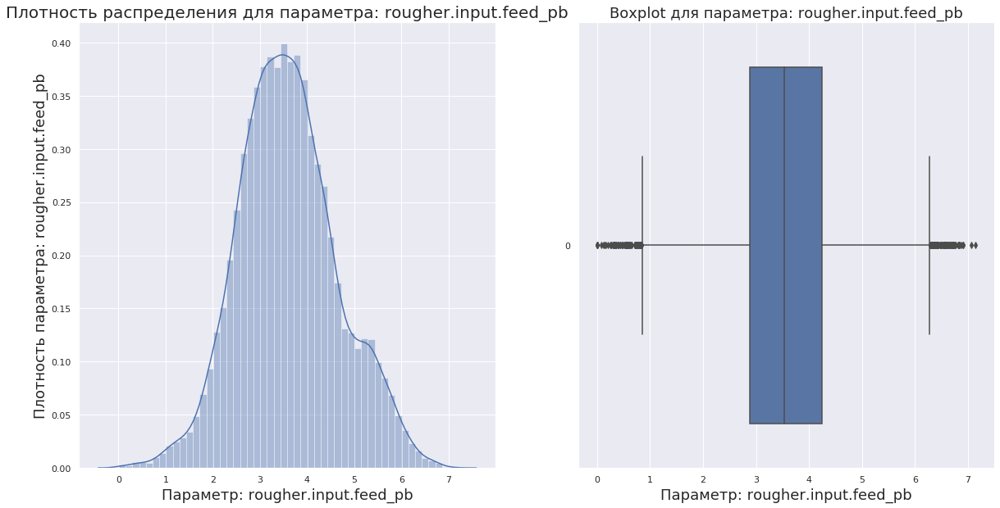

Доля выбросов параметра rougher.input.feed_pb равно: 0.98%
Анализ параметра 'rougher.input.feed_rate':


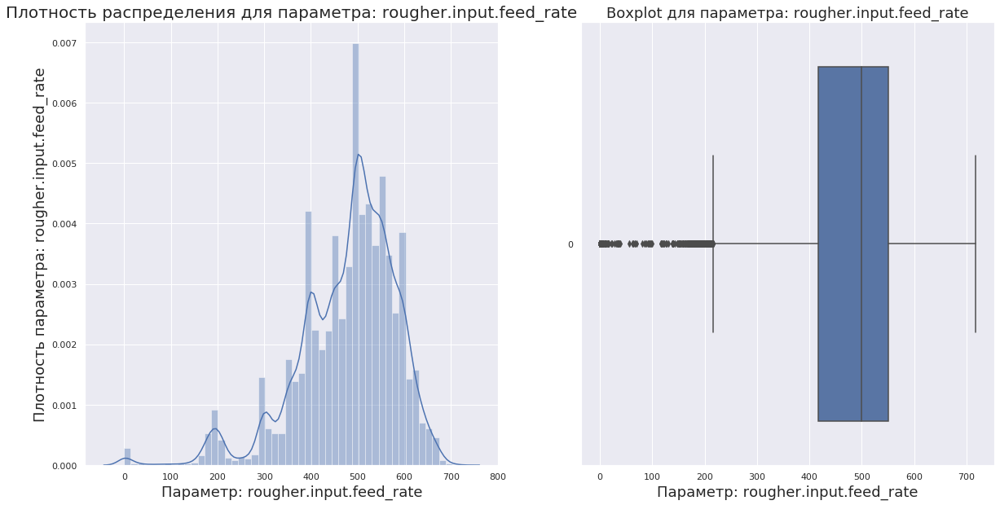

Доля выбросов параметра rougher.input.feed_rate равно: 3.66%
Анализ параметра 'rougher.input.feed_size':


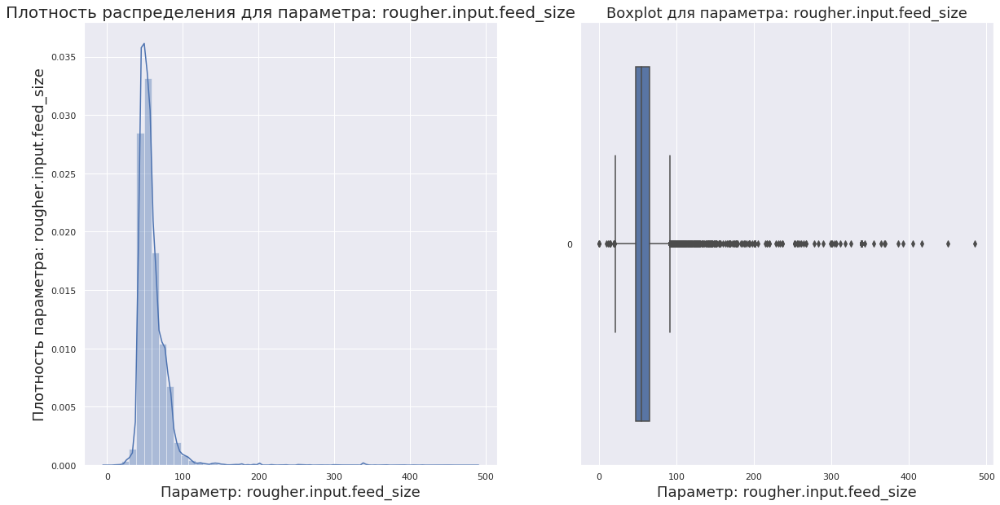

Доля выбросов параметра rougher.input.feed_size равно: 3.16%
Анализ параметра 'rougher.input.feed_sol':


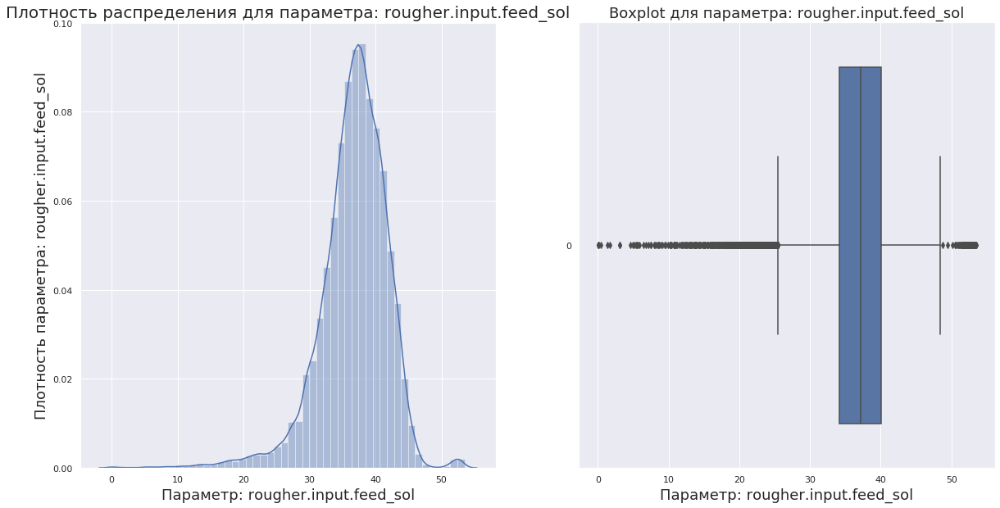

Доля выбросов параметра rougher.input.feed_sol равно: 3.37%
Анализ параметра 'rougher.input.feed_au':


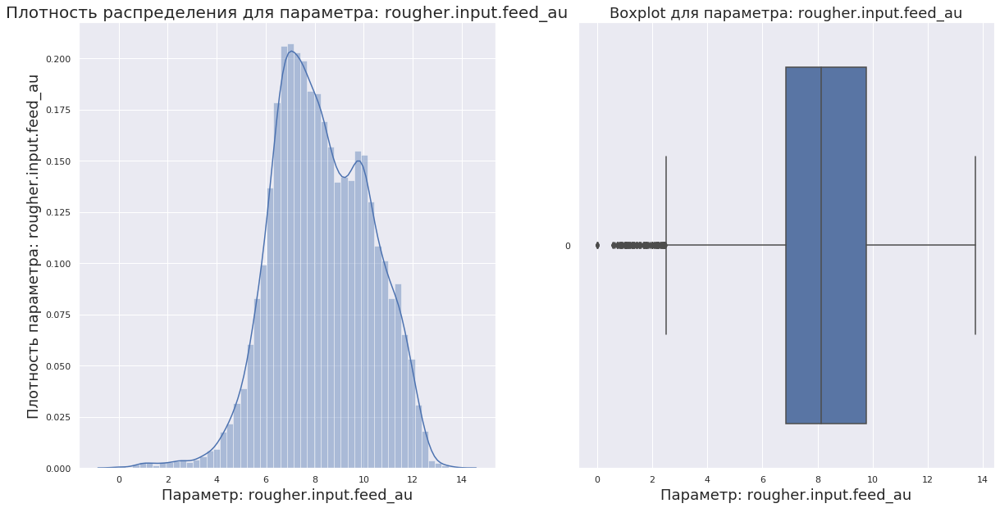

Доля выбросов параметра rougher.input.feed_au равно: 0.49%
Анализ параметра 'rougher.input.floatbank10_sulfate':


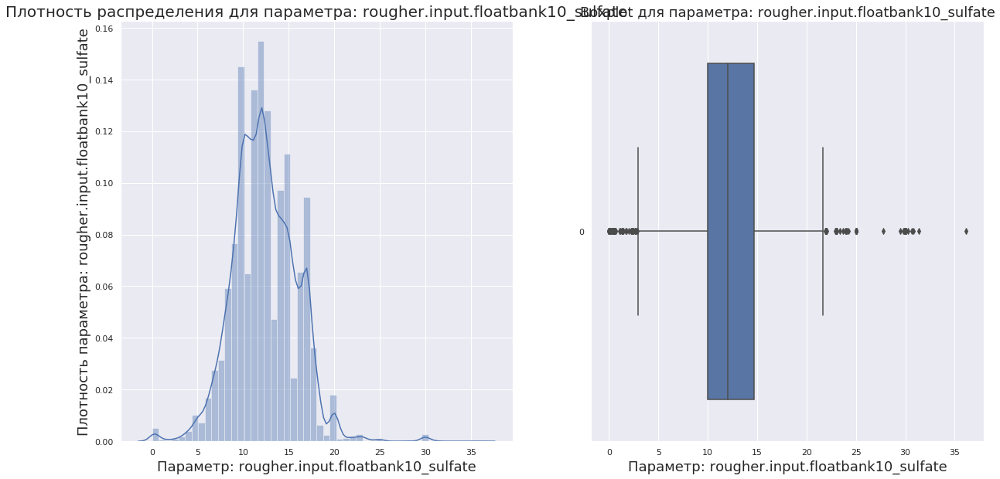

Доля выбросов параметра rougher.input.floatbank10_sulfate равно: 1.15%
Анализ параметра 'rougher.input.floatbank10_xanthate':


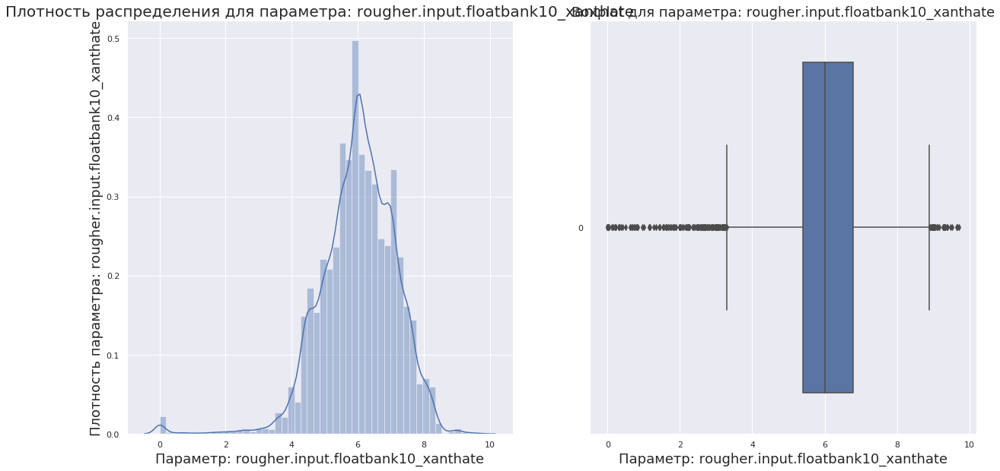

Доля выбросов параметра rougher.input.floatbank10_xanthate равно: 1.49%
Анализ параметра 'rougher.input.floatbank11_sulfate':


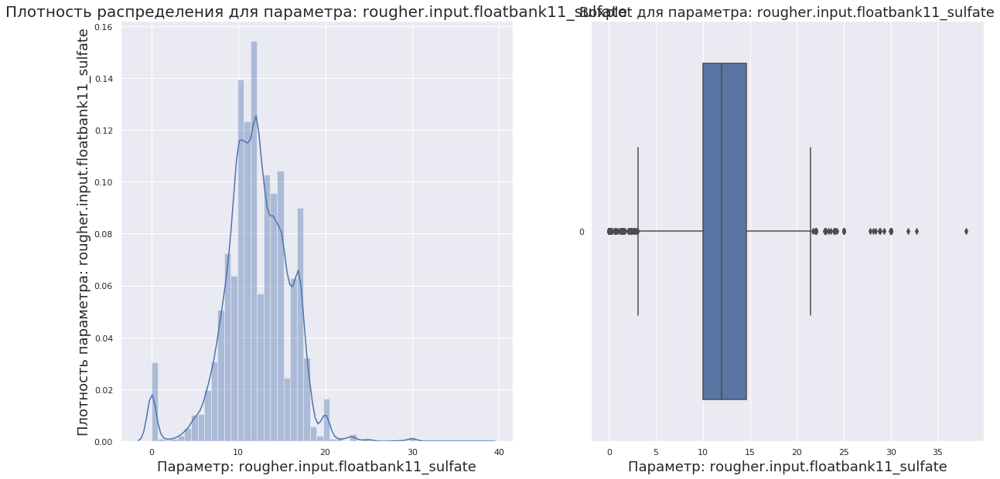

Доля выбросов параметра rougher.input.floatbank11_sulfate равно: 3.02%
Анализ параметра 'rougher.input.floatbank11_xanthate':


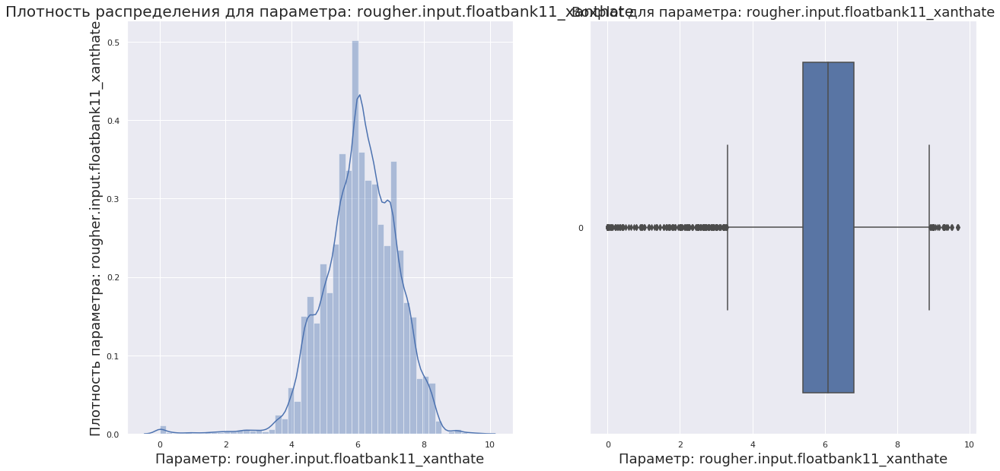

Доля выбросов параметра rougher.input.floatbank11_xanthate равно: 1.19%
Анализ параметра 'rougher.output.concentrate_ag':


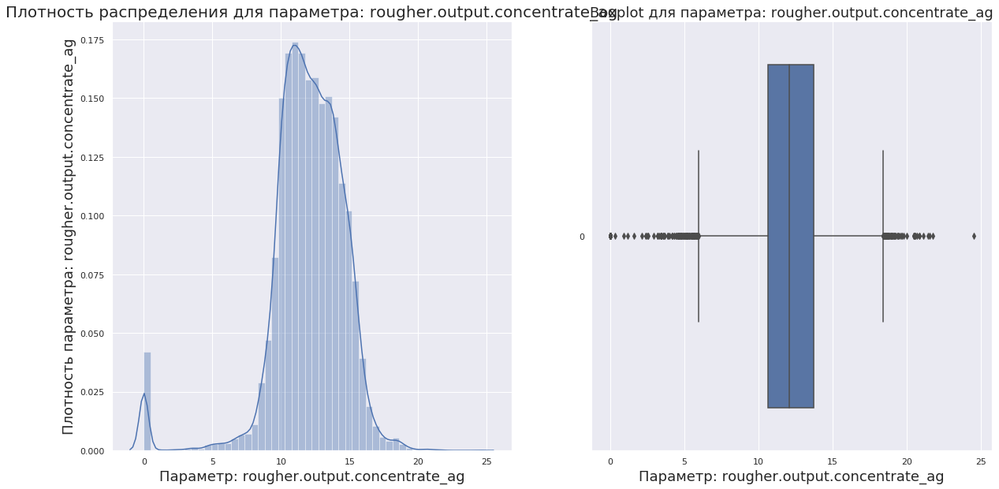

Доля выбросов параметра rougher.output.concentrate_ag равно: 3.05%
Анализ параметра 'rougher.output.concentrate_pb':


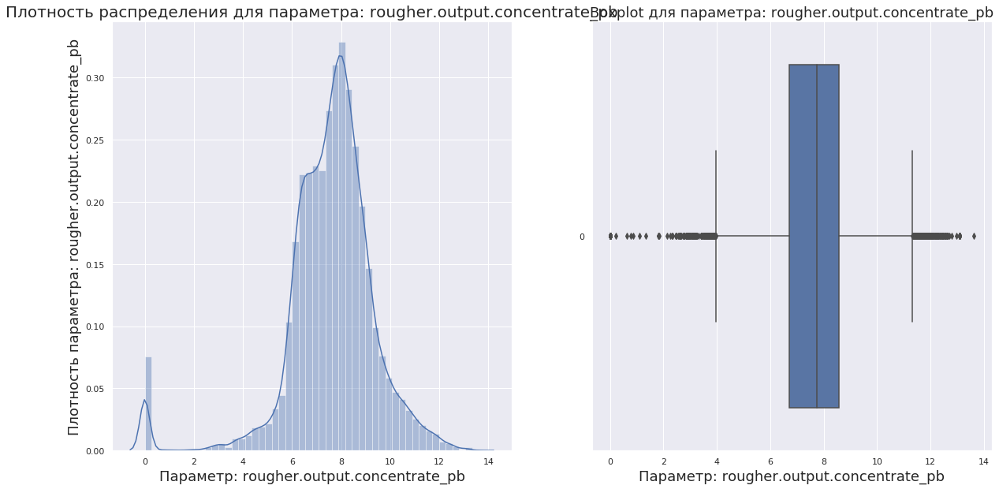

Доля выбросов параметра rougher.output.concentrate_pb равно: 4.45%
Анализ параметра 'rougher.output.concentrate_sol':


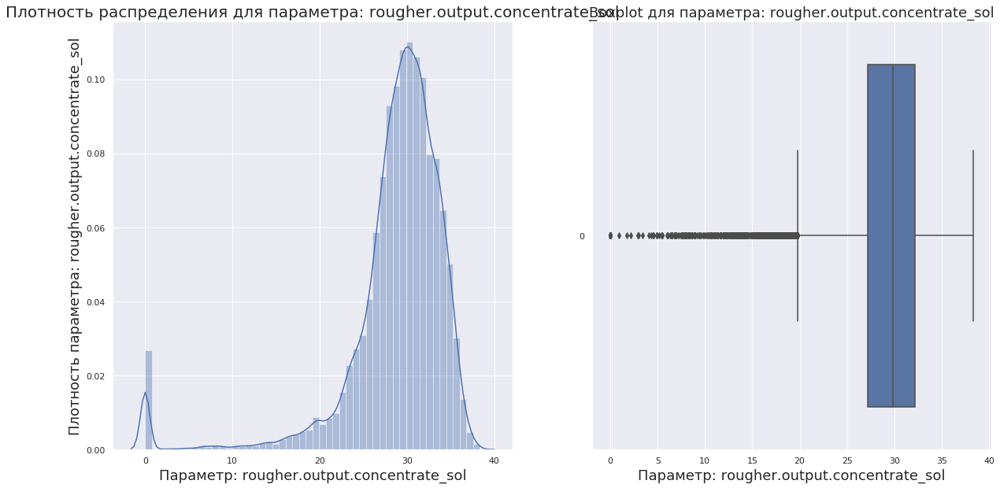

Доля выбросов параметра rougher.output.concentrate_sol равно: 5.28%
Анализ параметра 'rougher.output.concentrate_au':


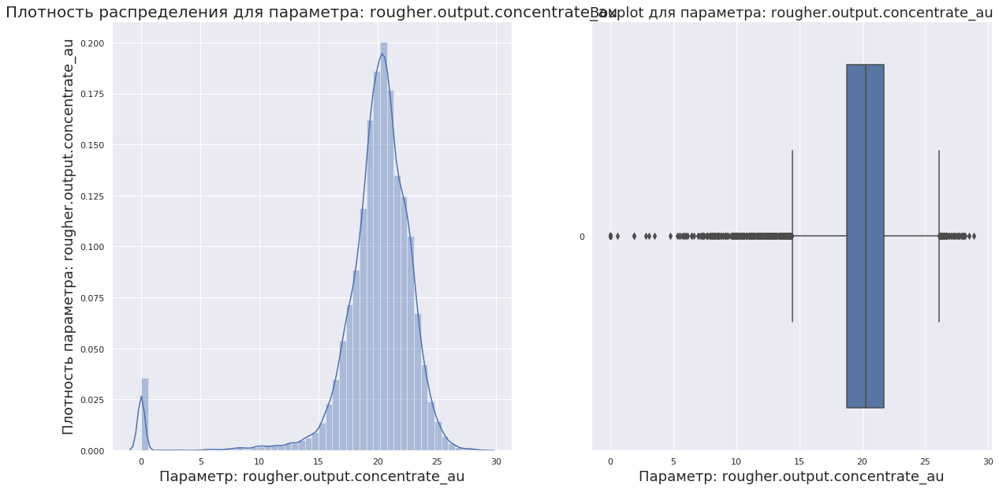

Доля выбросов параметра rougher.output.concentrate_au равно: 4.4%
Анализ параметра 'rougher.output.recovery':


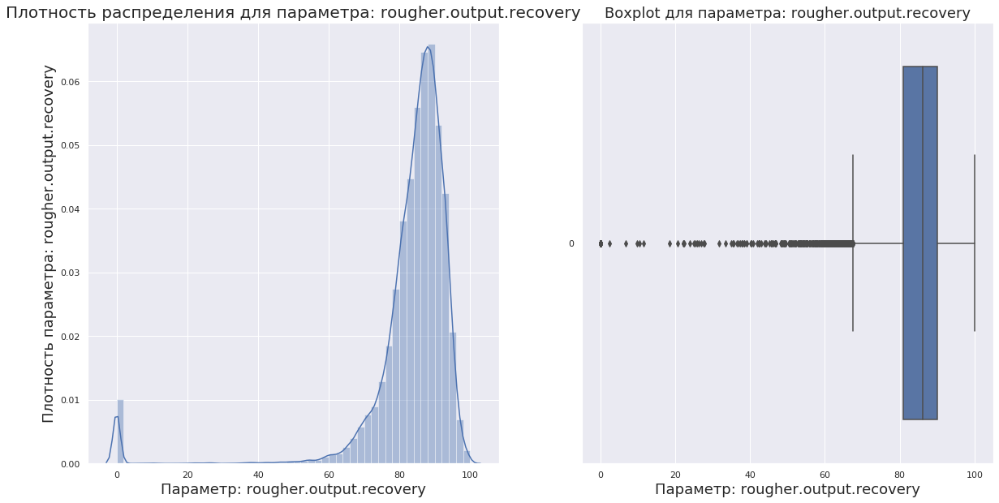

Доля выбросов параметра rougher.output.recovery равно: 4.57%
Анализ параметра 'rougher.output.tail_ag':


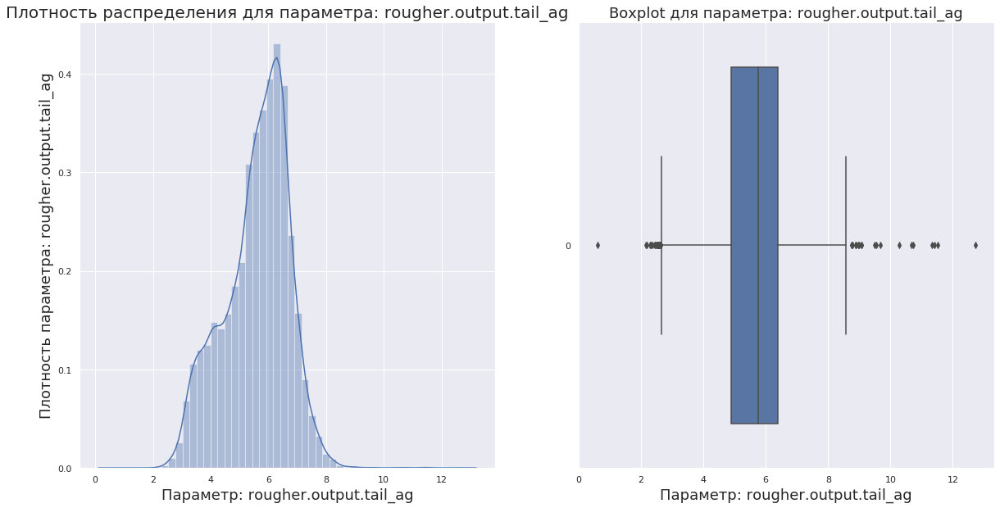

Доля выбросов параметра rougher.output.tail_ag равно: 0.28%
Анализ параметра 'rougher.output.tail_pb':


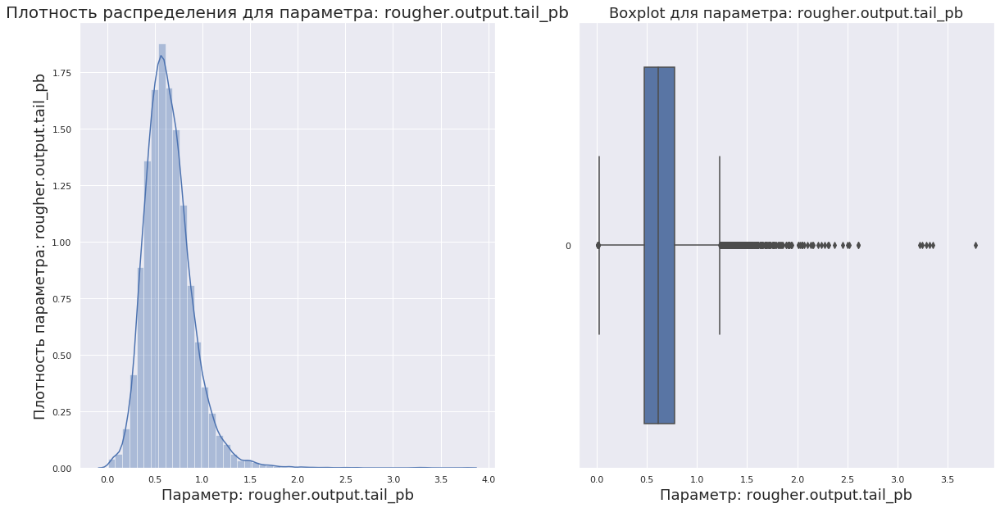

Доля выбросов параметра rougher.output.tail_pb равно: 2.27%
Анализ параметра 'rougher.output.tail_sol':


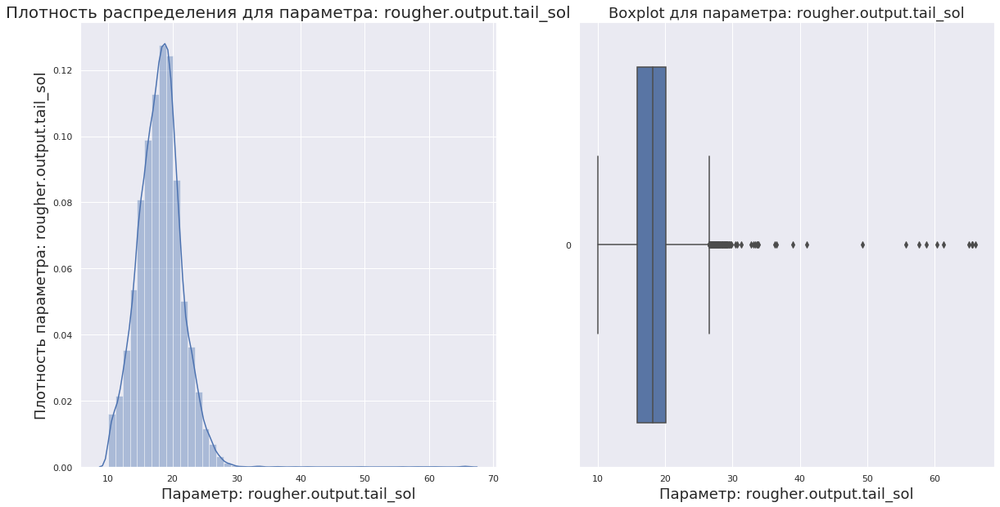

Доля выбросов параметра rougher.output.tail_sol равно: 0.79%
Анализ параметра 'rougher.output.tail_au':


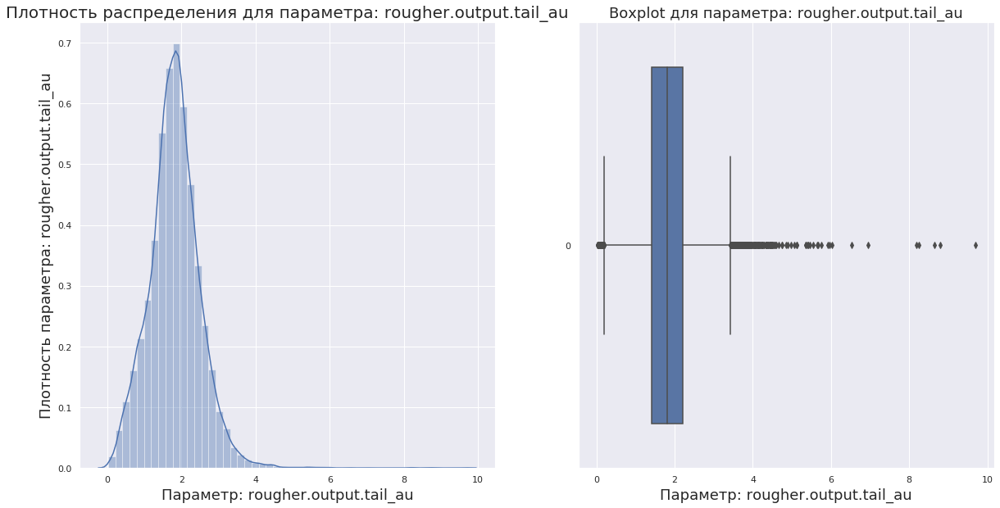

Доля выбросов параметра rougher.output.tail_au равно: 1.76%
Анализ параметра 'rougher.state.floatbank10_a_air':


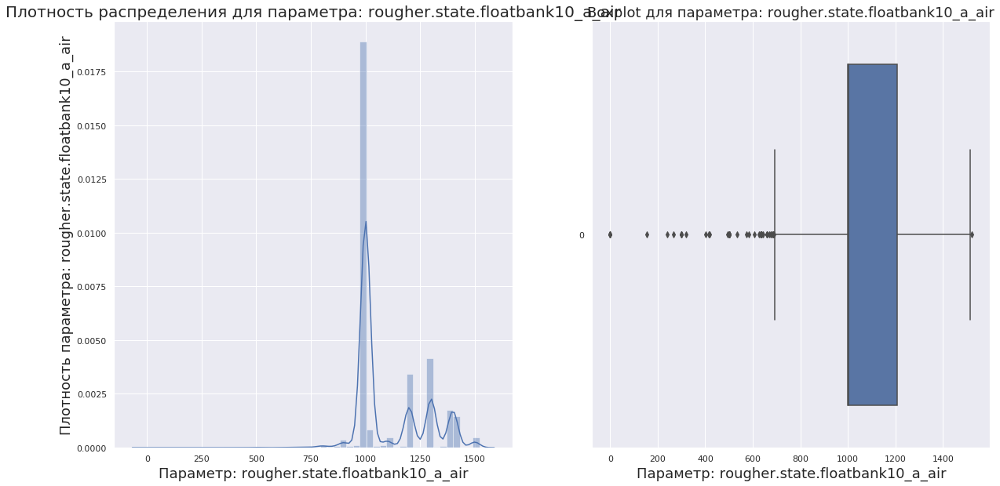

Доля выбросов параметра rougher.state.floatbank10_a_air равно: 0.23%
Анализ параметра 'rougher.state.floatbank10_a_level':


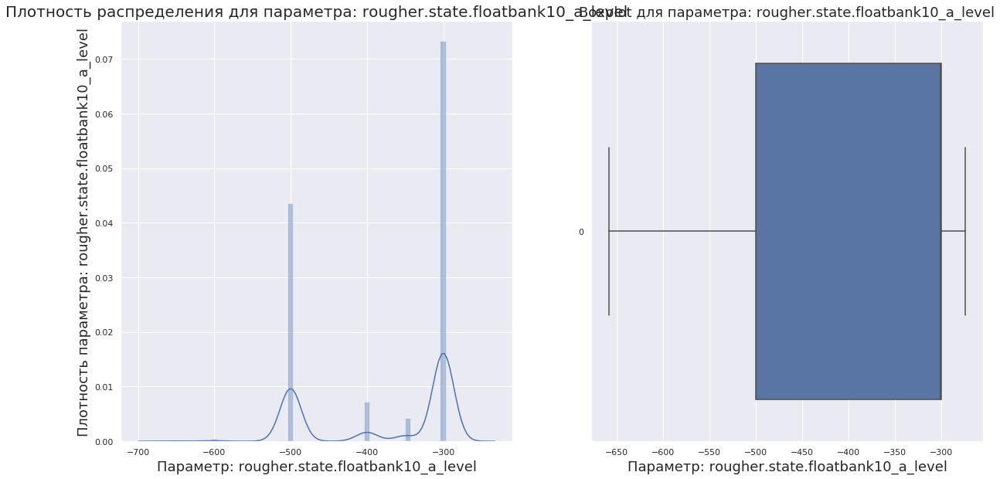

Доля выбросов параметра rougher.state.floatbank10_a_level равно: 0.0%
Анализ параметра 'rougher.state.floatbank10_b_air':


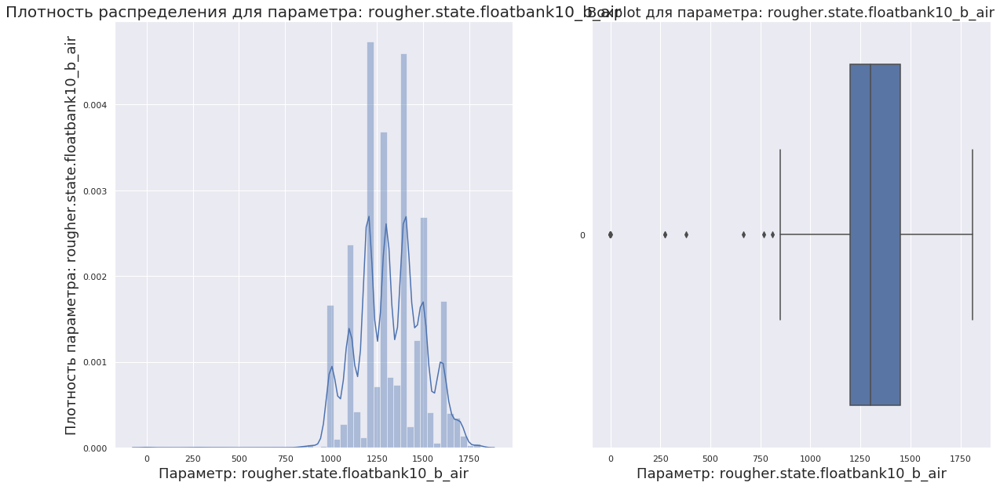

Доля выбросов параметра rougher.state.floatbank10_b_air равно: 0.05%
Анализ параметра 'rougher.state.floatbank10_b_level':


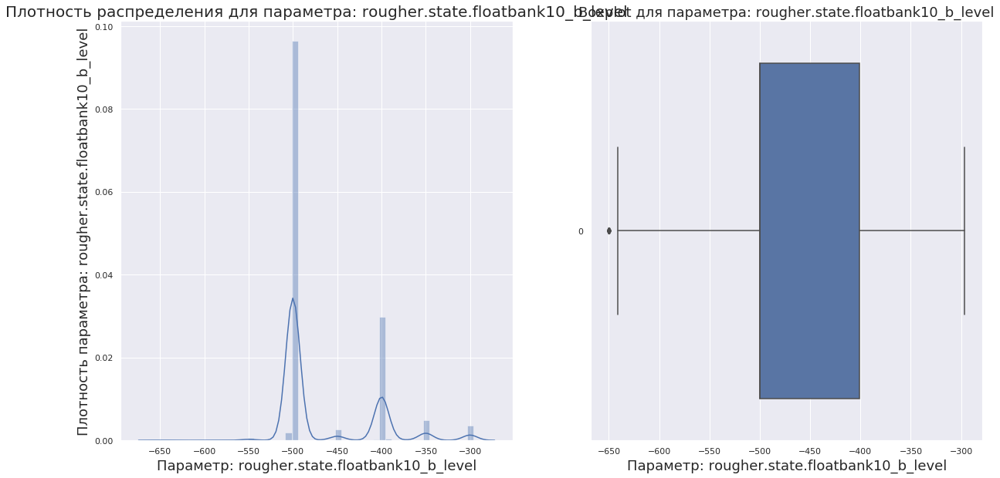

Доля выбросов параметра rougher.state.floatbank10_b_level равно: 0.05%
Анализ параметра 'rougher.state.floatbank10_c_air':


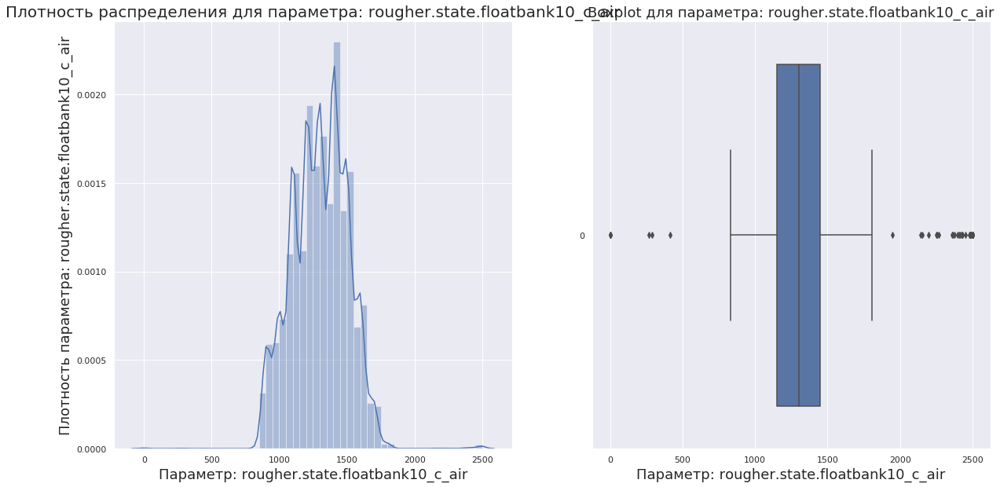

Доля выбросов параметра rougher.state.floatbank10_c_air равно: 0.23%
Анализ параметра 'rougher.state.floatbank10_c_level':


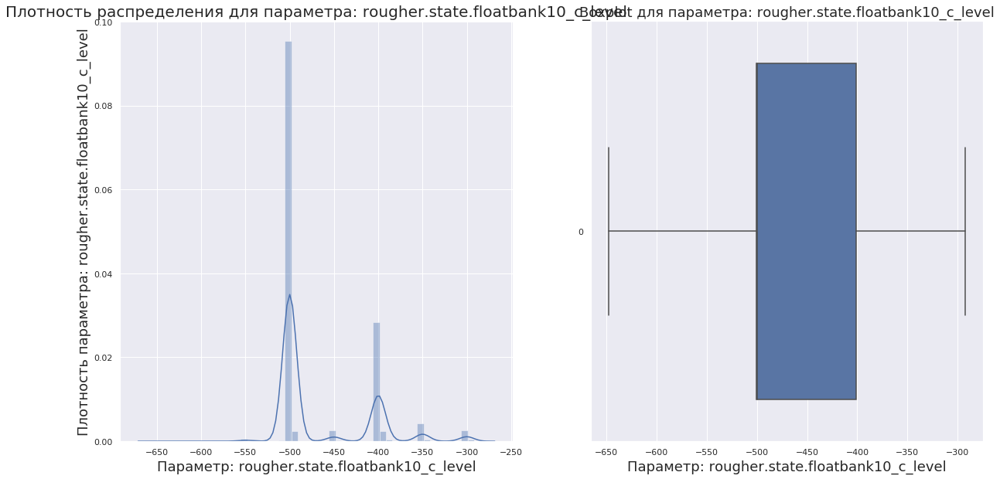

Доля выбросов параметра rougher.state.floatbank10_c_level равно: 0.0%
Анализ параметра 'rougher.state.floatbank10_d_air':


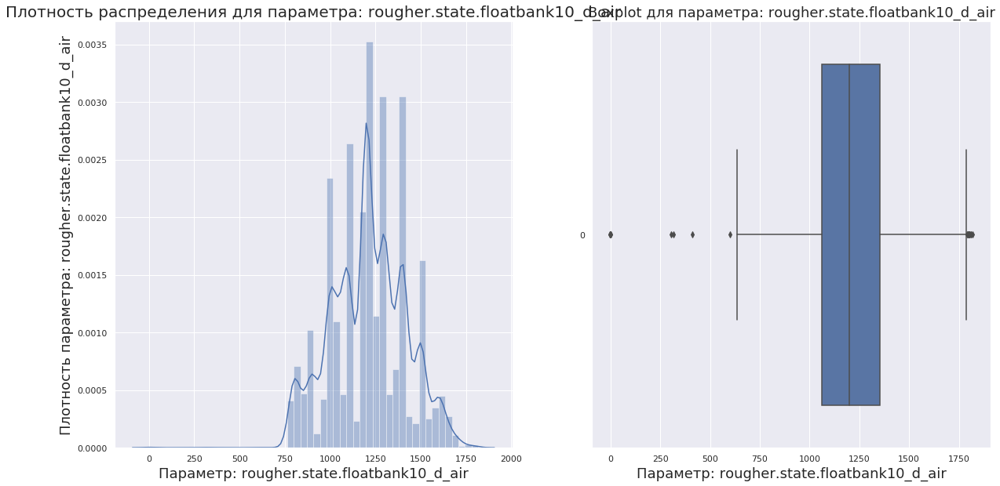

Доля выбросов параметра rougher.state.floatbank10_d_air равно: 0.11%
Анализ параметра 'rougher.state.floatbank10_d_level':


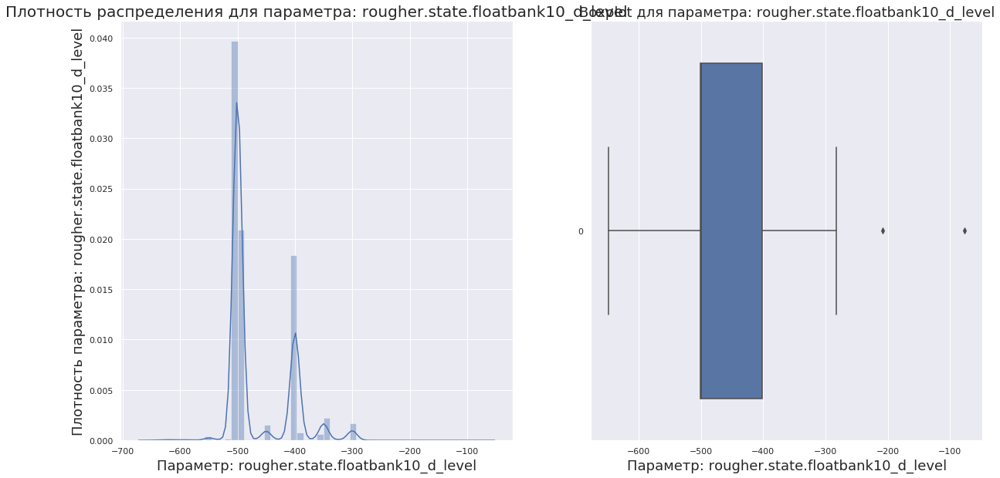

Доля выбросов параметра rougher.state.floatbank10_d_level равно: 0.01%
Анализ параметра 'rougher.state.floatbank10_e_air':


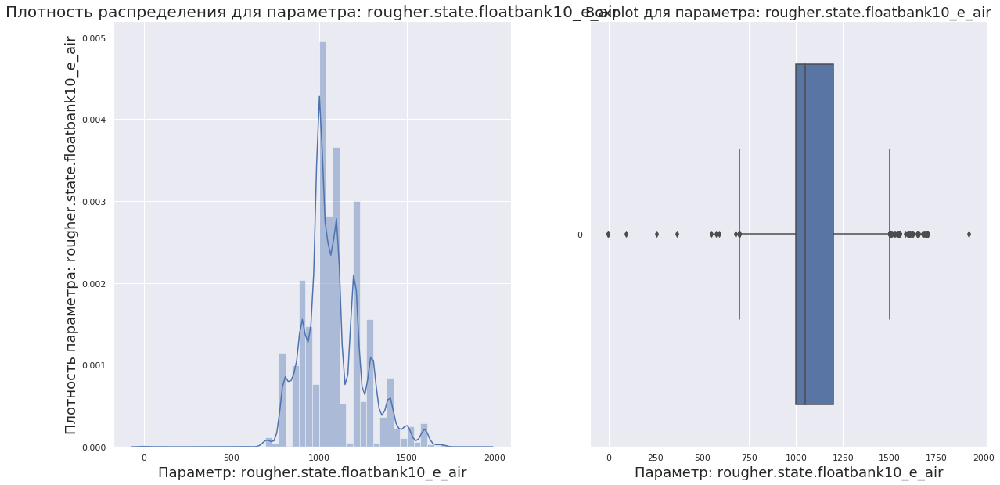

Доля выбросов параметра rougher.state.floatbank10_e_air равно: 2.15%
Анализ параметра 'rougher.state.floatbank10_e_level':


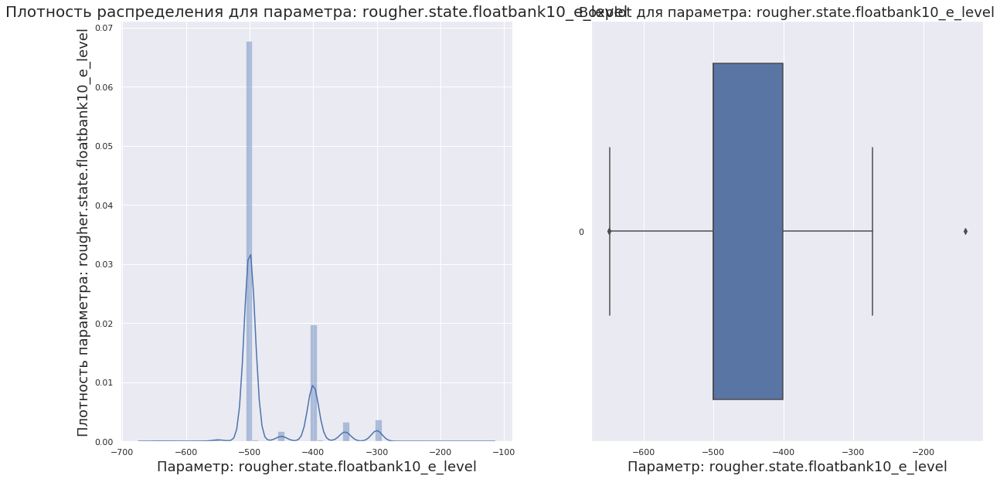

Доля выбросов параметра rougher.state.floatbank10_e_level равно: 0.02%
Анализ параметра 'rougher.state.floatbank10_f_air':


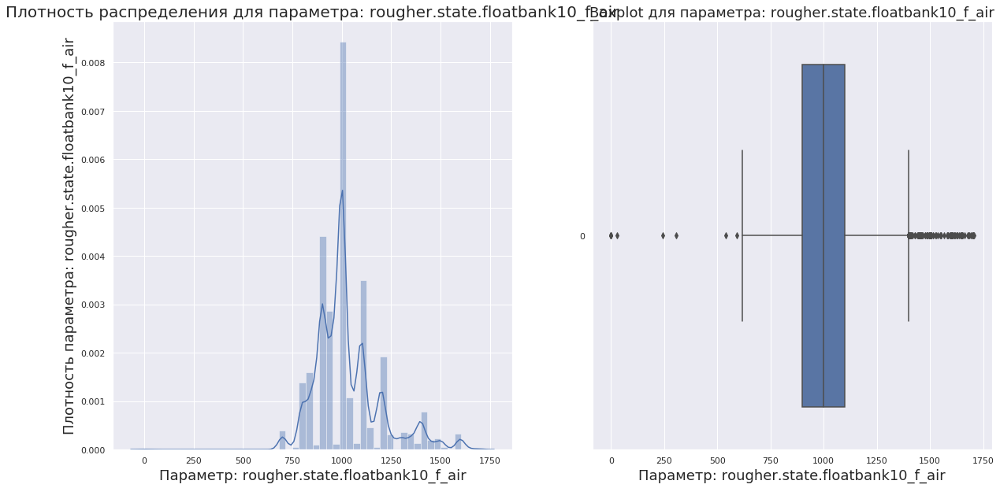

Доля выбросов параметра rougher.state.floatbank10_f_air равно: 5.85%
Анализ параметра 'rougher.state.floatbank10_f_level':


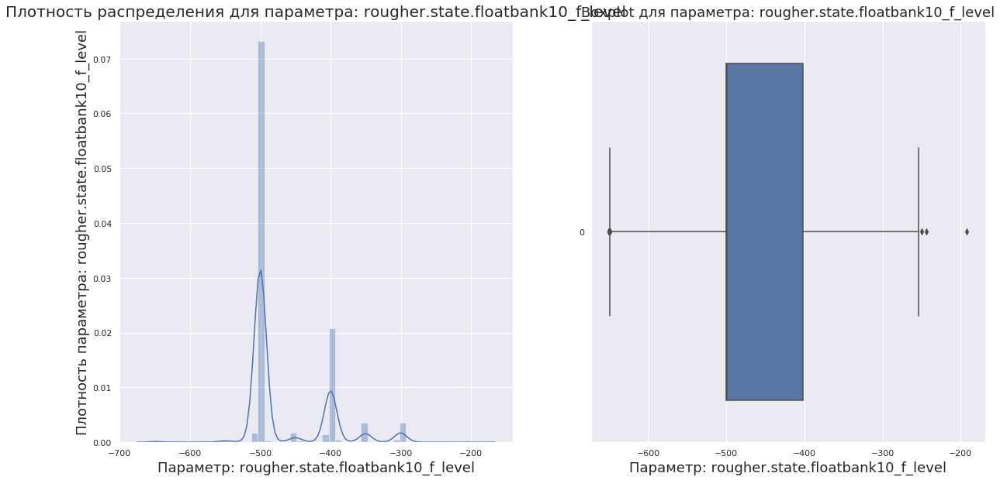

Доля выбросов параметра rougher.state.floatbank10_f_level равно: 0.13%
Анализ параметра 'secondary_cleaner.output.tail_ag':


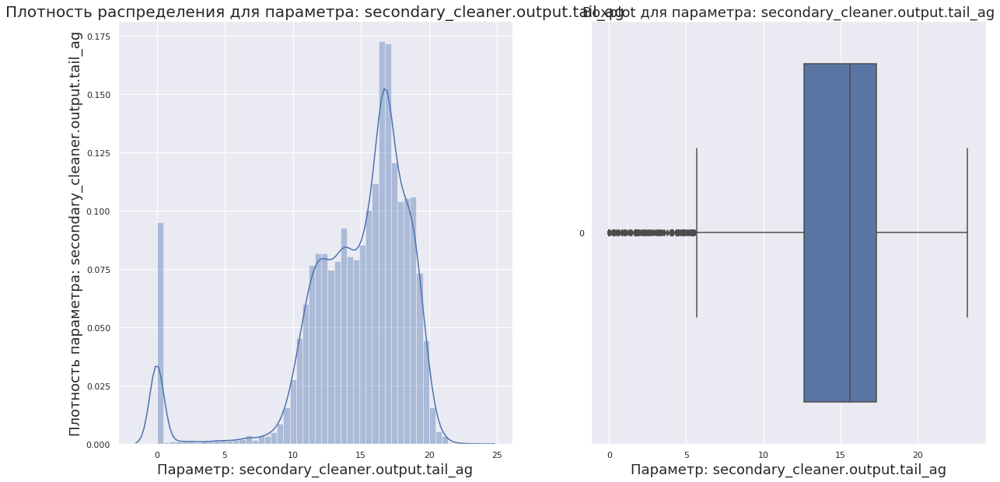

Доля выбросов параметра secondary_cleaner.output.tail_ag равно: 4.97%
Анализ параметра 'secondary_cleaner.output.tail_pb':


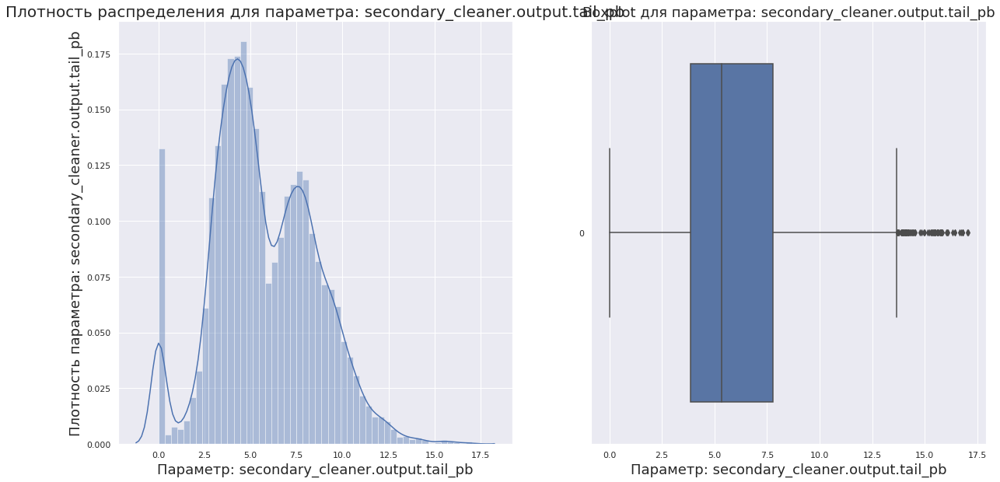

Доля выбросов параметра secondary_cleaner.output.tail_pb равно: 0.43%
Анализ параметра 'secondary_cleaner.output.tail_sol':


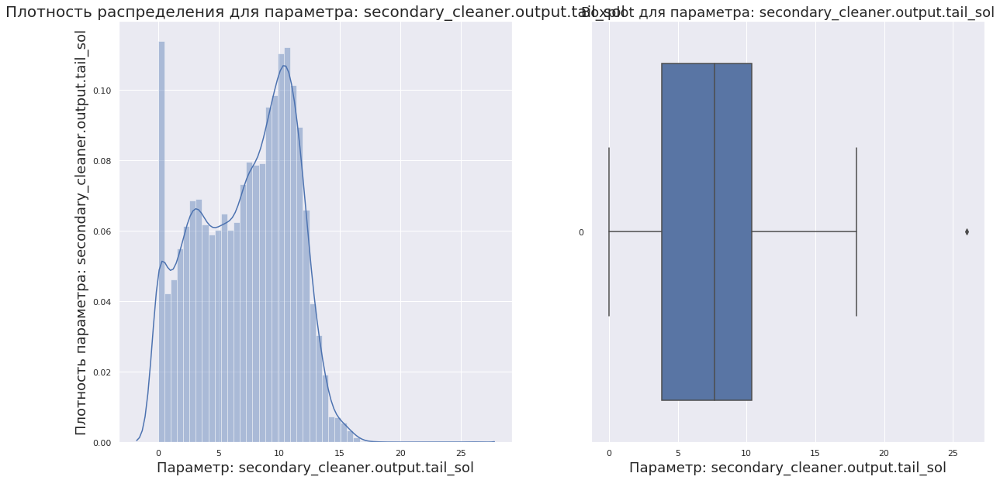

Доля выбросов параметра secondary_cleaner.output.tail_sol равно: 0.01%
Анализ параметра 'secondary_cleaner.output.tail_au':


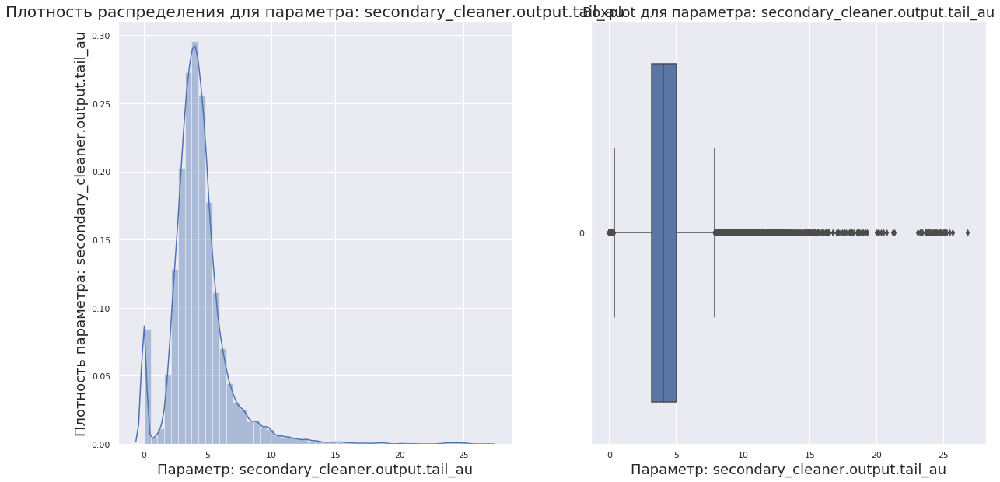

Доля выбросов параметра secondary_cleaner.output.tail_au равно: 10.09%
Анализ параметра 'secondary_cleaner.state.floatbank2_a_air':


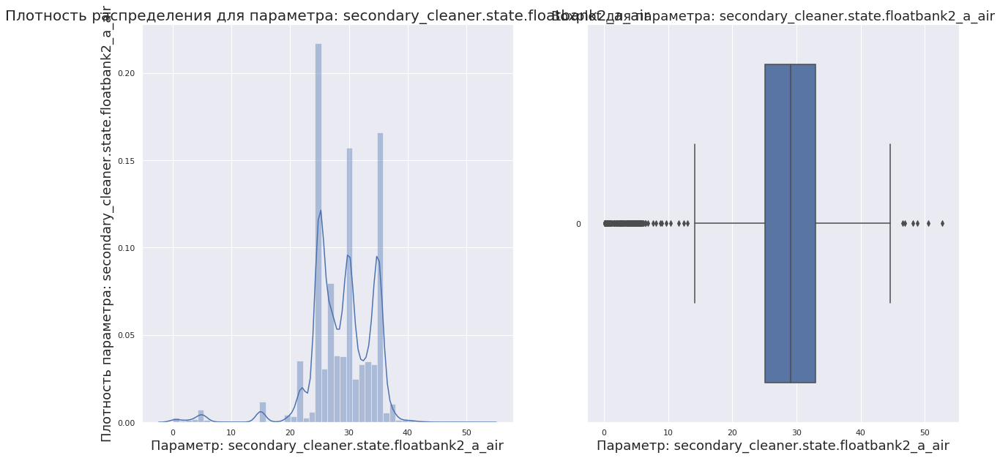

Доля выбросов параметра secondary_cleaner.state.floatbank2_a_air равно: 1.62%
Анализ параметра 'secondary_cleaner.state.floatbank2_a_level':


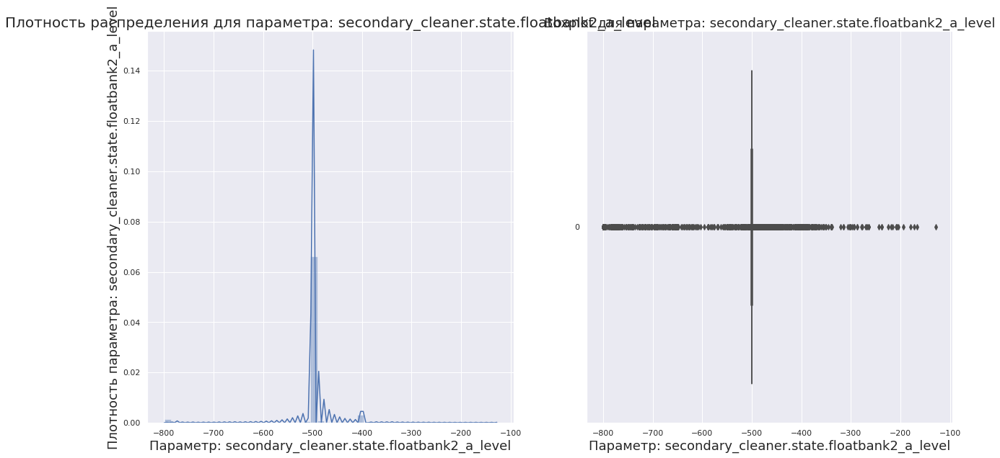

Доля выбросов параметра secondary_cleaner.state.floatbank2_a_level равно: 19.57%
Анализ параметра 'secondary_cleaner.state.floatbank2_b_air':


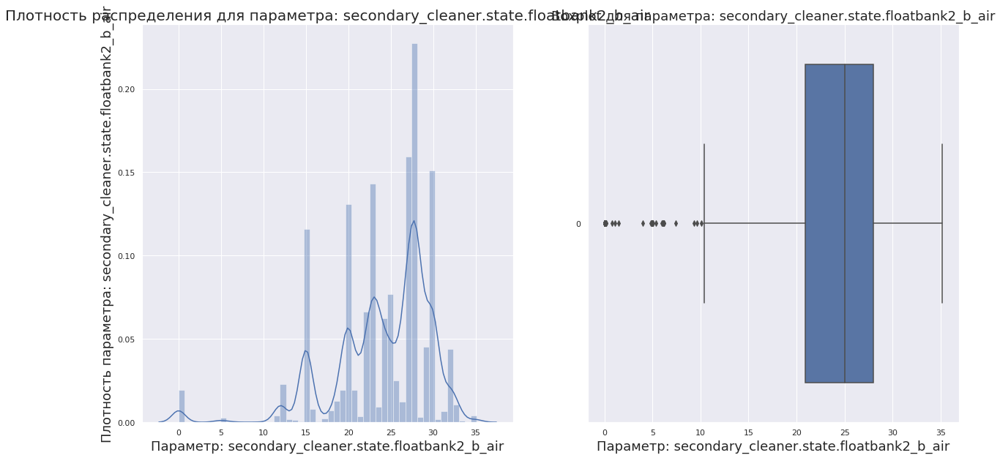

Доля выбросов параметра secondary_cleaner.state.floatbank2_b_air равно: 1.61%
Анализ параметра 'secondary_cleaner.state.floatbank2_b_level':


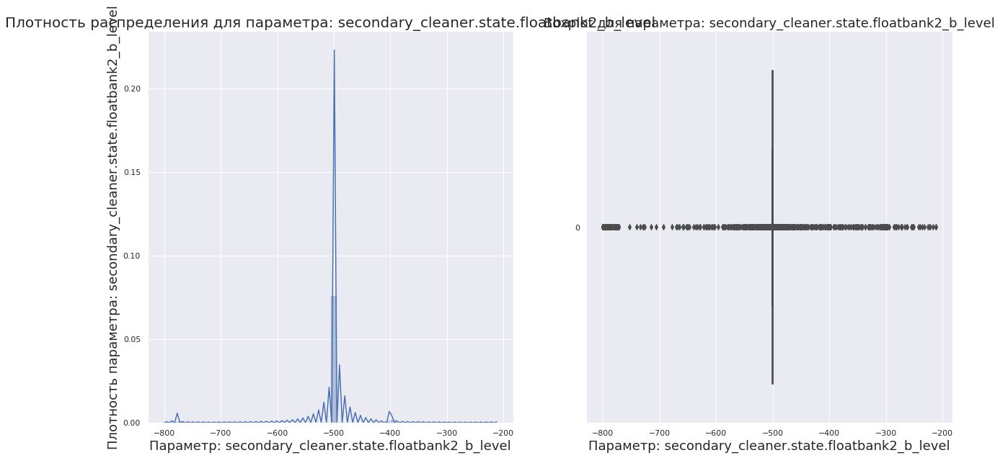

Доля выбросов параметра secondary_cleaner.state.floatbank2_b_level равно: 15.09%
Анализ параметра 'secondary_cleaner.state.floatbank3_a_air':


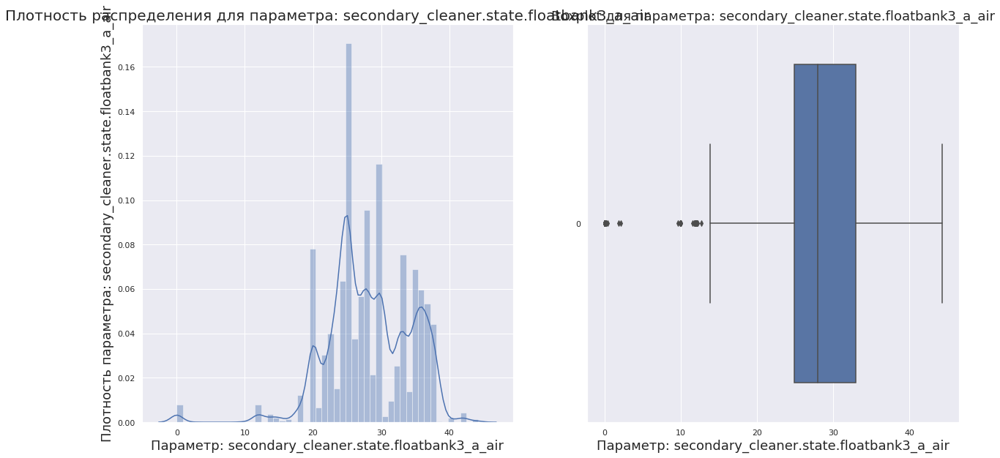

Доля выбросов параметра secondary_cleaner.state.floatbank3_a_air равно: 1.46%
Анализ параметра 'secondary_cleaner.state.floatbank3_a_level':


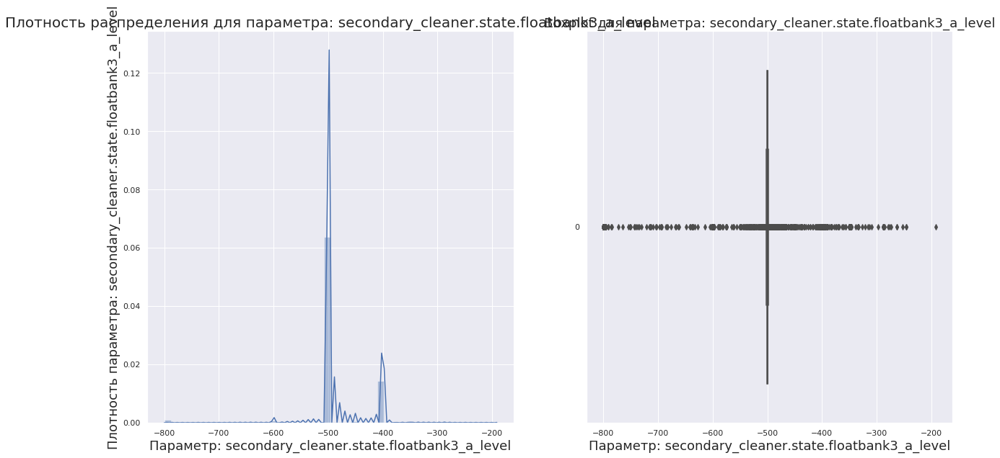

Доля выбросов параметра secondary_cleaner.state.floatbank3_a_level равно: 25.08%
Анализ параметра 'secondary_cleaner.state.floatbank3_b_air':


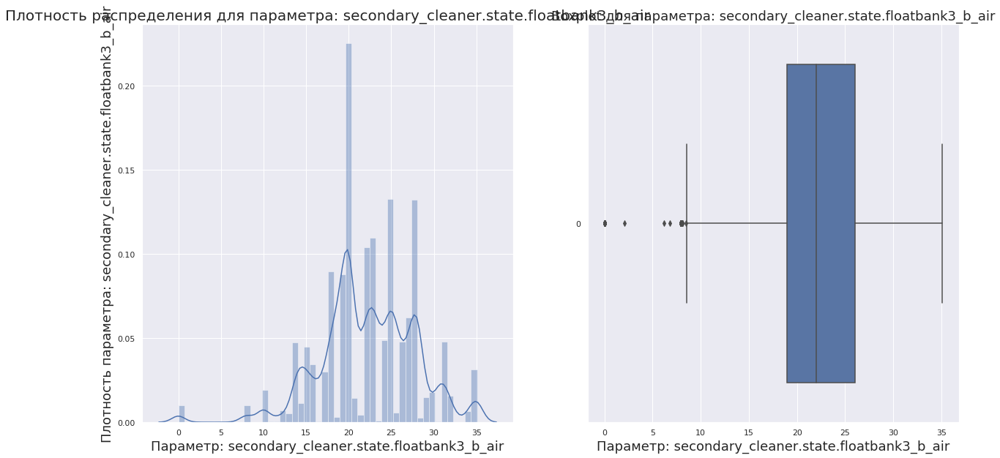

Доля выбросов параметра secondary_cleaner.state.floatbank3_b_air равно: 1.41%
Анализ параметра 'secondary_cleaner.state.floatbank3_b_level':


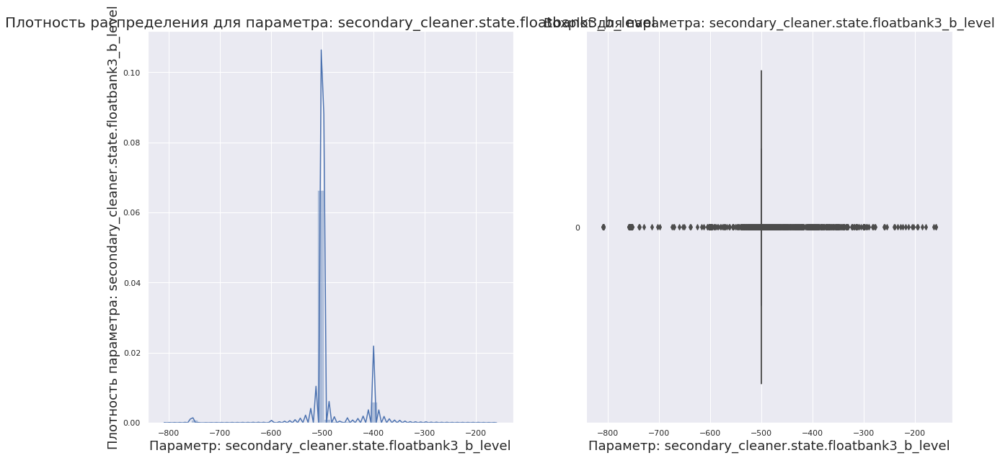

Доля выбросов параметра secondary_cleaner.state.floatbank3_b_level равно: 20.57%
Анализ параметра 'secondary_cleaner.state.floatbank4_a_air':


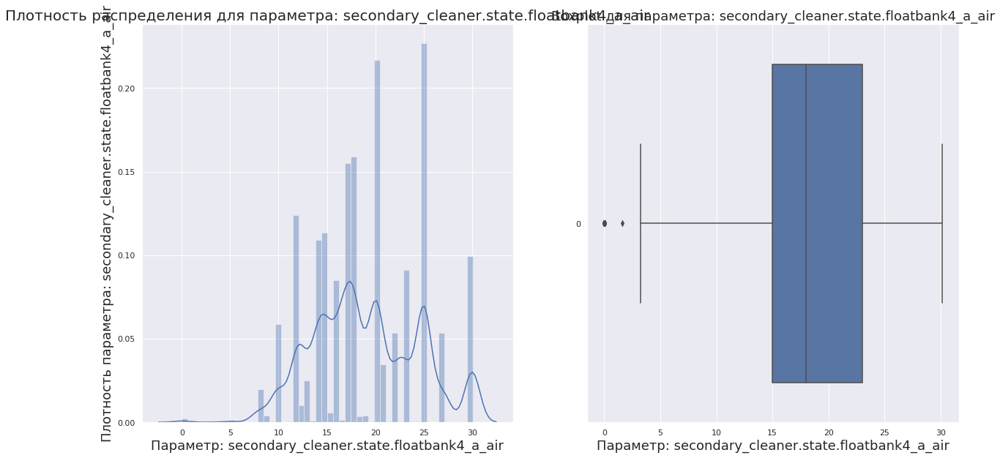

Доля выбросов параметра secondary_cleaner.state.floatbank4_a_air равно: 0.14%
Анализ параметра 'secondary_cleaner.state.floatbank4_a_level':


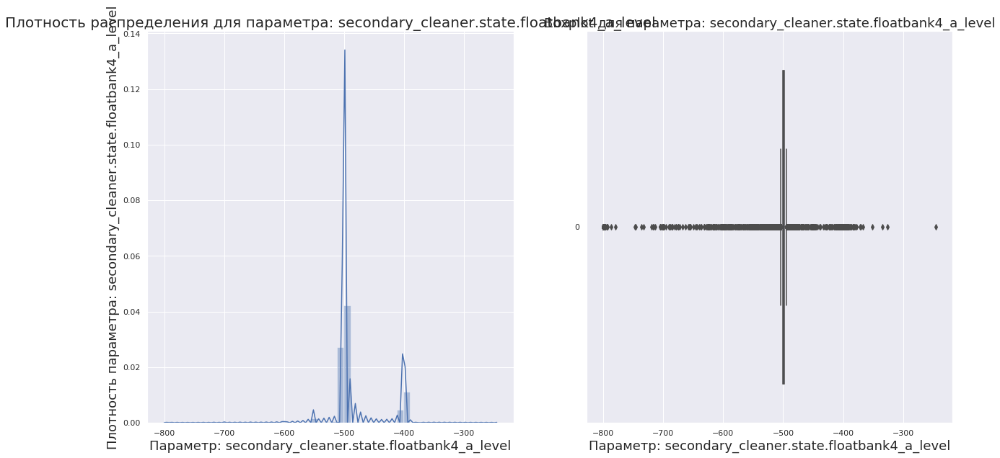

Доля выбросов параметра secondary_cleaner.state.floatbank4_a_level равно: 25.24%
Анализ параметра 'secondary_cleaner.state.floatbank4_b_air':


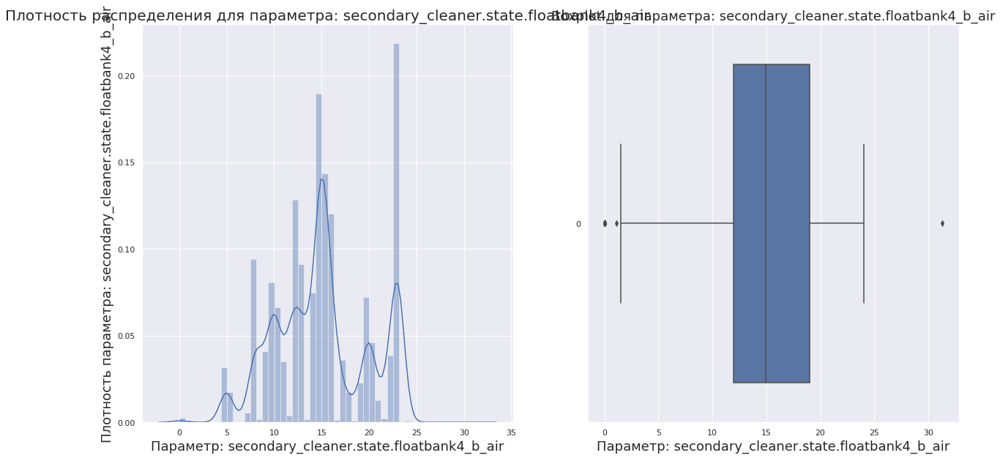

Доля выбросов параметра secondary_cleaner.state.floatbank4_b_air равно: 0.16%
Анализ параметра 'secondary_cleaner.state.floatbank4_b_level':


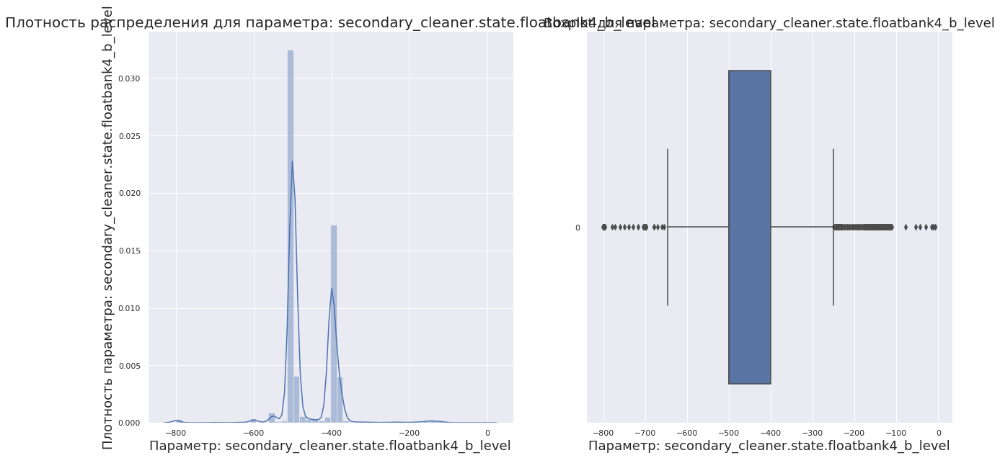

Доля выбросов параметра secondary_cleaner.state.floatbank4_b_level равно: 1.81%
Анализ параметра 'secondary_cleaner.state.floatbank5_a_air':


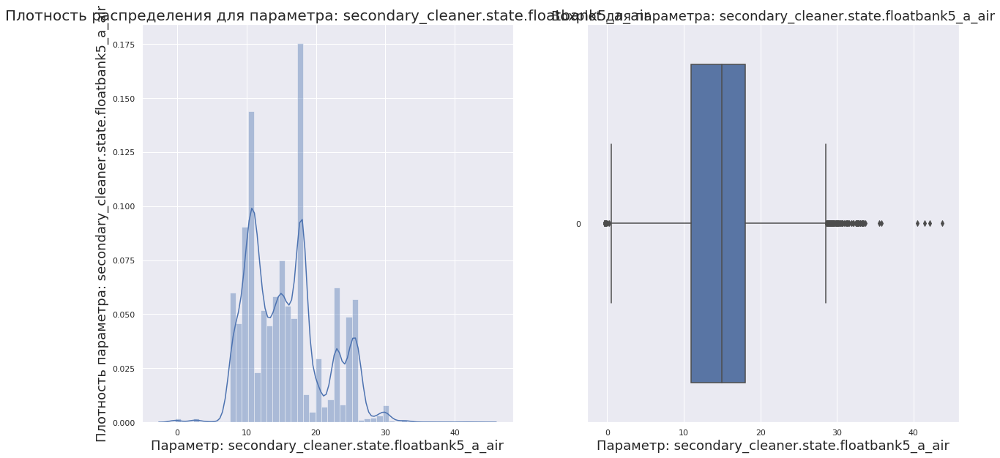

Доля выбросов параметра secondary_cleaner.state.floatbank5_a_air равно: 1.41%
Анализ параметра 'secondary_cleaner.state.floatbank5_a_level':


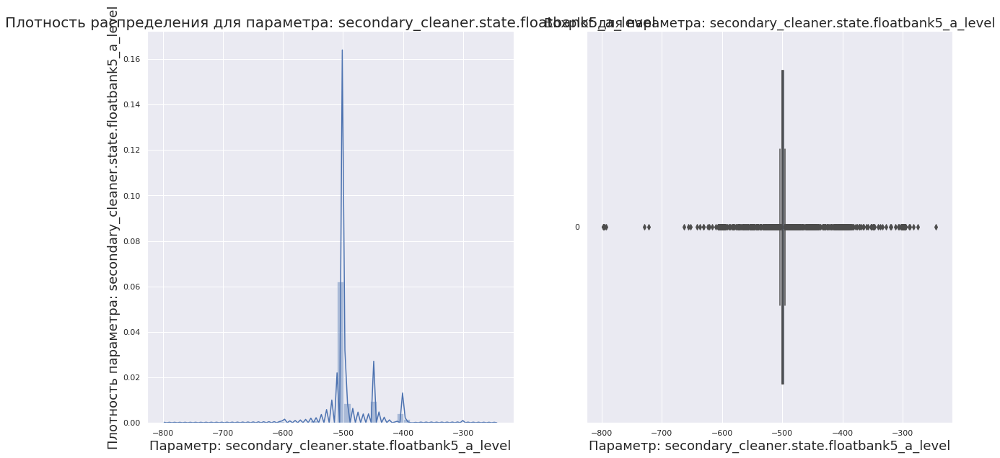

Доля выбросов параметра secondary_cleaner.state.floatbank5_a_level равно: 24.41%
Анализ параметра 'secondary_cleaner.state.floatbank5_b_air':


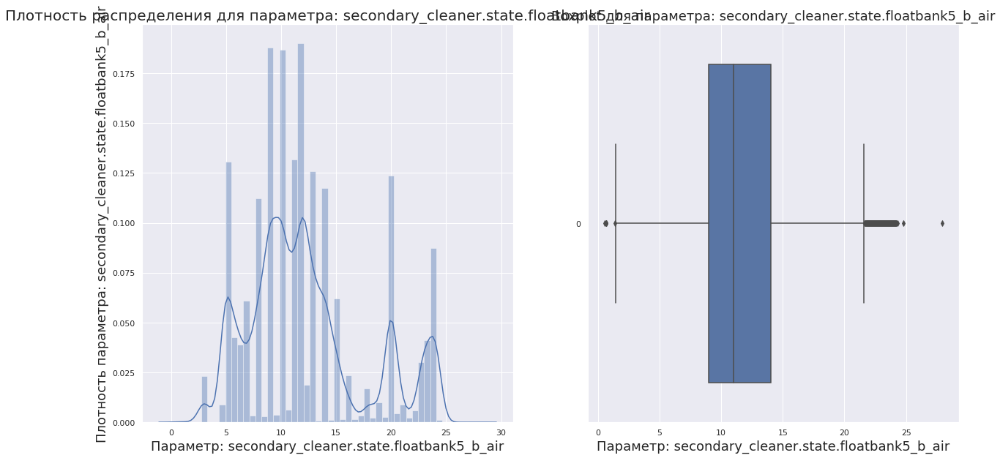

Доля выбросов параметра secondary_cleaner.state.floatbank5_b_air равно: 9.16%
Анализ параметра 'secondary_cleaner.state.floatbank5_b_level':


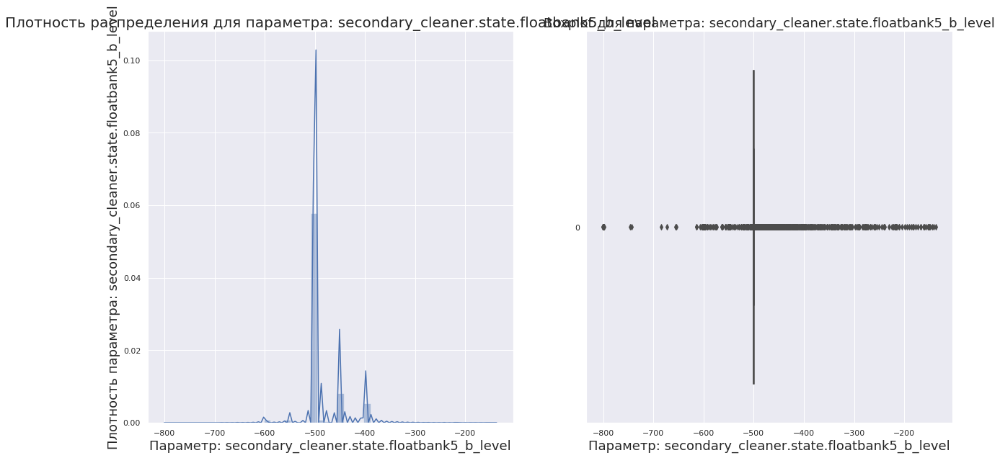

Доля выбросов параметра secondary_cleaner.state.floatbank5_b_level равно: 24.84%
Анализ параметра 'secondary_cleaner.state.floatbank6_a_air':


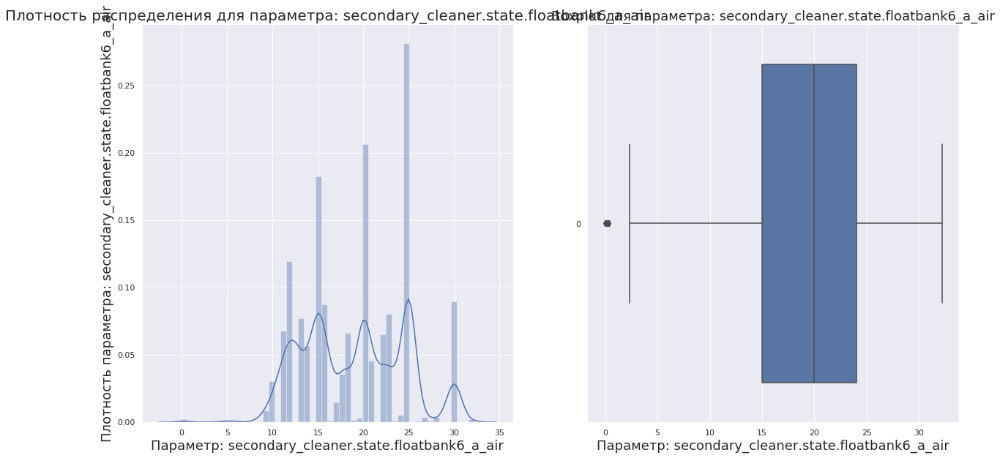

Доля выбросов параметра secondary_cleaner.state.floatbank6_a_air равно: 0.14%
Анализ параметра 'secondary_cleaner.state.floatbank6_a_level':


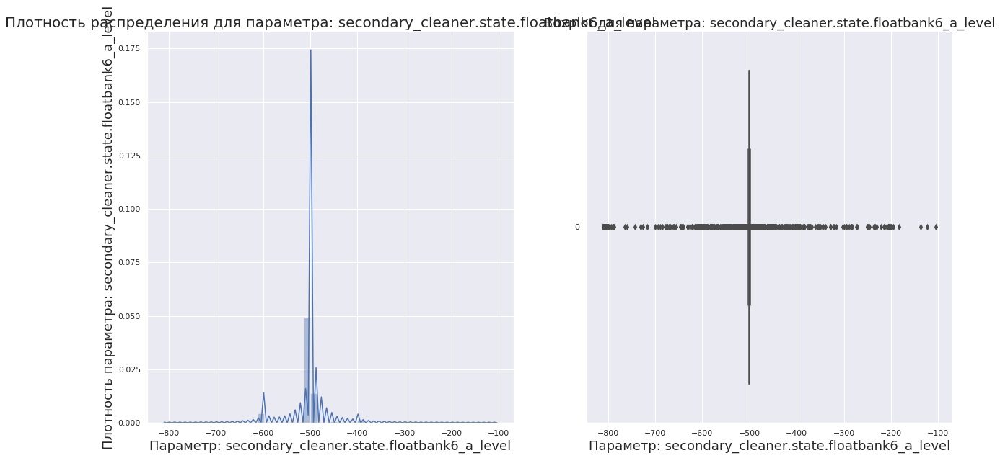

Доля выбросов параметра secondary_cleaner.state.floatbank6_a_level равно: 17.77%


In [90]:
#вызываем функцию осмотра параметров
check_param(50, df_full)

- Для ряда параметров наблюдаем нулевые пики
- Распределения параметров отличаются от нормального распределения
- Доля выбросов по параметрам state.floatbank_level для primary/secondary cleaner (до 25%) значительно превышает долю выбросов по остальным параметрам (до 10% - значительный показатель). Не будем удалять эти данные для сохранения связи по остальным столбцам. 
- Масштабы распределений различаются, потребуется нормализация.

### Проверка, что эффективность обогащения рассчитана правильно. 

Для проверки расчета эффективности обогащения понадобятся исходники для формулы эффективности обогащения **rougher.input.feed_au**, **rougher.output.concentrate_au**, **rougher.output.tail_au** и имеющиеся ответы **rougher.output.recovery**

In [91]:
columns_for_checking = ['rougher.input.feed_au', #входное сырье F
                        'rougher.output.concentrate_au', #выходной концентрат C
                        'rougher.output.tail_au',              #выходной остаток T
                        'rougher.output.recovery']           #эффективность обогащения
data_checking = df_train[columns_for_checking].dropna()

In [92]:
#функция проверки расчета эффективности обогащения
def rogher_recovery(data):
    C = data['rougher.output.concentrate_au']
    F = data['rougher.input.feed_au']
    T = data['rougher.output.tail_au']
    recovery_calculated = (C * (F - T)) / (F * (C - T)) * 100
    recovery_answers = data['rougher.output.recovery']

    return recovery_calculated, mean_absolute_error(recovery_answers, recovery_calculated)


In [93]:
rougher_recovery_calculated, MAE = rogher_recovery(data_checking)
MAE

9.682896147825551e-15

Показатель MAE близок к нулю. Делаем предположение, что показатель **rougher.output.recovery** рассчитан верно. Формула верна.

### Анализ признаков, недоступных в тестовой выборке

Рассмотрим множества и списки признаков для тестовой и исходной выборок

In [94]:
print("Количество признаков в исходной выборке: {0}, а количество уникальных признаков: {1}".format(len(list(df_full.columns)), len(set(df_full.columns))))
if (len(list(df_full.columns)) == len(list(df_full.columns))):
    print("Все признаки в исходном датасете уникальны")
else:
    print("Не все признаки в исходной выборке уникальны")
    
print("")

print("Количество признаков в тестовой выборке: {0}, а количество уникальных признаков: {1}".format(len(list(df_test.columns)), len(set(df_test.columns))))
if (len(list(df_full.columns)) == len(list(df_full.columns))):
    print("Все признаки в тестовой выборке уникальны")
else:
    print("Не все признаки в тестовой выборке уникальны")

Количество признаков в исходной выборке: 86, а количество уникальных признаков: 86
Все признаки в исходном датасете уникальны

Количество признаков в тестовой выборке: 52, а количество уникальных признаков: 52
Все признаки в тестовой выборке уникальны


In [95]:
if (len(set(df_test.columns) - set(df_full.columns)) == 0):
    print("Все признаки в тестовой выборке также присутствуют и в исходной выборке")

Все признаки в тестовой выборке также присутствуют и в исходной выборке


In [96]:
unavailable_test_columns = set(df_full.columns) - set(df_test.columns)
print("Количесвто недоступных признаков в тестовой выборке: ", len(unavailable_test_columns))
unavailable_test_columns

Количесвто недоступных признаков в тестовой выборке:  34


{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

Следующие признаки недоступны в тестовой выборке: 1) **output** - выходные продукты на разных стадиях и целевой показатель recovery (на стадии флотации и финальный), 2) **calculation** - расчетные параметры на стадии флотации (rougher)

### Предобработка данных

Так как в тестовой выборке нет ряда признаков, на которые будет опираться модель при оценке recovery, то в обучающей выборке эти признаки также нужно удалить.

In [97]:
to_delete_columns = list(unavailable_test_columns)
to_delete_columns.remove('rougher.output.recovery')
to_delete_columns.remove('final.output.recovery')

print("Количество признаков к удалению: ", len(to_delete_columns))
to_delete_columns

Количество признаков к удалению:  32


['rougher.output.tail_sol',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'secondary_cleaner.output.tail_pb',
 'rougher.output.concentrate_au',
 'final.output.concentrate_pb',
 'secondary_cleaner.output.tail_sol',
 'rougher.calculation.sulfate_to_au_concentrate',
 'primary_cleaner.output.tail_ag',
 'final.output.tail_ag',
 'primary_cleaner.output.concentrate_ag',
 'rougher.output.tail_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_sol',
 'final.output.tail_au',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.output.tail_pb',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_ag',
 'primary_cleaner.output.tail_pb',
 'secondary_cleaner.output.tail_au',
 'rougher.output.tail_au',
 'secondary_cleaner.output.tail_ag',
 'primary_cleaner.output.concentrate_sol',
 'final.output.tail_pb

In [98]:
print(df_train.shape)
df_train = df_train.drop(to_delete_columns, axis=1)
print(df_train.shape)

(14149, 86)
(14149, 54)


In [99]:
df_train.head()

,final.output.recovery,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,70.541216,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,69.266198,125.629232,10.296251,7.25,1.002663,1576.166671,-500.904965,1575.950626,-499.865889,1575.994189,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,68.116445,123.819808,11.316280,7.25,0.991265,1601.556163,-499.997791,1600.386685,-500.607762,1602.003542,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,68.347543,122.270188,11.322140,7.25,0.996739,1599.968720,-500.951778,1600.659236,-499.677094,1600.304144,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,66.927016,117.988169,11.913613,7.25,1.009869,1601.339707,-498.975456,1601.437854,-500.323246,1599.581894,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


При этом в тестовой выборке необходимо добавить ответы по целевым показателям **rougher.output.recovery** и **final.output.recovery** для оценки модели на тестовой выборке после обучения.

In [100]:
print(df_test.shape)
df_test = df_test.merge(df_full[['rougher.output.recovery', 'final.output.recovery']], left_index=True, right_index=True, how='left')
print(df_test.shape)

(5290, 52)
(5290, 54)


In [101]:
df_test.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,...,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,rougher.output.recovery,final.output.recovery
date,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,...,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414,89.993421,70.273583
2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,...,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438,88.089657,68.910432
2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,...,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559,88.412756,68.143213
2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,...,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987,87.360133,67.776393
2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,-500.810606,...,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333,83.236367,61.467078


Посмотрим на число наблюдений с целевым признаком recovery = 0.

In [102]:
print("В обучающей выборке число нулей в целевом признаке rougher.output.recovery: {0}, а в rougher.output.final: {1}"
     .format(len(df_train[df_train['rougher.output.recovery']==0]), len(df_train[df_train['final.output.recovery']==0])))

print("В тестовой выборке число нулей в целевом признаке rougher.output.recovery: {0}, а в rougher.output.final: {1}"
     .format(len(df_test[df_test['rougher.output.recovery']==0]), len(df_test[df_test['final.output.recovery']==0])))

print("В исходном датасете число нулей в целевом признаке rougher.output.recovery: {0}, а в rougher.output.final: {1}"
     .format(len(df_full[df_full['rougher.output.recovery']==0]), len(df_full[df_full['final.output.recovery']==0])))

В обучающей выборке число нулей в целевом признаке rougher.output.recovery: 297, а в rougher.output.final: 58
В тестовой выборке число нулей в целевом признаке rougher.output.recovery: 97, а в rougher.output.final: 40
В исходном датасете число нулей в целевом признаке rougher.output.recovery: 394, а в rougher.output.final: 98


Интересно, являются ли эти нули действительными значениями или аномалиями. 

In [103]:
df_train.isna().sum()

final.output.recovery                           0
primary_cleaner.input.sulfate                  20
primary_cleaner.input.depressant               32
primary_cleaner.input.feed_size                 0
primary_cleaner.input.xanthate                100
primary_cleaner.state.floatbank8_a_air          4
primary_cleaner.state.floatbank8_a_level        1
primary_cleaner.state.floatbank8_b_air          4
primary_cleaner.state.floatbank8_b_level        1
primary_cleaner.state.floatbank8_c_air          2
primary_cleaner.state.floatbank8_c_level        1
primary_cleaner.state.floatbank8_d_air          3
primary_cleaner.state.floatbank8_d_level        1
rougher.input.feed_ag                           0
rougher.input.feed_pb                         100
rougher.input.feed_rate                         8
rougher.input.feed_size                       144
rougher.input.feed_sol                         78
rougher.input.feed_au                           0
rougher.input.floatbank10_sulfate              29


In [104]:
df_test.isna().sum()

primary_cleaner.input.sulfate                  4
primary_cleaner.input.depressant               5
primary_cleaner.input.feed_size                0
primary_cleaner.input.xanthate                 4
primary_cleaner.state.floatbank8_a_air         0
primary_cleaner.state.floatbank8_a_level       0
primary_cleaner.state.floatbank8_b_air         0
primary_cleaner.state.floatbank8_b_level       0
primary_cleaner.state.floatbank8_c_air         0
primary_cleaner.state.floatbank8_c_level       0
primary_cleaner.state.floatbank8_d_air         0
primary_cleaner.state.floatbank8_d_level       0
rougher.input.feed_ag                          0
rougher.input.feed_pb                          0
rougher.input.feed_rate                        3
rougher.input.feed_size                        1
rougher.input.feed_sol                        21
rougher.input.feed_au                          0
rougher.input.floatbank10_sulfate              5
rougher.input.floatbank10_xanthate             0
rougher.input.floatb

Количество пропусков в обучающей выборке значительно превышает число пропусков в тестовой выборке. Заменим пропуски с помощью метода ffill (forward fill, принимаем, что соседние данные несильно отличаются).

In [105]:
df_train = df_train.fillna(method='ffill')
df_test = df_test.fillna(method='ffill')

In [106]:
df_train.isna().sum()

final.output.recovery                         0
primary_cleaner.input.sulfate                 0
primary_cleaner.input.depressant              0
primary_cleaner.input.feed_size               0
primary_cleaner.input.xanthate                0
primary_cleaner.state.floatbank8_a_air        0
primary_cleaner.state.floatbank8_a_level      0
primary_cleaner.state.floatbank8_b_air        0
primary_cleaner.state.floatbank8_b_level      0
primary_cleaner.state.floatbank8_c_air        0
primary_cleaner.state.floatbank8_c_level      0
primary_cleaner.state.floatbank8_d_air        0
primary_cleaner.state.floatbank8_d_level      0
rougher.input.feed_ag                         0
rougher.input.feed_pb                         0
rougher.input.feed_rate                       0
rougher.input.feed_size                       0
rougher.input.feed_sol                        0
rougher.input.feed_au                         0
rougher.input.floatbank10_sulfate             0
rougher.input.floatbank10_xanthate      

In [107]:
df_test.isna().sum()

primary_cleaner.input.sulfate                 0
primary_cleaner.input.depressant              0
primary_cleaner.input.feed_size               0
primary_cleaner.input.xanthate                0
primary_cleaner.state.floatbank8_a_air        0
primary_cleaner.state.floatbank8_a_level      0
primary_cleaner.state.floatbank8_b_air        0
primary_cleaner.state.floatbank8_b_level      0
primary_cleaner.state.floatbank8_c_air        0
primary_cleaner.state.floatbank8_c_level      0
primary_cleaner.state.floatbank8_d_air        0
primary_cleaner.state.floatbank8_d_level      0
rougher.input.feed_ag                         0
rougher.input.feed_pb                         0
rougher.input.feed_rate                       0
rougher.input.feed_size                       0
rougher.input.feed_sol                        0
rougher.input.feed_au                         0
rougher.input.floatbank10_sulfate             0
rougher.input.floatbank10_xanthate            0
rougher.input.floatbank11_sulfate       

Пропуски успешно заполнены с помощью соседних наблюдений.

Вывод по пункту 1:

- В обучающей выборке 14149 наблюдений и 86 признаков, наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 
- В тестовой выборке 5290 наблюдений и 52 признака, наблюдаем незначительные пропуски по некоторым параметрам, дубликатов нет
- В исходном датасете 19439 наблюдений и 86 признаков, наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 
- Дату в трех выборках перевели в индекс (в формате DateTime)
- Для ряда параметров наблюдаем нулевые пики
- Распределения параметров отличаются от нормального распределения
- Доля выбросов по параметрам state.floatbank_level для primary/secondary cleaner (до 25%) значительно превышает долю выбросов по остальным параметрам (до 10% - значительный показатель). Не будем удалять эти данные для сохранения связи по остальным столбцам. 
- Масштабы распределений различаются, потребуется нормализация.
- Показатель MAE близок к нулю, делаем предположение, что формула расчета эффективности обогащения верна.
- Следующие признаки недоступны в тестовой выборке: 1) **output** - выходные продукты на разных стадиях и целевой показатель recovery (на стадии флотации и финальный), 2) **calculation** - расчетные параметры на стадии флотации (rougher)
- Пропуски успешно заполнены с помощью соседних наблюдений

## Анализ данных

### Анализ изменения концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

Пропишем функцию построения графика изменения концентраций для отдельно взятого металла за все время. 

In [108]:
#функция анализа концентраций по времени для определенного металла
def concentr_change_time_builder(data_columns_name, label_name, resolution):
    
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Концентрация на разных этапах для металла: {}".format(label_name), fontsize=20)
    axes.set_ylabel("Концентрация металла: " + label_name, fontsize=18)
    axes.set_xlabel("Время", fontsize=18)
    sns.lineplot(data=df_full[data_columns_name].groupby(df_full.index.round(f'{resolution}D')).mean())

    plt.show()
#функция анализа концентрация гистограммой   
def concentr_change_hist_builder(data_columns_name, label_name, bins):
    
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Плотность распределения для металла: " + label_name, fontsize=20)
    axes.set_xlabel("Параметр: " + label_name, fontsize=18)
    for name in data_columns_name:
        sns.distplot(df_full[name], axlabel = "Концентрация металла: " + label_name, label = name, bins=bins)
    plt.legend(fontsize=16)
    plt.show()
    
def concentr_analyzer(data_columns_name, label_name, resolution, bins):
    print("Анализ металла: " + label_name)
    concentr_change_time_builder(data_columns_name, label_name, resolution)
    concentr_change_hist_builder(data_columns_name, label_name, bins)

# Золото Au

Анализ металла: Золото


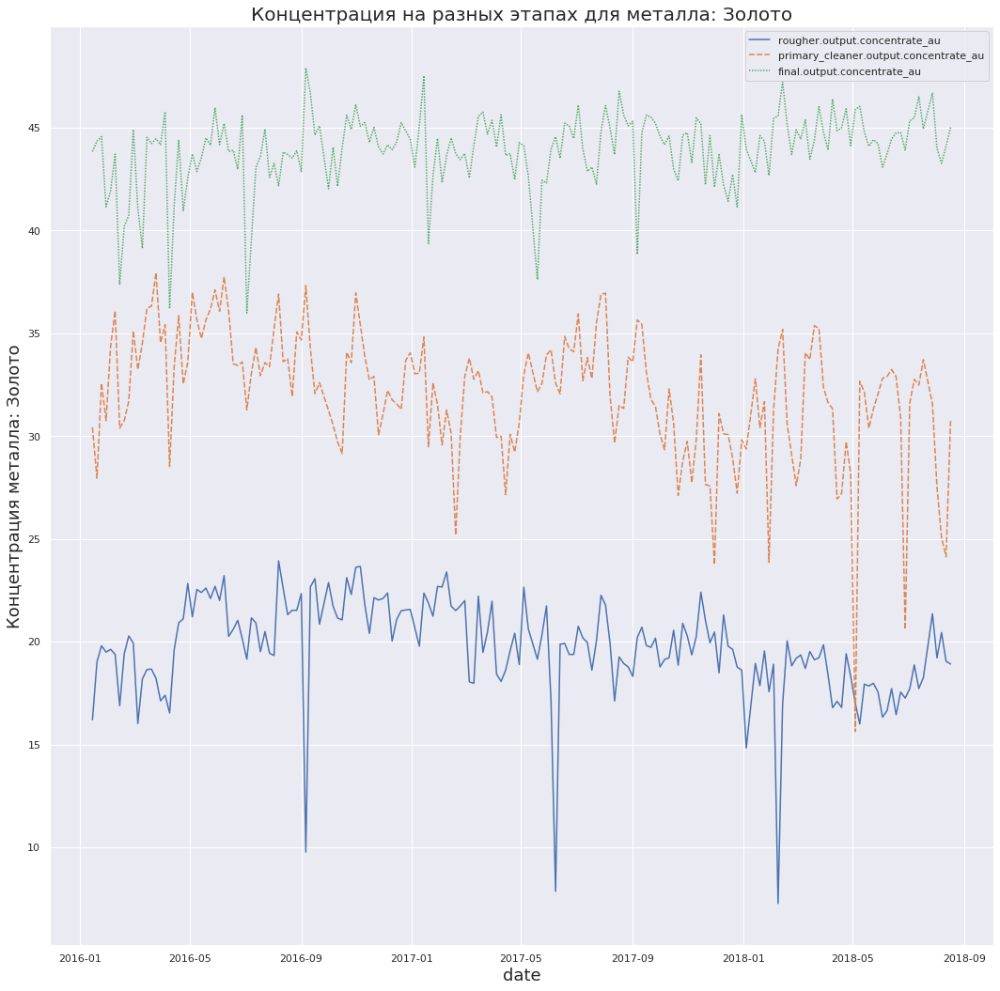

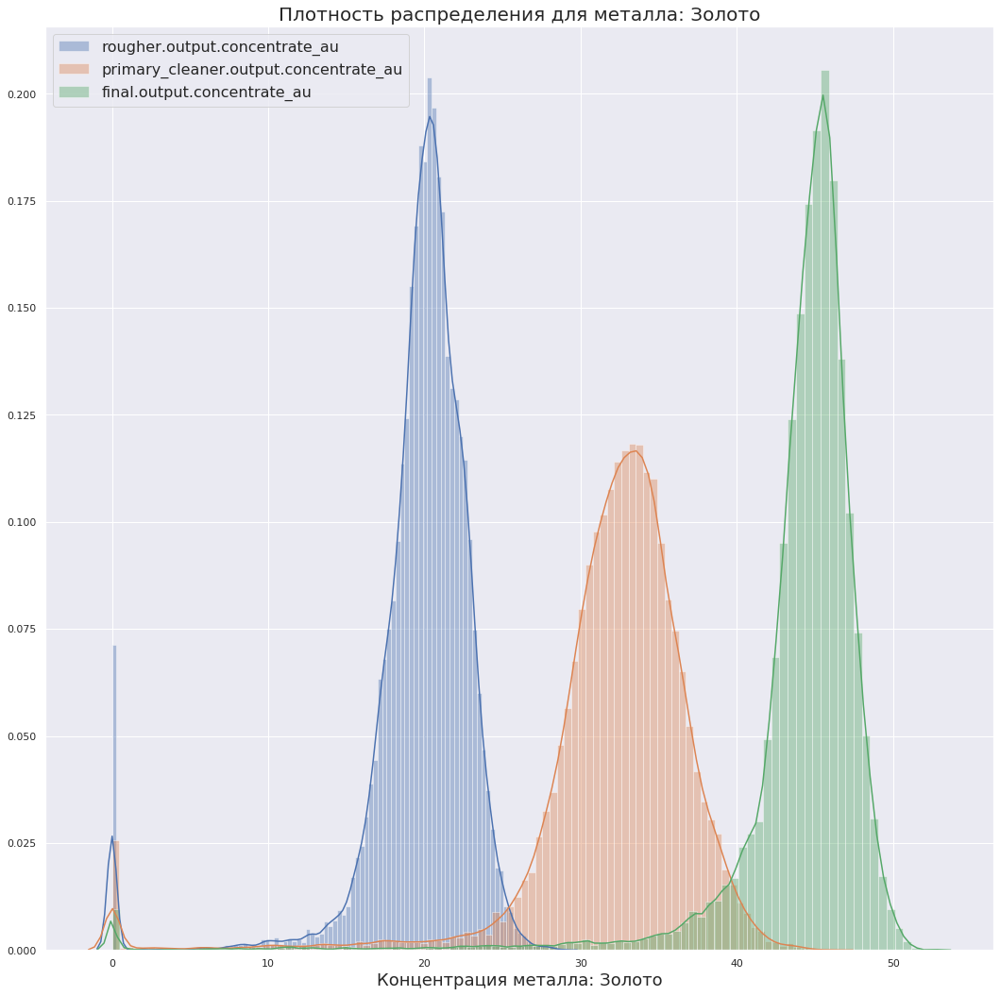

In [109]:
concentr_analyzer(['rougher.output.concentrate_au', 'primary_cleaner.output.concentrate_au', 'final.output.concentrate_au'], "Золото", 5, 100)

Заметно увеличение концентрации золота от первой стадии флотации (15 - 25%) - ко второй стадии (после первой очистки) (25-40%) и к финальной стадии очистки (35 - 50%).

# Серебро Ag

Анализ металла: Серебро


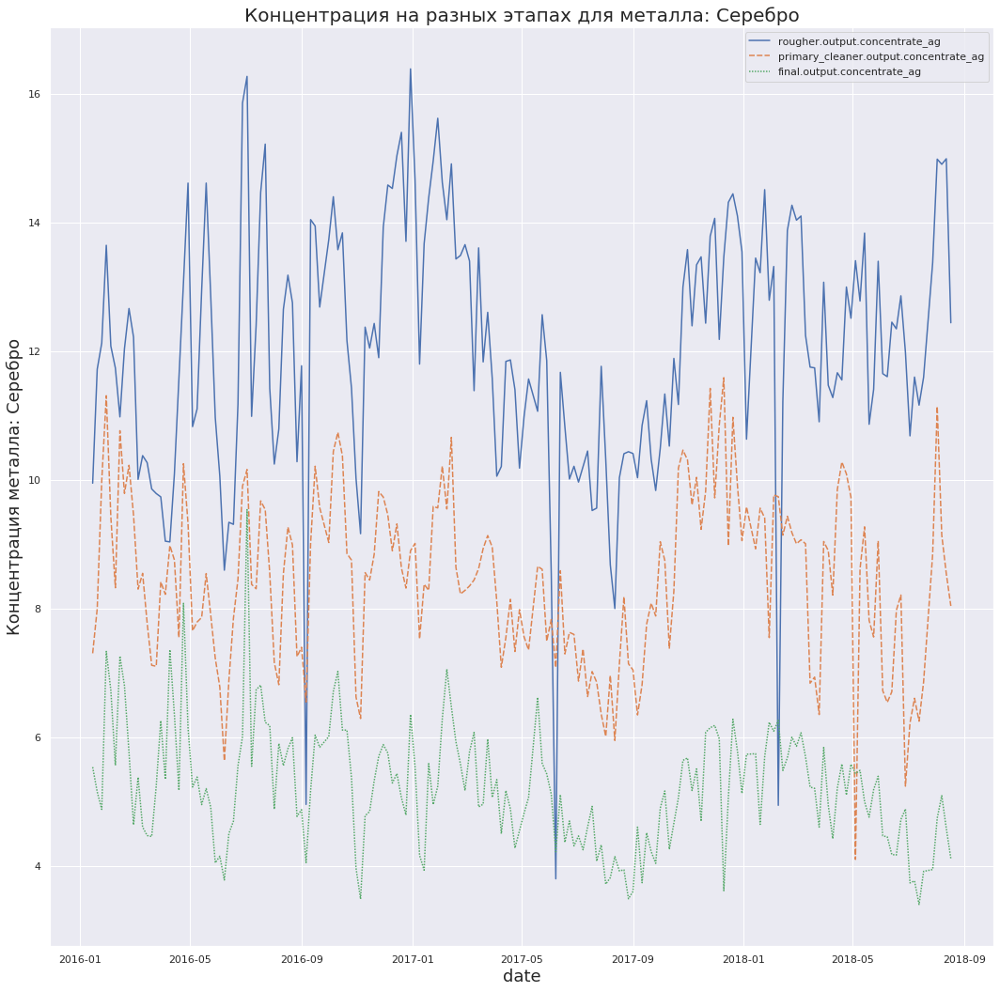

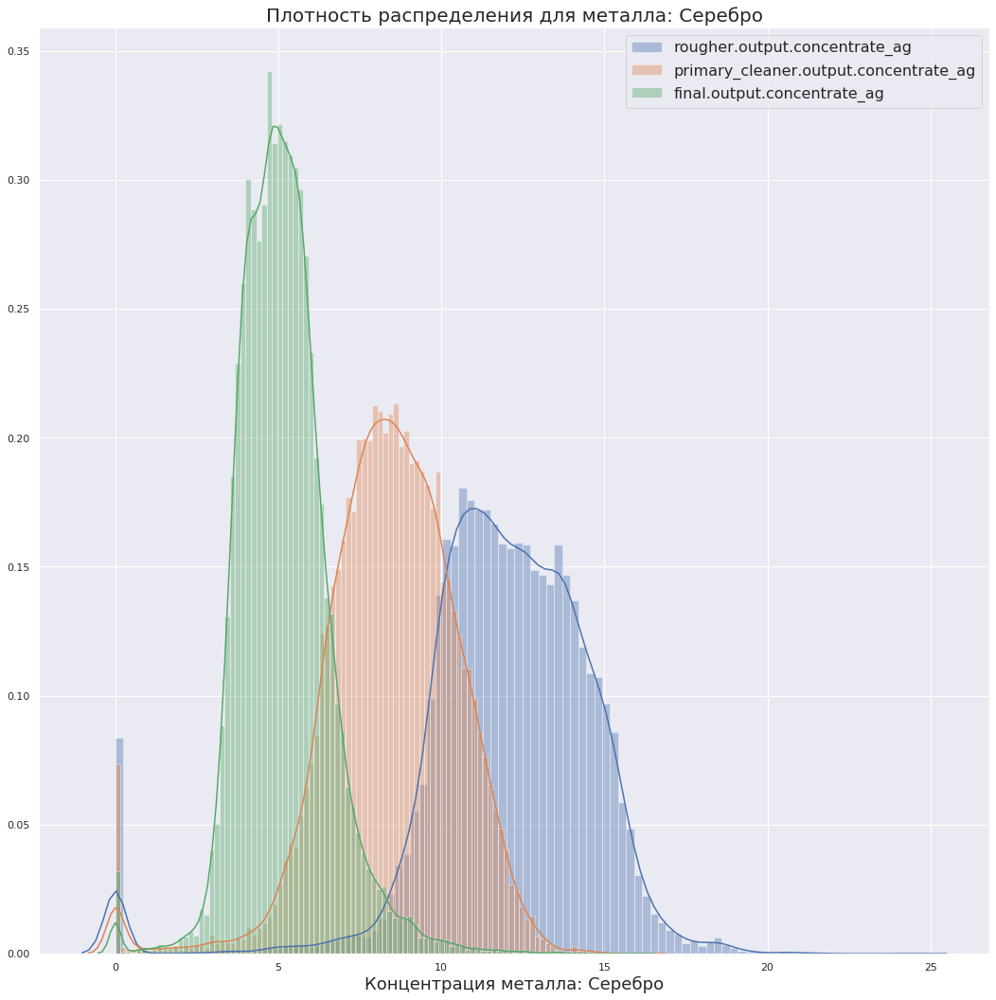

In [110]:
concentr_analyzer(['rougher.output.concentrate_ag', 'primary_cleaner.output.concentrate_ag', 'final.output.concentrate_ag'], "Серебро", 5, 100)

Заметно снижение концентрации серебра от первой стадии флотации - ко второй стадии (после первой очистки)  и к финальной стадии очистки.

# Свинец Pb

Анализ металла: Свинец


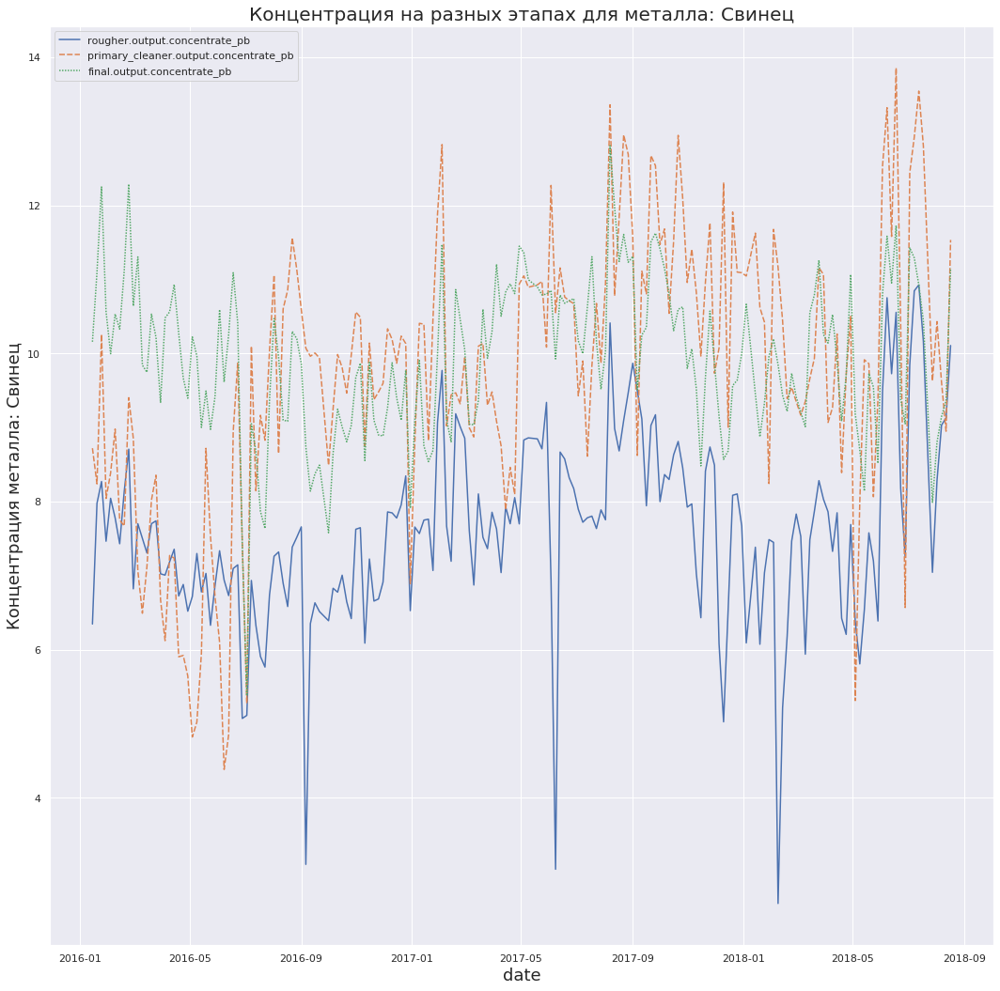

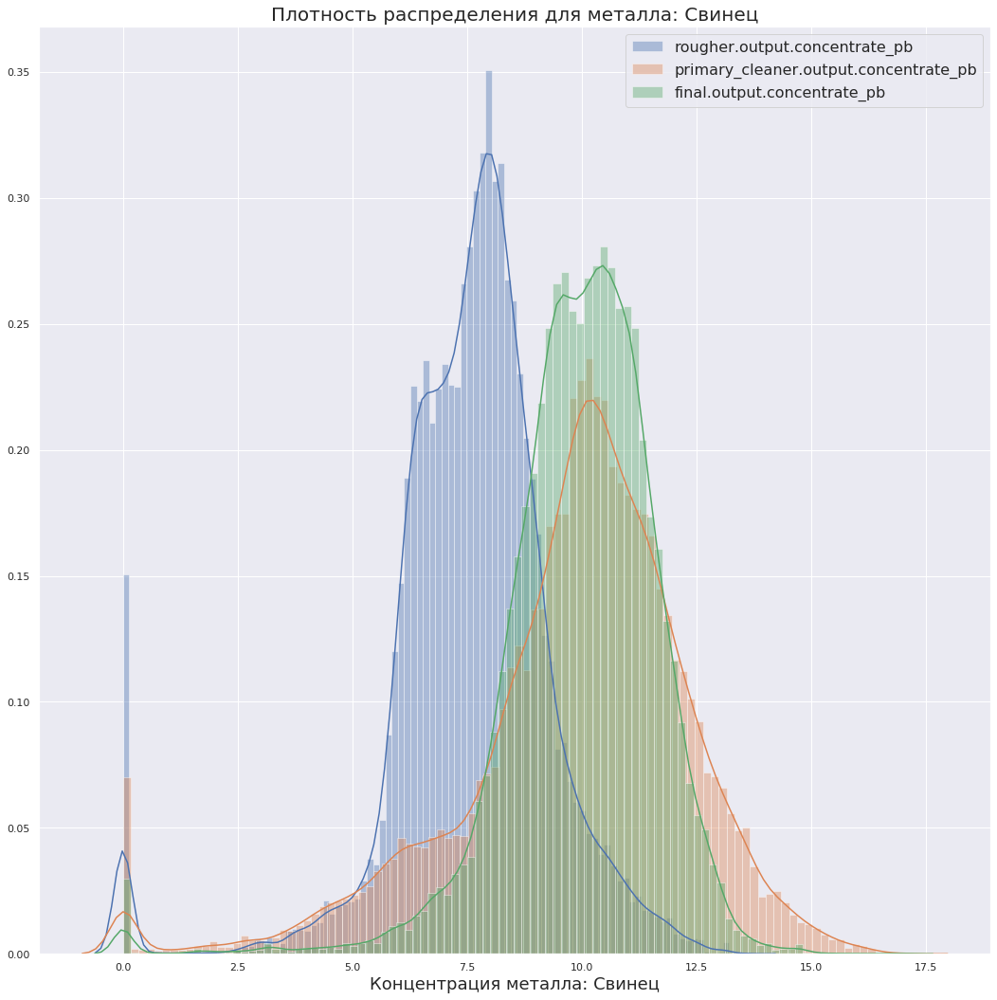

In [111]:
concentr_analyzer(['rougher.output.concentrate_pb', 'primary_cleaner.output.concentrate_pb', 'final.output.concentrate_pb'], "Свинец", 5, 100)

Заметно увеличение концентрации свинца от первой стадии флотации - ко второй стадии (после первой очистки), и незаметное изменение к финальной стадии очистки (при этом диапазон концентраций к финальной стадии сужается по сравнению с второй стадией). 

Для всех трех металлов наблюдаются пики нулевых значений.

### Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках

Посмотрим на гистограммы для признака "feed_size" в обучающей и тестовой выборке. По ним будем судить совпадают ли распределения.

In [112]:
def compare_feed_size(df_train, df_test, bins):
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Плотность распределения гранул сырья: ", fontsize=20)
    axes.set_xlabel("Размер гранул сырья: ", fontsize=18)
    sns.distplot(df_train['rougher.input.feed_size'], axlabel = "Размер гранул сырья: ", label = "Обучающая выборка", bins=bins)
    sns.distplot(df_test['rougher.input.feed_size'], axlabel = "Размер гранул сырья: ", label = "Тестовая выборка", bins=bins)
    
    plt.legend(fontsize=16)
    plt.show()
    

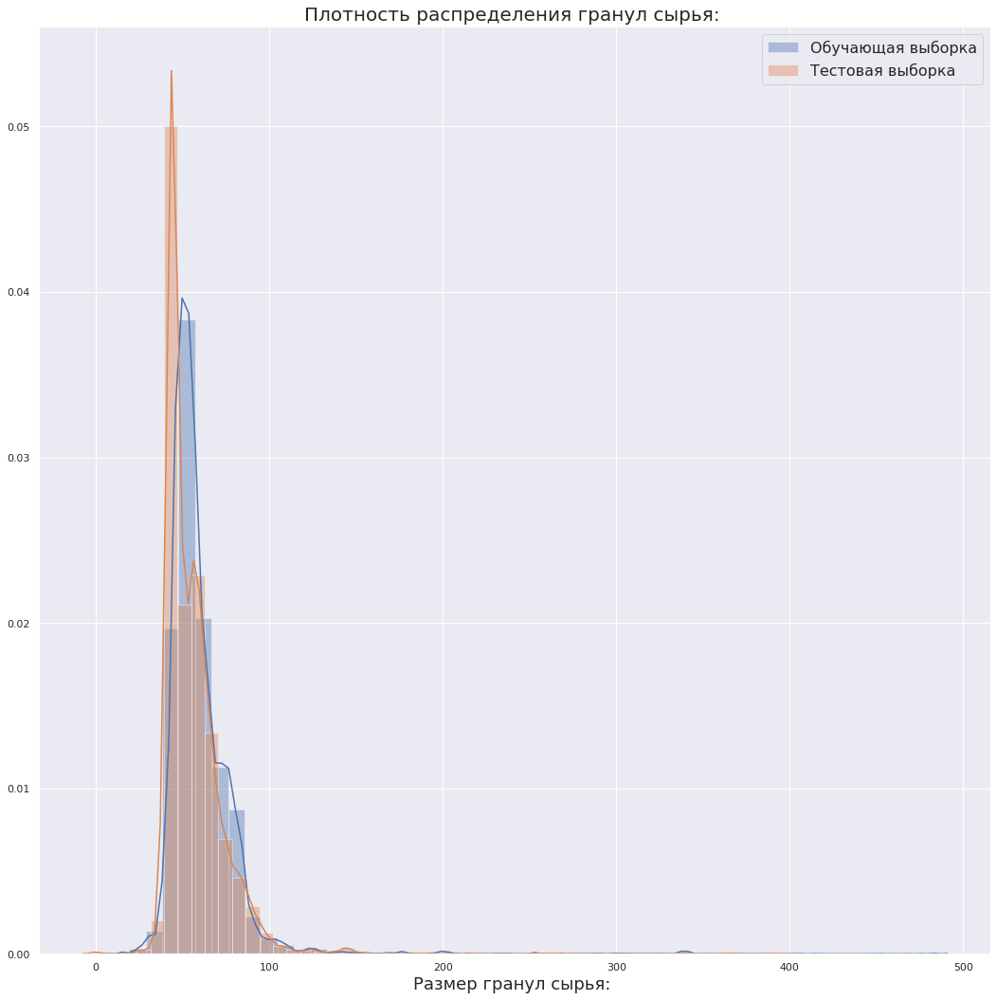

In [113]:
compare_feed_size(df_train, df_test, 50)

Распределения двух выборок "похожи". Также заметны выбросы в признаке. Удалим выбросы и посмотрим на гистограмму.

In [114]:
anomaly_detection(df_train['rougher.input.feed_size'], "*Размер гранул сырья*")

Доля выбросов параметра *Размер гранул сырья* равно: 3.34%


In [115]:
anomaly_detection(df_test['rougher.input.feed_size'], "*Размер гранул сырья*")

Доля выбросов параметра *Размер гранул сырья* равно: 3.42%


In [116]:
def anomaly_checker(data_column):
    anomaly_threshold_up = data_column.quantile(0.75) + (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    anomaly_threshold_down = data_column.quantile(0.25) - (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    return anomaly_threshold_up, anomaly_threshold_down

In [117]:
#находим границы выбросов в feed_size для df_train
up_train_threshold, down_train_threshold = anomaly_checker(df_train['rougher.input.feed_size'])

In [118]:
#находим границы выбросов в feed_size для df_test
up_test_threshold, down_test_threshold = anomaly_checker(df_test['rougher.input.feed_size'])

In [119]:
def compare_feed_size(df_train, df_test, bins):
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Плотность распределения гранул сырья: ", fontsize=20)
    axes.set_xlabel("Размер гранул сырья: ", fontsize=18)
    sns.distplot(df_train[(df_train['rougher.input.feed_size'] < up_train_threshold) & (df_train['rougher.input.feed_size'] > down_train_threshold)]['rougher.input.feed_size'], axlabel = "Размер гранул сырья: ", label = "Обучающая выборка", bins=bins)
    sns.distplot(df_test[(df_test['rougher.input.feed_size'] < up_test_threshold) & (df_test['rougher.input.feed_size'] > down_test_threshold)]['rougher.input.feed_size'], axlabel = "Размер гранул сырья: ", label = "Тестовая выборка", bins=bins)
    
    plt.legend(fontsize=16)
    plt.show()
    

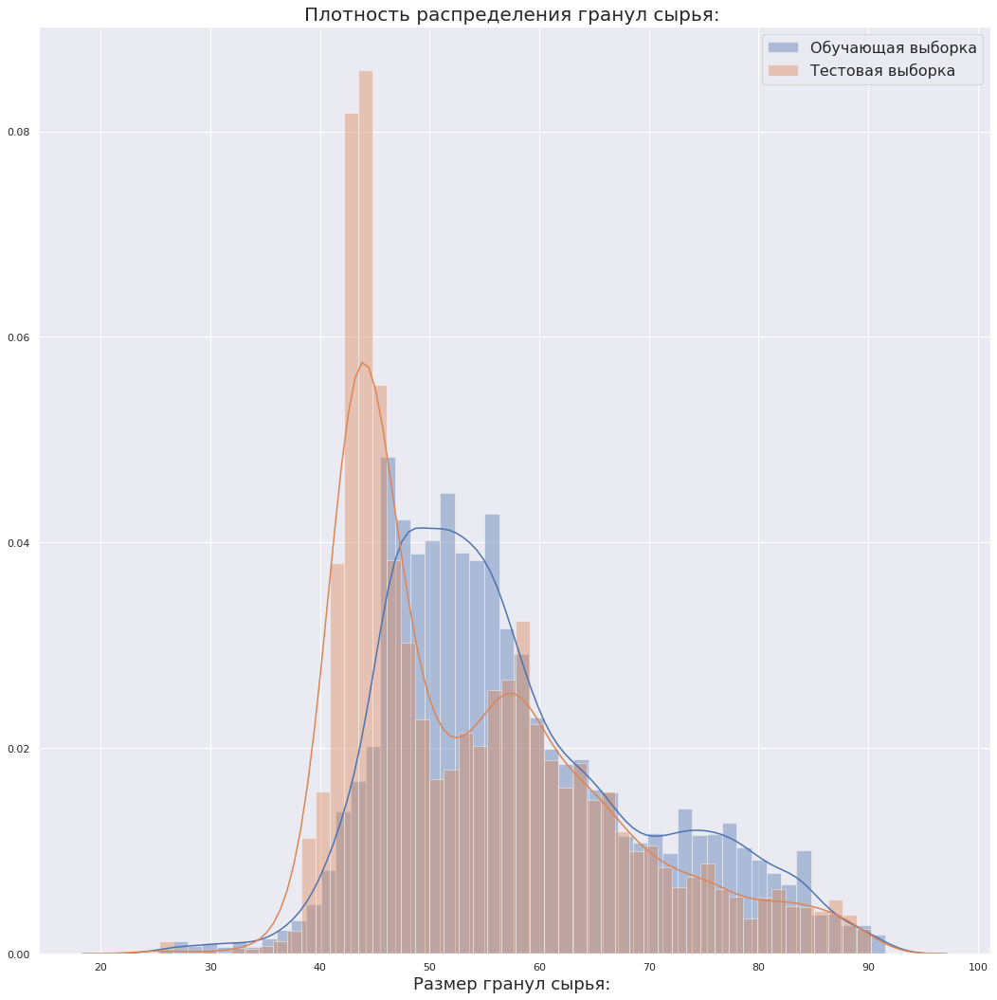

In [120]:
compare_feed_size(df_train, df_test, 50)

Так гораздо нагляднее. Видно, что распределения имеют различие, однако оценим распределения с помощью t-test.

Нулевая гипотеза H0: Средний размер гранул сырья в обучающей и тестовой одинаков.
Альтернативная гипотеза H1: Средний размер гранул сырья в обучающей и тестовой отличается.
Уровень значимости принимается: alpha = 0.05

In [121]:
#смотрим на дисперсию выборки train
df_train[(df_train['rougher.input.feed_size'] < up_train_threshold) & (df_train['rougher.input.feed_size'] > down_train_threshold)]['rougher.input.feed_size'].describe()

count    13676.000000
mean        57.582623
std         11.933004
min         23.823357
25%         48.786094
50%         54.979350
75%         64.501232
max         91.557935
Name: rougher.input.feed_size, dtype: float64

In [122]:
#смотрим на дисперсию выборки test
df_test[(df_test['rougher.input.feed_size'] < up_test_threshold) & (df_test['rougher.input.feed_size'] > down_test_threshold)]['rougher.input.feed_size'].describe()

count    5109.000000
mean       53.832519
std        12.089850
min        25.334235
25%        43.797476
50%        49.963405
75%        60.964485
max        90.264723
Name: rougher.input.feed_size, dtype: float64

Дисперсии несильно отличаются (equal_var принимаем = True)
Для проверки гипотезы о равенстве среднего двух генеральных совокупностей по взятым из них выборкам (так как выборки не связаны между собой) используем метод scipy.stats.ttest_ind(array1, array_2, equal_var = True)

In [123]:
df_train_ttest = df_train[(df_train['rougher.input.feed_size'] < up_train_threshold) & (df_train['rougher.input.feed_size'] > down_train_threshold)]['rougher.input.feed_size']
df_test_ttest = df_test[(df_test['rougher.input.feed_size'] < up_test_threshold) & (df_test['rougher.input.feed_size'] > down_test_threshold)]['rougher.input.feed_size']

In [124]:
def ttest_performer(resolution_days):
    alpha = 0.05

    results = st.ttest_ind(df_train_ttest.groupby(df_train_ttest.index.round(f'{resolution_days}D')).mean(), 
                           df_test_ttest.groupby(df_test_ttest.index.round(f'{resolution_days}D')).mean(), 
                           equal_var = True) 
    print(f'Рассматриваем нулевую гипотезу о равенстве средних размеров гранул за {resolution_days} день/дней')
    print('p-значение', results.pvalue)

    if results.pvalue < alpha:
        print('Отвергаем нулевую гипотезу')
    else:
        print('Не получилось отвергнуть нулевую гипотезу')

In [125]:
ttest_performer(0.5)

Рассматриваем нулевую гипотезу о равенстве средних размеров гранул за 0.5 день/дней
p-значение 9.34998209368374e-08
Отвергаем нулевую гипотезу


In [126]:
ttest_performer(1)

Рассматриваем нулевую гипотезу о равенстве средних размеров гранул за 1 день/дней
p-значение 0.00015168262996302984
Отвергаем нулевую гипотезу


- По графику плотностей распределения размеров гранул сырья на обучающей и тестовой выборках можно сделать вывод, что они отличаются. 
- Отвергаем нулевую гипотезу (p << 0.05) о равных средних значений размеров гранул сырья за день в двух выборках.
- Возможно данный признак будет вносить искажение в модель. Проверим в будущем, будет ли работать модель лучше без данного признака.

### Исследование суммарной концентрации всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. 

In [127]:
#функция анализа концентраций по времени для определенной стадии
def concentr_sum_change_time_builder(data, resolution):

    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Суммарная концентрация металлов для этапов", fontsize=20)
    axes.set_ylabel("Суммарная концентрация металлов", fontsize=18)
    axes.set_xlabel("Время", fontsize=18)
    sns.lineplot(data=data.groupby(data.index.round(f'{resolution}D')).mean())
    plt.legend(fontsize=16)
    plt.show()
    
#функция анализа концентрация гистограммой   
def concentr_sum_change_hist_builder(data, bins):
    
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Плотность распределения суммарной концентрации металлов для этапов", fontsize=20)
    axes.set_xlabel("Суммарная концентрация металлов", fontsize=18)
    stages = ['rougher.input.feed_sum', 'rougher.output.concentrate_sum', 'final.output.concentrate_sum']
    for stage in stages:
        sns.distplot(data[stage], axlabel = "Суммарная концентрация металлов для этапов", label = stage,bins=bins)
    plt.legend(fontsize=16)
    plt.show()
    
def concentr_sum_analyzer(data, resolution, bins):
    print("Анализ суммарных концентраций")
    
    stages = ['rougher.input.feed', 'rougher.output.concentrate', 'final.output.concentrate']
    for stage in stages:
        data[f'{stage}_sum'] = (data[f'{stage}_au'] 
                      + data[f'{stage}_ag'] 
                      + data[f'{stage}_pb'] 
                      + data[f'{stage}_sol']
                     )
    data_stage = data[['rougher.input.feed_sum', 'rougher.output.concentrate_sum', 'final.output.concentrate_sum']]
    
    concentr_sum_change_time_builder(data_stage, resolution)
    concentr_sum_change_hist_builder(data_stage, bins)


Анализ суммарных концентраций


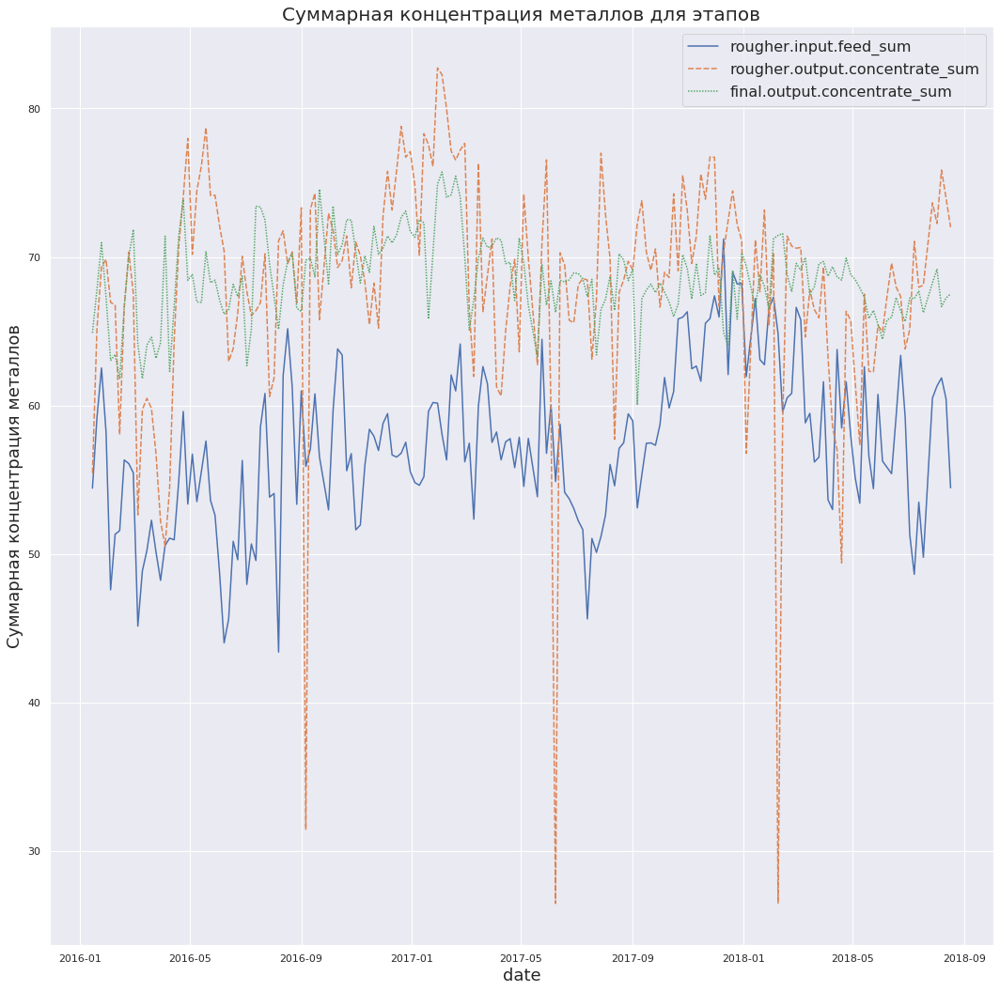

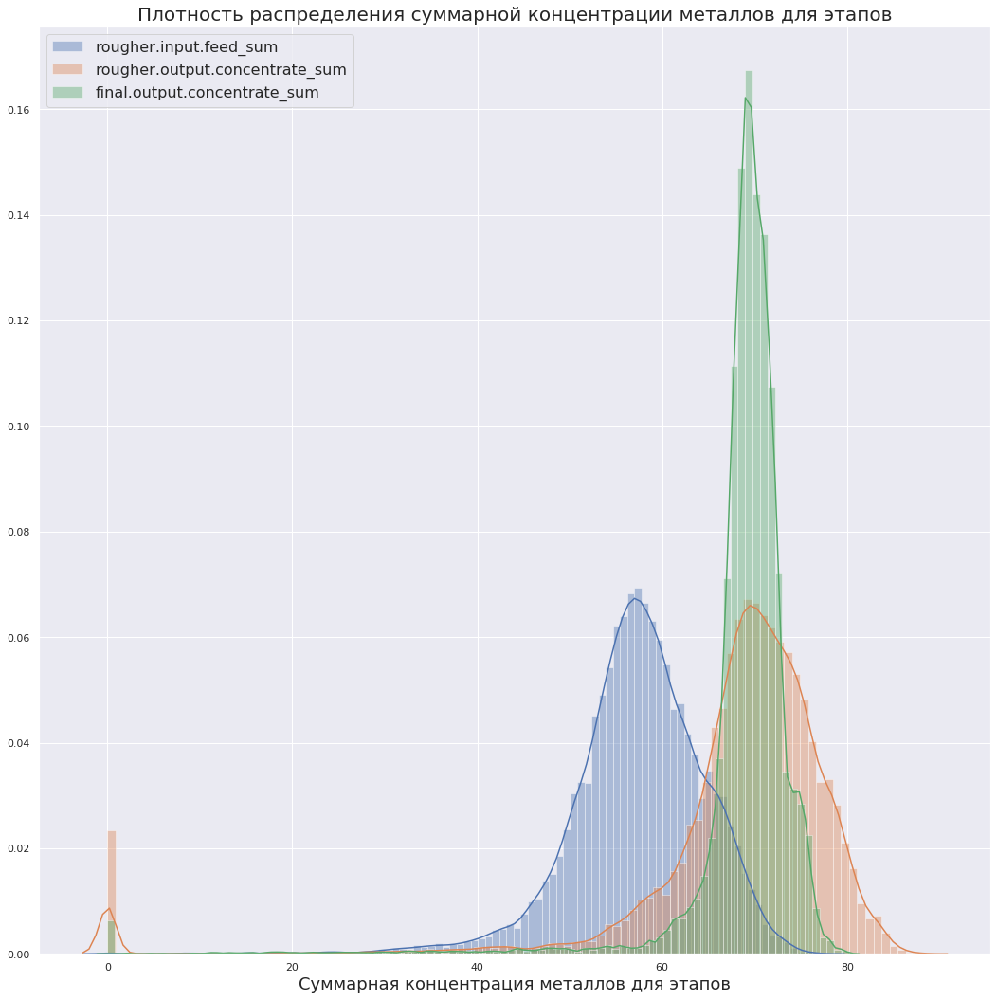

In [128]:
concentr_sum_analyzer(df_full, 5, 100)

Наблюдаем аномалии (нулевой пик). Посмотрим на графики без выбросов.

In [129]:
#функция анализа концентраций по времени для определенной стадии
def concentr_sum_change_time_builder_cleared(data, resolution):

    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Суммарная концентрация металлов для этапов", fontsize=20)
    axes.set_ylabel("Суммарная концентрация металлов", fontsize=18)
    axes.set_xlabel("Время", fontsize=18)
    sns.lineplot(data=data.groupby(data.index.round(f'{resolution}D')).mean())
    plt.legend(fontsize=16)
    plt.show()
    
#функция анализа концентрация гистограммой   
def concentr_sum_change_hist_builder_cleared(data, bins):
    
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(18,18))
    axes.set_title("Плотность распределения суммарной концентрации металлов для этапов", fontsize=20)
    axes.set_xlabel("Суммарная концентрация металлов", fontsize=18)
    stages = ['rougher.input.feed_sum', 'rougher.output.concentrate_sum', 'final.output.concentrate_sum']
    for stage in stages:
        sns.distplot(data[stage], axlabel = "Суммарная концентрация металлов для этапов", label = stage,bins=bins)
    plt.legend(fontsize=16)
    plt.show()
    
def anomaly_checker_cleared(data_column):
    anomaly_threshold_up = data_column.quantile(0.75) + (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    anomaly_threshold_down = data_column.quantile(0.25) - (data_column.quantile(0.75) - data_column.quantile(0.25)) * 1.5
    return anomaly_threshold_up, anomaly_threshold_down
    
def concentr_sum_analyzer_cleared(data, resolution, bins):
    print("Анализ суммарных концентраций")
    
    stages = ['rougher.input.feed', 'rougher.output.concentrate', 'final.output.concentrate']
    for stage in stages:
        data[f'{stage}_sum'] = (data[f'{stage}_au'] 
                      + data[f'{stage}_ag'] 
                      + data[f'{stage}_pb'] 
                      + data[f'{stage}_sol']
                     )
    data_stage = data[['rougher.input.feed_sum', 'rougher.output.concentrate_sum', 'final.output.concentrate_sum']]
    anomaly_threshold_stage_up, anomaly_threshold_stage_down = anomaly_checker_cleared(data_stage)
    data_stage = data_stage[(data_stage < anomaly_threshold_stage_up) & (data_stage > anomaly_threshold_stage_down)]
    concentr_sum_change_time_builder_cleared(data_stage, resolution)
    concentr_sum_change_hist_builder_cleared(data_stage, bins)


Анализ суммарных концентраций


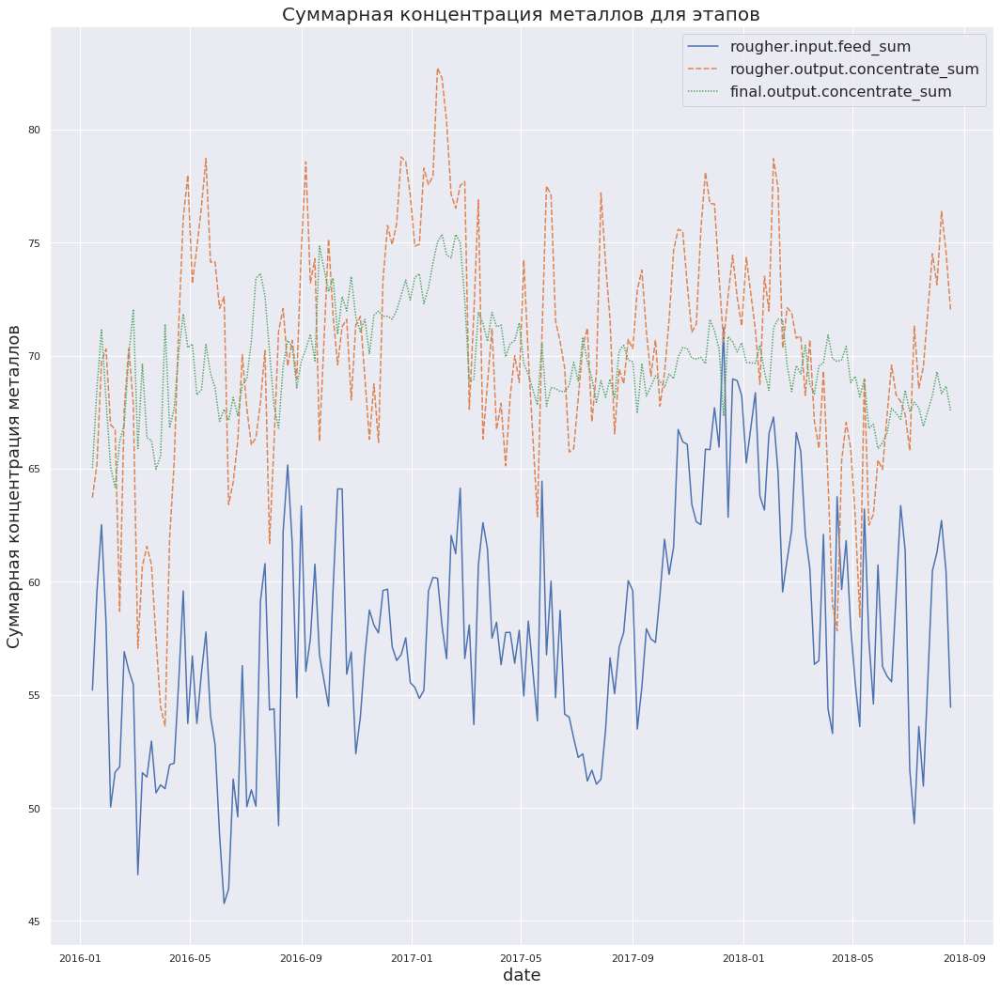

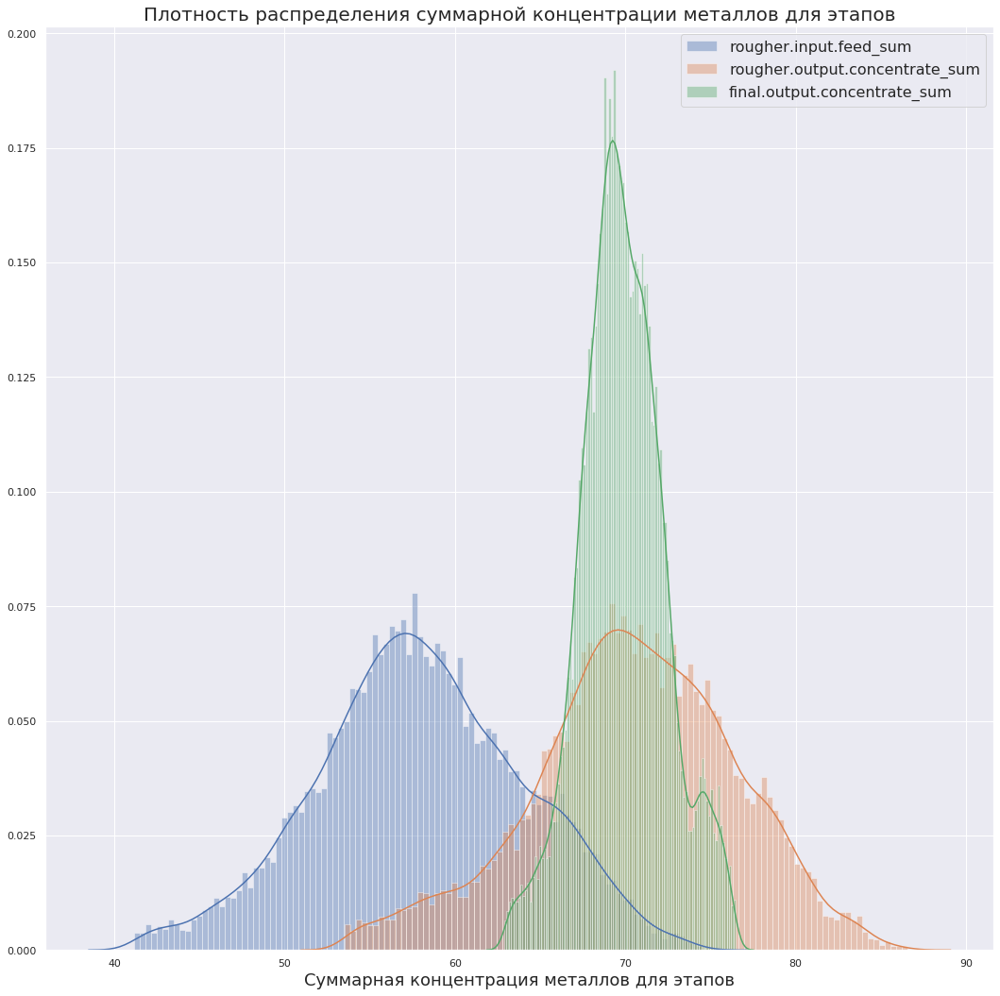

In [130]:
concentr_sum_analyzer_cleared(df_full, 5, 100)

- После флотации: Концентрация металлов увеличивается (примерно с 40-75% -> к 50-85%)
- После очистки (на выходе): Разброс значений концентраций металлов уменьшается (примерно с 50%-85% -> к 60-75%)

Посмотрим на нули в целевом признаке

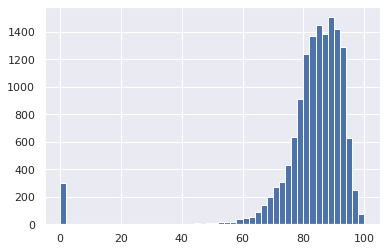

In [131]:
df_train['rougher.output.recovery'].hist(bins=50);

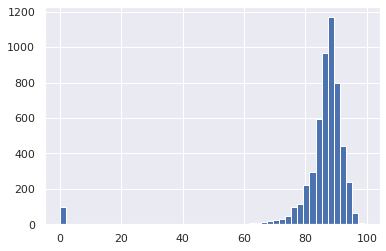

In [132]:
df_test['rougher.output.recovery'].hist(bins=50);

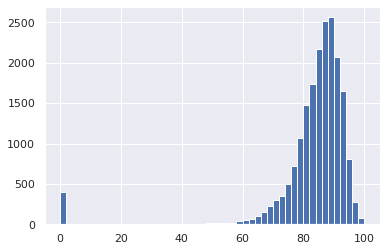

In [133]:
df_full['rougher.output.recovery'].hist(bins=50);

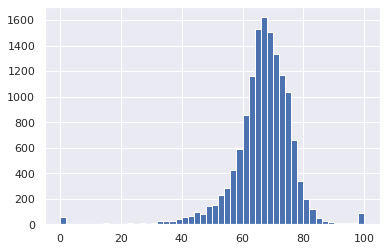

In [134]:
df_train['final.output.recovery'].hist(bins=50);

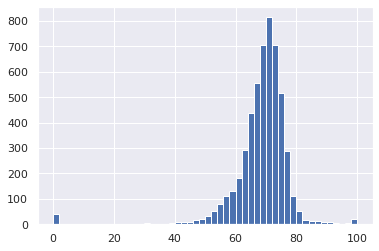

In [135]:
df_test['final.output.recovery'].hist(bins=50);

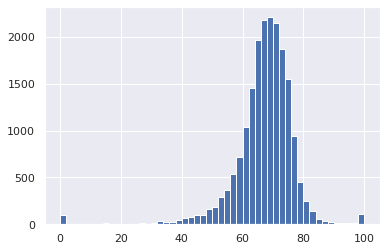

In [136]:
df_full['final.output.recovery'].hist(bins=50);

In [137]:
df_train[(df_train['final.output.recovery'] == 0) | (df_train['rougher.output.recovery'] == 0)][['final.output.recovery', 'rougher.output.recovery']].head(15)

,final.output.recovery,rougher.output.recovery
date,,
2016-01-16 21:00:00,68.403877,0.000000
2016-01-16 22:00:00,70.675633,0.000000
2016-01-16 23:00:00,55.088448,0.000000
2016-01-17 00:00:00,41.962008,0.000000
2016-01-17 02:00:00,49.884856,0.000000
2016-01-17 03:00:00,68.638723,0.000000
2016-01-17 04:00:00,72.136712,0.000000
2016-02-13 11:00:00,0.000000,68.960993
2016-02-18 20:00:00,80.041038,0.000000


По гистограммам видно, что 0 - не технологический показатель, а скорее выброс. Перед обучением и проверки модели ML заменим нулевые выбросы на число из ближайшего наблюдения. Также есть наблюдения с rougher recovery = 0, но final recovery > 0. Убеждаемся, что это некорректные значения.

Некоторые значения идут подряд, возможно это слегка повлияет на качество прогнозирования. Однако, сохраним эти данные для связи по остальным столбцам.

In [138]:
def zero_filling(data, set_name):
    print(f"Количество наблюдений в {set_name} выборке:", data.shape[0])
    print(f"Число нулей в {set_name} выборке до заполнения нулей:", data[(data['final.output.recovery'] == 0) | (data['rougher.output.recovery'] == 0)].shape[0])

    data_pr = data.copy(deep=True)
    for i in range(len(data_pr)):
        if  (data_pr['final.output.recovery'].iloc[i] == 0):
            data_pr['final.output.recovery'].iloc[i] = data_pr['final.output.recovery'].iloc[i - 1]
        if (data_pr['rougher.output.recovery'].iloc[i] == 0):
            data_pr['rougher.output.recovery'].iloc[i] = data_pr['rougher.output.recovery'].iloc[i - 1]
    print(f"Число нулей в {set_name} выборке после заполнения нулей:", data_pr[(data_pr['final.output.recovery'] == 0) | (data_pr['rougher.output.recovery'] == 0)].shape[0])

    return data_pr

In [139]:
df_train_pr = zero_filling(df_train, "обучающей")

Количество наблюдений в обучающей выборке: 14149
Число нулей в обучающей выборке до заполнения нулей: 354
Число нулей в обучающей выборке после заполнения нулей: 0


In [140]:
df_test_pr = zero_filling(df_test, "тестовой")

Количество наблюдений в тестовой выборке: 5290
Число нулей в тестовой выборке до заполнения нулей: 136
Число нулей в тестовой выборке после заполнения нулей: 0


In [141]:
df_full_pr = zero_filling(df_full, "исходной")

Количество наблюдений в исходной выборке: 19439
Число нулей в исходной выборке до заполнения нулей: 490
Число нулей в исходной выборке после заполнения нулей: 0


**Вывод по пункту 2:**

- Заметно увеличение концентрации золота от первой стадии флотации (15 - 25%) - ко второй стадии (после первой очистки) (25-40%) и к финальной стадии очистки (35 - 50%).
- Заметно снижение концентрации серебра от первой стадии флотации - ко второй стадии (после первой очистки)  и к финальной стадии очистки.
- Заметно увеличение концентрации свинца от первой стадии флотации - ко второй стадии (после первой очистки), и незаметное изменение к финальной стадии очистки (при этом диапазон концентраций к финальной стадии сужается по сравнению с второй стадией). 
- По графику плотностей распределения размеров гранул сырья на обучающей и тестовой выборках можно сделать вывод, что они отличаются. 
- Отвергаем нулевую гипотезу (p << 0.05) о равных средних значений размеров гранул сырья за день в двух выборках.
- Возможно данный признак будет вносить искажение в модель. Проверим в будущем, будет ли работать модель лучше без данного признака.
- После флотации: Концентрация металлов увеличивается (примерно с 40-75% -> к 50-85%)
- После очистки (на выходе): Разброс значений концентраций металлов уменьшается (примерно с 50%-85% -> к 60-75%)
- По гистограммам целевых признаков видно, что 0 - не технологический показатель, а скорее выброс. Перед обучением и проверки модели ML заменим нулевые выбросы на число из ближайшего наблюдения. Успешно заменили нули на соседние значения.

## Модель

### Функция для вычисления итоговой sMAPE

In [142]:
#функция sMAPE
def sMAPE(true_value, prediction):
    return 1 / len(true_value) * sum(abs(true_value - prediction) / ((abs(true_value) + abs(prediction)) / 2)) * 100

In [143]:
#функция итоговой sMAPE
def final_sMAPE(sMAPE_r, sMAPE_f):
    return 0.25 * sMAPE_r + 0.75 * sMAPE_f

Целевой признак зависит от двух составляющих. Построим две отдельные модели предсказания recovery после этапа флотации и recovery финального. Далее сложим полученные метрики для итоговой оценки предсказаний.

### Обучение моделей, оценка их качества кросс-валидацией. Проверка лучшей на тестовой выборке

Рассмотрим три модели: линейная регрессия, случайный лес и градиентный бустинг

Подготовим данные для предсказания recovery после флотации и recovery final.

In [144]:
print(len(df_train_pr.columns))
df_train_pr.columns

54


Index(['final.output.recovery', 'primary_cleaner.input.sulfate',
       'primary_cleaner.input.depressant', 'primary_cleaner.input.feed_size',
       'primary_cleaner.input.xanthate',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state.floatbank8_c_air',
       'primary_cleaner.state.floatbank8_c_level',
       'primary_cleaner.state.floatbank8_d_air',
       'primary_cleaner.state.floatbank8_d_level', 'rougher.input.feed_ag',
       'rougher.input.feed_pb', 'rougher.input.feed_rate',
       'rougher.input.feed_size', 'rougher.input.feed_sol',
       'rougher.input.feed_au', 'rougher.input.floatbank10_sulfate',
       'rougher.input.floatbank10_xanthate',
       'rougher.input.floatbank11_sulfate',
       'rougher.input.floatbank11_xanthate', 'rougher.output.recovery',
       'rougher.state.floatbank10_a_air', 

In [145]:
print(len(df_test_pr.columns))
df_test_pr.columns

54


Index(['primary_cleaner.input.sulfate', 'primary_cleaner.input.depressant',
       'primary_cleaner.input.feed_size', 'primary_cleaner.input.xanthate',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state.floatbank8_c_air',
       'primary_cleaner.state.floatbank8_c_level',
       'primary_cleaner.state.floatbank8_d_air',
       'primary_cleaner.state.floatbank8_d_level', 'rougher.input.feed_ag',
       'rougher.input.feed_pb', 'rougher.input.feed_rate',
       'rougher.input.feed_size', 'rougher.input.feed_sol',
       'rougher.input.feed_au', 'rougher.input.floatbank10_sulfate',
       'rougher.input.floatbank10_xanthate',
       'rougher.input.floatbank11_sulfate',
       'rougher.input.floatbank11_xanthate', 'rougher.state.floatbank10_a_air',
       'rougher.state.floatbank10_a_level', 'rougher.state.floatba

Подразделяем обучающую и тестовую выборки на группу флотации и финальную. Выделяем признаки и целевой признак.

In [146]:
columns_rougher = []
for column in df_train_pr.columns:
    if 'rougher' in column:
        columns_rougher.append(column)
        
columns_rougher

['rougher.input.feed_ag',
 'rougher.input.feed_pb',
 'rougher.input.feed_rate',
 'rougher.input.feed_size',
 'rougher.input.feed_sol',
 'rougher.input.feed_au',
 'rougher.input.floatbank10_sulfate',
 'rougher.input.floatbank10_xanthate',
 'rougher.input.floatbank11_sulfate',
 'rougher.input.floatbank11_xanthate',
 'rougher.output.recovery',
 'rougher.state.floatbank10_a_air',
 'rougher.state.floatbank10_a_level',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_c_air',
 'rougher.state.floatbank10_c_level',
 'rougher.state.floatbank10_d_air',
 'rougher.state.floatbank10_d_level',
 'rougher.state.floatbank10_e_air',
 'rougher.state.floatbank10_e_level',
 'rougher.state.floatbank10_f_air',
 'rougher.state.floatbank10_f_level']

In [147]:
df_train_rougher = df_train_pr[columns_rougher]
df_test_rougher = df_test_pr[columns_rougher]

In [148]:
features_train_rougher = df_train_rougher.drop( 'rougher.output.recovery', axis=1)
target_train_rougher = df_train_rougher['rougher.output.recovery']

features_train_final = df_train.drop( ['rougher.output.recovery', 'final.output.recovery'], axis=1)
target_train_final = df_train['final.output.recovery']

In [149]:
features_test_rougher = df_test_rougher.drop( 'rougher.output.recovery', axis=1)
target_test_rougher = df_test_rougher['rougher.output.recovery']

features_test_final = df_test_pr.drop( ['rougher.output.recovery', 'final.output.recovery'], axis=1)
target_test_final = df_test_pr['final.output.recovery']

In [150]:
#построение модели
def model_preparator(model_applied, model_applied_name, features_rougher, target_rougher, features_final, target_final):
    
    print("Размер обучающей выборки для этапа флотации, признаки и ответы: ",
          features_rougher.shape, "и ", target_rougher.shape)
    print("Размер обучающей выборки для финального этапа, признаки и ответы: ",
          features_final.shape, "и ", target_final.shape)
    #масштабируем данные
    scaler_rougher = StandardScaler()
    scaler_rougher.fit(features_rougher)
    features_rougher = scaler_rougher.transform(features_rougher)
    
    scaler_final = StandardScaler()
    scaler_final.fit(features_final)
    features_final = scaler_final.transform(features_final)
    
    #создаем модель
    model_rougher = model_applied
    model_final = model_applied
    
    #оцениваем модель
    sMAPE_scoring = metrics.make_scorer(sMAPE, greater_is_better = False)
    sMAPE_r = abs(cross_val_score(model_rougher, features_rougher, target_rougher, cv=5, scoring = sMAPE_scoring).mean())
    sMAPE_f = abs(cross_val_score(model_final, features_final, target_final, cv=5, scoring = sMAPE_scoring).mean())
    result_sMAPE = final_sMAPE(sMAPE_r, sMAPE_f)
    print(f'Модель: {model_applied_name}')
    print('sMAPE rougher: {:.2f} %'.format(sMAPE_r))
    print('sMAPE final: {:.2f} %'.format(sMAPE_f))
    print('result_sMAPE: {:.2f} %'.format(result_sMAPE))

# Линейная регрессия

In [151]:
model_preparator(LinearRegression(),
                 "Линейная регрессия",
                 features_train_rougher,
                 target_train_rougher,
                features_train_final,
                target_train_final
                )

Размер обучающей выборки для этапа флотации, признаки и ответы:  (14149, 22) и  (14149,)
Размер обучающей выборки для финального этапа, признаки и ответы:  (14149, 52) и  (14149,)
Модель: Линейная регрессия
sMAPE rougher: 6.72 %
sMAPE final: 12.25 %
result_sMAPE: 10.86 %


# Случайный лес

In [152]:
start = time.time()

rfr = RandomForestRegressor(random_state=12345)
parameters = { 'n_estimators': range (2, 5),
              'max_depth': range (1,5),
              'min_samples_leaf': range (1,5),
              'min_samples_split': range (2,5) }
grid = GridSearchCV(rfr, parameters, cv=5)
grid.fit(df_train_rougher, target_train_rougher)
print(grid.best_params_)

end = time.time()
print("Количество секунд нахождения оптимальных гиперпараметров модели: ", round(end - start, 2))

{'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 3}
Количество секунд нахождения оптимальных гиперпараметров модели:  92.3


In [153]:
best_params_rfc = {'max_depth': 4,
 'min_samples_leaf': 3,
 'min_samples_split': 4,
 'n_estimators': 4}

In [154]:
selected_rfr = RandomForestRegressor(max_depth= 4, min_samples_leaf = 3, min_samples_split = 4, n_estimators = 4, random_state=12345)
model_preparator(selected_rfr,
                 "Случайный лес",
                 features_train_rougher,
                 target_train_rougher,
                features_train_final,
                target_train_final
                )

Размер обучающей выборки для этапа флотации, признаки и ответы:  (14149, 22) и  (14149,)
Размер обучающей выборки для финального этапа, признаки и ответы:  (14149, 52) и  (14149,)
Модель: Случайный лес
sMAPE rougher: 7.15 %
sMAPE final: 10.32 %
result_sMAPE: 9.53 %


# Градиентный бустинг

In [155]:
start = time.time()

gbr = GradientBoostingRegressor()
parameters = { 'n_estimators': range (2, 5),
              'max_depth': range (1,5),
              'min_samples_leaf': range (1,5),
              'min_samples_split': range (2,5) }
grid = GridSearchCV(gbr, parameters, cv=5)
grid.fit(df_train_rougher, target_train_rougher)
grid.best_params_

end = time.time()
print("Количество секунд нахождения оптимальных гиперпараметров модели: ", round(end - start, 2))

Количество секунд нахождения оптимальных гиперпараметров модели:  50.97


In [156]:
best_params_rfc = {'max_depth': 4,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 4}

In [157]:
selected_gbr = RandomForestRegressor(max_depth= 4, min_samples_leaf = 1, min_samples_split = 4, n_estimators = 4, random_state=12345)
model_preparator(selected_gbr,
                 "Градиентный бустинг",
                 features_train_rougher,
                 target_train_rougher,
                features_train_final,
                target_train_final
                )

Размер обучающей выборки для этапа флотации, признаки и ответы:  (14149, 22) и  (14149,)
Размер обучающей выборки для финального этапа, признаки и ответы:  (14149, 52) и  (14149,)
Модель: Градиентный бустинг
sMAPE rougher: 7.11 %
sMAPE final: 10.33 %
result_sMAPE: 9.52 %


# Dummy модель

Dummy модель с предсказаниями, равные среднему по столбцу с ответами

In [158]:
dummy_array_r = np.array([df_train_rougher['rougher.output.recovery'].mean() for i in range(len(target_train_rougher))])
dummy_array_f = np.array([df_train_pr['final.output.recovery'].mean() for i in range(len(df_train_pr))])

sMAPE_r_dummy = sMAPE(target_train_rougher, dummy_array_r)
sMAPE_f_dummy = sMAPE(target_train_final, dummy_array_f)
result_sMAPE_dummy = final_sMAPE(sMAPE_r_dummy, sMAPE_f_dummy)

print('Модель: Dummy')
print('sMAPE rougher: {:.2f} %'.format(sMAPE_r_dummy))
print('sMAPE final: {:.2f} %'.format(sMAPE_f_dummy))
print('result_sMAPE: {:.2f} %'.format(result_sMAPE_dummy))

Модель: Dummy
sMAPE rougher: 7.35 %
sMAPE final: 11.08 %
result_sMAPE: 10.15 %


Для дальнейшего анализа будем рассматривать модель случайного леса (на данный момент с минимальным показателем result_sMAPE. 

In [159]:
#тестируем модель
def model_preparator_test(features_train_rougher, target_train_rougher,
                          features_train_final, target_train_final,
                          features_test_rougher, target_test_rougher,
                          features_test_final, target_test_final):
    

    scaler_rougher = StandardScaler()
    scaler_rougher.fit(features_train_rougher)
    features_train_rougher = scaler_rougher.transform(features_train_rougher)
    features_test_rougher = scaler_rougher.transform(features_test_rougher)
    
    scaler_final = StandardScaler()
    scaler_final.fit(features_train_final)
    features_train_final = scaler_final.transform(features_train_final)
    features_test_final = scaler_final.transform(features_test_final)
    
    #создаем модель
    model_rougher = RandomForestRegressor(max_depth= 4,
                                          min_samples_leaf = 3,
                                          min_samples_split = 4,
                                          n_estimators = 4,
                                          random_state=12345)
    model_final = RandomForestRegressor(max_depth= 4,
                                          min_samples_leaf = 3,
                                          min_samples_split = 4,
                                          n_estimators = 4,
                                          random_state=12345)
    
    model_rougher.fit(features_train_rougher, target_train_rougher)
    predictions_rougher = model_rougher.predict(features_test_rougher)
    
    model_final.fit(features_train_final, target_train_final)
    predictions_final = model_final.predict(features_test_final)
    
    #оцениваем модель
    sMAPE_r = sMAPE(target_test_rougher, predictions_rougher)
    sMAPE_f = sMAPE(target_test_final, predictions_final)
    result_sMAPE = final_sMAPE(sMAPE_r, sMAPE_f)
    print(f'Модель: Случайный лес')
    print('sMAPE rougher: {:.2f} %'.format(sMAPE_r))
    print('sMAPE final: {:.2f} %'.format(sMAPE_f))
    print('result_sMAPE: {:.2f} %'.format(result_sMAPE))

In [160]:
model_preparator_test(features_train_rougher, target_train_rougher,
                          features_train_final, target_train_final,
                          features_test_rougher, target_test_rougher,
                          features_test_final, target_test_final)


Модель: Случайный лес
sMAPE rougher: 5.07 %
sMAPE final: 8.41 %
result_sMAPE: 7.58 %


Необходимо проверить:
- улучшит ли удаление признака feed_size итоговую метрику на тестовой выборке (так как у них разное распределение)
- какие признаки являются наиболее важными для предсказания

**Осмотр важности параметров произведем с помощью feature_importance**

In [161]:
def feature_importance(features_train, target_train, name):
    model = RandomForestRegressor(n_estimators=4,
                                   max_depth=4,
                                   min_samples_split=4,
                                   min_samples_leaf=2,
                                   random_state=12345)
    model.fit(features_train, target_train)
    #importances:
    importances = model.feature_importances_
    feature_names = features_train.columns.to_list()
    #standart deviation:
    std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
    #forest importances как вектор данных:
    forest_importances = pd.Series(importances, index=feature_names)
    #строим график:
    #fig, ax = plt.subplots()
    plt.figure(figsize=(10,10))
    forest_importances.plot.bar(yerr=std)
    plt.title("Feature importances using MDI", fontsize=18)
    plt.ylabel("Mean decrease in impurity", fontsize=16)
    plt.show()
    print(f"Топ-10 значимых признаков для предикции эффективности обогащения после {name}")
    print(forest_importances.sort_values(ascending=False).head(10))

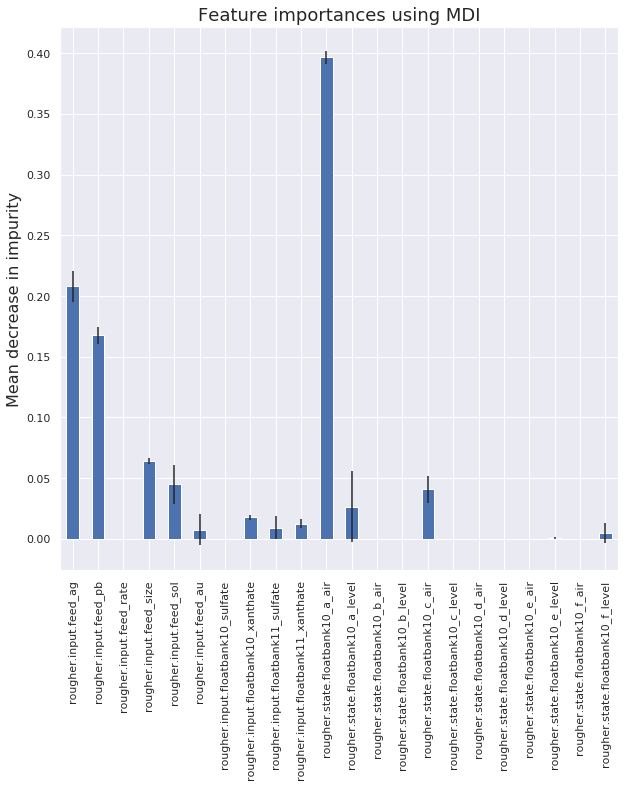

Топ-10 значимых признаков для предикции эффективности обогащения после флотации
rougher.state.floatbank10_a_air       0.396375
rougher.input.feed_ag                 0.207849
rougher.input.feed_pb                 0.167689
rougher.input.feed_size               0.063929
rougher.input.feed_sol                0.044713
rougher.state.floatbank10_c_air       0.040655
rougher.state.floatbank10_a_level     0.026553
rougher.input.floatbank10_xanthate    0.017654
rougher.input.floatbank11_xanthate    0.012580
rougher.input.floatbank11_sulfate     0.009095
dtype: float64


In [162]:
feature_importance(features_train_rougher, target_train_rougher, "флотации")

В основном значимые признаки - входное сырье + rougher.state.floatbank10_a_air

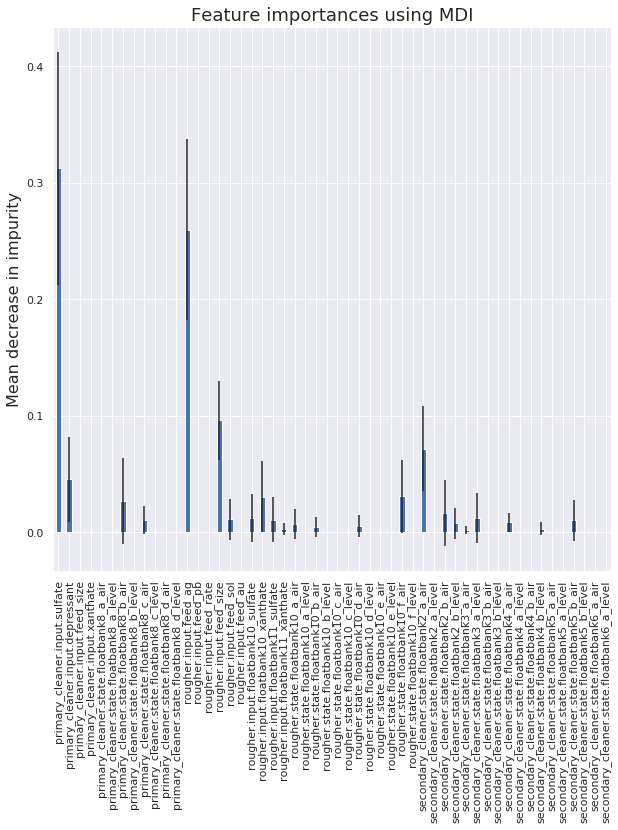

Топ-10 значимых признаков для предикции эффективности обогащения после очистки
primary_cleaner.input.sulfate                 0.312562
rougher.input.feed_ag                         0.259880
rougher.input.feed_size                       0.096039
secondary_cleaner.state.floatbank2_a_air      0.071915
primary_cleaner.input.depressant              0.045415
rougher.state.floatbank10_f_air               0.030985
rougher.input.floatbank10_xanthate            0.030400
primary_cleaner.state.floatbank8_b_air        0.026995
secondary_cleaner.state.floatbank2_b_air      0.016585
secondary_cleaner.state.floatbank3_a_level    0.012234
dtype: float64


In [163]:
feature_importance(features_train_final, target_train_final, "очистки")

Здесь сложно выделить какую-то конкретную группу (в топе находятся разные стадии разных типов признаков)

**Обучение и тестирование модели без признака feed_size**

In [164]:
#обучение
selected_rfr_test = RandomForestRegressor(max_depth= 4, min_samples_leaf = 3, min_samples_split = 4, n_estimators = 4, random_state=12345)
model_preparator(selected_rfr_test,
                 "Случайный лес",
                 features_test_rougher.drop('rougher.input.feed_size',axis=1),
                 target_test_rougher,
                features_test_final.drop('rougher.input.feed_size',axis=1),
                target_test_final
                )

Размер обучающей выборки для этапа флотации, признаки и ответы:  (5290, 21) и  (5290,)
Размер обучающей выборки для финального этапа, признаки и ответы:  (5290, 51) и  (5290,)
Модель: Случайный лес
sMAPE rougher: 4.73 %
sMAPE final: 7.95 %
result_sMAPE: 7.15 %


In [165]:
#тестирование
model_preparator_test(features_train_rougher.drop('rougher.input.feed_size',axis=1), target_train_rougher,
                          features_train_final.drop('rougher.input.feed_size',axis=1), target_train_final,
                          features_test_rougher.drop('rougher.input.feed_size',axis=1), target_test_rougher,
                          features_test_final.drop('rougher.input.feed_size',axis=1), target_test_final)


Модель: Случайный лес
sMAPE rougher: 5.07 %
sMAPE final: 9.05 %
result_sMAPE: 8.05 %


Распределение признака rougher.input.feed_size в двух выборках разная, вследствие чего оценка модели производилась неверно. После удаления данного признака получили следующие результаты:

Обучение (Модель cлучайного леса):
sMAPE rougher (после флотации): 4.73 %
sMAPE final (на выходе): 7.95 %
result_sMAPE: 7.15 %

Тестирование (Модель cлучайного леса):
sMAPE rougher (после флотации): 5.07 %
sMAPE final (на выходе): 9.05 %
result_sMAPE: 8.05 %

**Выводы по пункту 3:**

- Рассмотрели три модели: линейная регрессия, случайный лес и градиентный бустинг 
- Лучшая имплементация на обучающей выборке у модели случайного леса ({'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 4}), худшая - у константной модели Dummy. Гиперпараметры моделей определены с помощью GridSearchCV
- Вывели топ значимых признаков для предикции эффективности обогащения после очистки. 
- 1. Для флотации: rougher.state.floatbank10_a_air, rougher.input.feed_ag, rougher.input.feed_pb, rougher.input.feed_size, rougher.input.feed_sol
- 2. Для очистки primary_cleaner.input.sulfate, rougher.input.feed_ag, rougher.input.feed_size, secondary_cleaner.state.floatbank2_a_air
- Распределение признака rougher.input.feed_size в двух выборках разная, вследствие чего оценка модели производилась неверно. После удаления данного признака получили следующие результаты:

1. Обучение (Модель cлучайного леса):
- sMAPE rougher (после флотации): 4.73 %
- sMAPE final (на выходе): 7.95 %
- result_sMAPE: 7.15 %

2. Тестирование (Модель cлучайного леса):
- sMAPE rougher (после флотации): 5.07 %
- sMAPE final (на выходе): 9.05 %
- result_sMAPE: 8.05 %

Для Dummy модели получили метрику result_sMAPE: 10.15 % > 8.05 %, что означает, что модель случайного леса справилась с предсказаниями лучше константной.

## Общий вывод

- В обучающей выборке 14149 наблюдений и 86 признаков, наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 
- В тестовой выборке 5290 наблюдений и 52 признака, наблюдаем незначительные пропуски по некоторым параметрам, дубликатов нет
- В исходном датасете 19439 наблюдений и 86 признаков, наблюдаем пропуски по ряду параметров, дубликатов нет, для ряда параметров (например, final output concentration, tails, recovery) минимальное значение = 0 
- Для ряда параметров наблюдали нулевые пики
- Доля выбросов по параметрам state.floatbank_level для primary/secondary cleaner (до 25%) значительно превышает долю выбросов по остальным параметрам (до 10% - значительный показатель).
- Масштабы распределений различаются, использовали нормализацию.
- Пропуски успешно заполнены с помощью соседних наблюдений

- Заметно увеличение концентрации золота от первой стадии флотации (15 - 25%) - ко второй стадии (после первой очистки) (25-40%) и к финальной стадии очистки (35 - 50%).
- Заметно снижение концентрации серебра от первой стадии флотации - ко второй стадии (после первой очистки)  и к финальной стадии очистки.
- Заметно увеличение концентрации свинца от первой стадии флотации - ко второй стадии (после первой очистки), и незаметное изменение к финальной стадии очистки (при этом диапазон концентраций к финальной стадии сужается по сравнению с второй стадией). 
- По графику плотностей распределения размеров гранул сырья на обучающей и тестовой выборках можно сделать вывод, что они отличаются. 
- Отвергаем нулевую гипотезу (p << 0.05) о равных средних значений размеров гранул сырья за день в двух выборках. Этот признак вносил искажение в предикцию в обучающей/тестовой выборках.
- После флотации: Концентрация металлов увеличивается (примерно с 40-75% -> к 50-85%)
- После очистки (на выходе): Разброс значений концентраций металлов уменьшается (примерно с 50%-85% -> к 60-75%)
- По гистограммам целевых признаков видно, что 0 - не технологический показатель, а скорее выброс. Перед обучением и проверки модели ML заменили нулевые выбросы на число из ближайшего наблюдения. Успешно заменили нули на соседние значения.

- Рассмотрели три модели: линейная регрессия, случайный лес и градиентный бустинг 
- Лучшая имплементация на обучающей выборке у модели случайного леса ({'max_depth': 4, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 4}), худшая - у константной модели Dummy. Гиперпараметры моделей определены с помощью GridSearchCV
- Вывели топ значимых признаков для предикции эффективности обогащения после очистки. 
- 1. Для флотации: rougher.state.floatbank10_a_air, rougher.input.feed_ag, rougher.input.feed_pb, rougher.input.feed_size, rougher.input.feed_sol
- 2. Для очистки primary_cleaner.input.sulfate, rougher.input.feed_ag, rougher.input.feed_size, secondary_cleaner.state.floatbank2_a_air

- Распределение признака rougher.input.feed_size в двух выборках разная, вследствие чего оценка модели производилась неверно. После удаления данного признака получили следующие результаты:

1. Обучение (Модель cлучайного леса):
- sMAPE rougher (после флотации): 4.73 %
- sMAPE final (на выходе): 7.95 %
- result_sMAPE: 7.15 %

2. Тестирование (Модель cлучайного леса):
- sMAPE rougher (после флотации): 5.07 %
- sMAPE final (на выходе): 9.05 %
- result_sMAPE: 8.05 %

Для Dummy модели получили метрику result_sMAPE: 10.15 % > 8.05 %, что означает, что модель случайного леса справилась с предсказаниями лучше константной.